<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Stocks/Belgium/Solvay/Solvay_1H_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.display import clear_output
import pandas as pd

if pd.__version__ != '0.25.0' or False:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git pandas==0.25.0
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)
  print('RESTARTING')
  %cd /content
  
  # force restart
  import os
  os.kill(os.getpid(), 9)

In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "SOLBBEEUR"
data_resample = '1H'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2018'
finish_date = '1 Jan 2019'
is_duka = True
is_yahoo = False
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe'] # True for all , ['All','Fwe','RFE','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
is_EDA = True
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

2019-08-25 15:52:11,309 - findatapy.market.datavendorweb - INFO - Request Dukascopy data
2019-08-25 15:52:11,314 - findatapy.market.datavendorweb - INFO - About to download from Dukascopy... for SOLBBEEUR
2019-08-25 15:56:07,425 - findatapy.market.datavendorweb - INFO - Downloading... 2018-01-30 00:00:00
2019-08-25 16:04:16,247 - findatapy.market.datavendorweb - INFO - Downloading... 2018-03-30 00:00:00
2019-08-25 16:08:36,369 - findatapy.market.datavendorweb - INFO - Downloading... 2018-04-30 00:00:00
2019-08-25 16:12:48,958 - findatapy.market.datavendorweb - INFO - Downloading... 2018-05-30 00:00:00
2019-08-25 16:17:11,969 - findatapy.market.datavendorweb - INFO - Downloading... 2018-06-30 00:00:00
2019-08-25 16:21:13,078 - findatapy.market.datavendorweb - INFO - Downloading... 2018-07-30 00:00:00
2019-08-25 16:25:35,333 - findatapy.market.datavendorweb - INFO - Downloading... 2018-08-30 00:00:00
2019-08-25 16:29:49,490 - findatapy.market.datavendorweb - INFO - Downloading... 2018-09

/usr/local/lib/python3.6/dist-packages/findatapy/market/ioengine.py:264: FutureWarning: to_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  r.set(fname, data_frame.to_msgpack(compress='blosc'))


2019-08-25 16:41:53,199 - findatapy.market.ioengine - WARNING - Couldn't push MarketDataRequest_445__abstract_curve_key-None__category-None__category_key-backtest_default-cat_dukascopy_tick_NYC_SOLBBEEUR__cut-NYC__data_source-dukascopy__environment-backtest__expiry_date-NaT__fields-temp_ask_bid_askv_bidv__finish_date-2019-01-01 00:00:00__freq-tick__freq_mult-1__gran_freq-None__resample-None__resample_how-last__start_date-2018-01-01 00:00:00__tickers-SOLBBEEUR__trade_side-trade__vendor_fields-temp_ask_bid_askv_bidv__vendor_tickers-SOLBBEEUR to Redis: Error 111 connecting to 127.0.0.1:6379. Connection refused.


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-02 08:00:00,1.15985,1.15998,1.14733,1.15085,2.480151
2018-01-02 09:00:00,1.15085,1.15348,1.14737,1.14883,2.207122
2018-01-02 10:00:00,1.14898,1.15248,1.14797,1.14897,1.461260
2018-01-02 11:00:00,1.14898,1.14998,1.14835,1.14939,0.588995
2018-01-02 12:00:00,1.14936,1.15098,1.14897,1.14985,0.510376
2018-01-02 13:00:00,1.14985,1.14997,1.14488,1.14497,0.802521
2018-01-02 14:00:00,1.14539,1.15048,1.14447,1.14947,0.953566
2018-01-02 15:00:00,1.14947,1.14998,1.14736,1.14747,0.884154
2018-01-02 16:00:00,1.14748,1.14948,1.14647,1.14798,0.605079


,Open,High,Low,Close,Volume
count,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000
mean,1.103510,1.106323,1.100446,1.103346,1.255413
std,0.079594,0.079270,0.080166,0.079829,1.280232
min,0.856180,0.861380,0.854370,0.856170,0.000357
25%,1.077730,1.080980,1.073970,1.077970,0.481376
50%,1.131970,1.134980,1.128970,1.131980,0.789568
75%,1.155980,1.158480,1.153470,1.155970,1.460209
max,1.202970,1.205980,1.199970,1.202980,9.230093


25

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,6
Number of observations,2275
Total Missing (%),0.0%
Total size in memory,62.3 KiB
Average record size in memory,28.1 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,3


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import uuid
import os


features_dataset = pd.read_pickle('full_dataset').sort_index()


periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
timeperiods = [8, 12, 14, 20, 24, 30]
matypes = range(9)
nbdevs = [2, 3, 4, 5]

# date features
features_dataset['day'] = features_dataset.index.day
features_dataset['dayofweek'] = features_dataset.index.dayofweek
features_dataset['dayofyear'] = features_dataset.index.dayofyear
features_dataset['days_in_month'] = features_dataset.index.days_in_month
features_dataset['hour'] = features_dataset.index.hour
features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
features_dataset['minute'] = features_dataset.index.minute
features_dataset['month'] = features_dataset.index.month
features_dataset['quarter'] = features_dataset.index.quarter
features_dataset['second'] = features_dataset.index.second
features_dataset['week'] = features_dataset.index.week
features_dataset['weekday'] = features_dataset.index.weekday
features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
features_dataset['weekofyear'] = features_dataset.index.weekofyear

# Overlap Studies
features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                    offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                    accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                    accelerationshort=-4e37, accelerationmaxshort=-4e37)

for timeperiod in timeperiods:
    features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                           acceleration=timeperiod / 100,
                                                           maximum=timeperiod / 100)
    features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

    for matype in matypes:
        features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                           timeperiod=timeperiod, matype=matype)
        features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                               minperiod=2,
                                                                               maxperiod=timeperiod, matype=matype)
        features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                           timeperiod=timeperiod,
                                                                           vfactor=matype / 10)

        for nbdev in nbdevs:
            features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
            features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

            
gc.collect()
# Momentum Indicators
features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                              features_dataset['Close'])

for timeperiod in timeperiods:
    features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
        features_dataset['High'],
        features_dataset['Low'],
        timeperiod=timeperiod)
    features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                   features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
        'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
    features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], features_dataset['Volume'],
                                                     timeperiod=timeperiod)
    features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                               features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                               timeperiod=timeperiod)
    features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                             features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                             timeperiod=timeperiod)
    features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                         features_dataset['Close'], timeperiod=timeperiod)

    
gc.collect()
features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
    features_dataset['Close'], fastperiod=12,
    slowperiod=26,
    signalperiod=9)
features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
    features_dataset['Close'],
    fastperiod=12,
    fastmatype=0,
    slowperiod=26,
    slowmatype=0,
    signalperiod=9,
    signalmatype=0)

features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                         features_dataset['Low'],
                                                                         features_dataset['Close'], fastk_period=5,
                                                                         slowk_period=3, slowk_matype=0,
                                                                         slowd_period=3, slowd_matype=0)
features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                            features_dataset['Low'],
                                                                            features_dataset['Close'], fastk_period=5,
                                                                            fastd_period=3, fastd_matype=0)
features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                  timeperiod=14,
                                                                                  fastk_period=5, fastd_period=3,
                                                                                  fastd_matype=0)
features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    timeperiod1=7, timeperiod2=14, timeperiod3=28)

# Volume Indicators
features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                            features_dataset['Volume'])
features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                  features_dataset['Volume'], fastperiod=3, slowperiod=10)
features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

gc.collect()
# Volatility Indicators
for timeperiod in timeperiods:
    features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                     features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                       features_dataset['Close'], timeperiod=timeperiod)

features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

# Price Transform
features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

gc.collect()
# Cycle Indicators
features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

# Pattern Recognition
features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'],
                                                        penetration=0)
features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                      features_dataset['Close'])
features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'], penetration=0)
features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'], penetration=0)
features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
gc.collect()

# Statistic Functions
for timeperiod in timeperiods:
    features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                       timeperiod=timeperiod)
    features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                           timeperiod=timeperiod)
    features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                     timeperiod=timeperiod)
    features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                             timeperiod=timeperiod)
    features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
    features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

    
gc.collect()
# Math Transform
features_dataset['ACOS'] = ACOS(features_dataset['Close'])
features_dataset['ASIN'] = ASIN(features_dataset['Close'])
features_dataset['ATAN'] = ATAN(features_dataset['Close'])
features_dataset['CEIL'] = CEIL(features_dataset['Close'])
features_dataset['COS'] = COS(features_dataset['Close'])
features_dataset['COSH'] = COSH(features_dataset['Close'])
features_dataset['EXP'] = EXP(features_dataset['Close'])
features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
features_dataset['LN'] = LN(features_dataset['Close'])
features_dataset['LOG10'] = LOG10(features_dataset['Close'])
features_dataset['SIN'] = SIN(features_dataset['Close'])
features_dataset['SINH'] = SINH(features_dataset['Close'])
features_dataset['SQRT'] = SQRT(features_dataset['Close'])
features_dataset['TAN'] = TAN(features_dataset['Close'])
features_dataset['TANH'] = TANH(features_dataset['Close'])

gc.collect()
# Math Operator
features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

for timeperiod in timeperiods:
    features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
        features_dataset['Close'], timeperiod=timeperiod)
    features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
    
gc.collect()


features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
features_dataset.to_pickle('features_dataset')
display(features_dataset)
display(features_dataset.describe())

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del periods, timeperiods, matypes, nbdevs, features_dataset, talib
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

36

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]][:-1]
label_df[data_label_name] = pd.DataFrame(features_dataset[data_label][1:].values / features_dataset[data_label][:-1].values,
                             index=label_df.index).clip(0,1).astype(int)

scaled_df = features_dataset
scaled_df = pd.DataFrame(minmax_scale(scaled_df, axis=0, feature_range=(0, 1)), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale
gc.collect()

,Open,High,Low,Close,Volume,day,dayofweek,dayofyear,days_in_month,hour,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_7,MAVP_8_7,T3_8_7,BBANDS_upperband_8_7_2,BBANDS_middleband_8_7_2,BBANDS_lowerband_8_7_2,BBANDS_upperband_8_7_3,BBANDS_middleband_8_7_3,BBANDS_lowerband_8_7_3,BBANDS_upperband_8_7_4,BBANDS_middleband_8_7_4,BBANDS_lowerband_8_7_4,BBANDS_upperband_8_7_5,BBANDS_middleband_8_7_5,BBANDS_lowerband_8_7_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBA

139986

In [8]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import uuid
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*0.7),int(len(train_hf)*0.9)]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,4 hours 32 mins
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,2 months and 6 days
H2O cluster name:,H2O_from_python_unknownUser_bxe2sn
H2O cluster total nodes:,1
H2O cluster free memory:,8.96 Gb
H2O cluster total cores:,2
H2O cluster allowed cores:,2
H2O cluster status:,"locked, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo,project_name=str(uuid.uuid4()))
      t_hf = (training_frame or train_hf)

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=t_hf[index_splits[0]:index_splits[1],:], leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except KeyboardInterrupt:
      return None
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    start_idx = max(-index_splits[1],-20)
    predicted = aml.leader.predict(t_hf[start_idx:,:])
    predicted = predicted.as_data_frame()[['predict']]
    predict_df = pd.read_pickle('predict_df')[start_idx:]
    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper right')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)
    h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
    gc.collect()

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  h2o.remove([h2o_key for h2o_key in list(h2o.ls()['key'].values) if (train_hf.frame_id != h2o_key and t_hf.frame_id != h2o_key)])
  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.527254,0.693554,0.487179,0.500206,0.250206
1,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.512256,1.387691,0.491453,0.632112,0.399566
2,DeepLearning_1_AutoML_20190825_164949,0.500000,0.695305,0.500000,0.501077,0.251079
3,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.500000,0.696917,0.500000,0.501880,0.251883
4,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.500000,0.693956,0.500000,0.500404,0.250404
5,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.500000,0.837258,0.500000,0.560823,0.314523
6,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.495807,0.699227,0.487179,0.502966,0.252975
7,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.478874,0.735594,0.500000,0.518962,0.269322
8,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.477423,6.218673,0.500000,0.674300,0.454681
9,DeepLearning_grid_1_AutoML_20190825_164949_mod...,0.469118,1.326223,0.495726,0.637371,0.406242


,variable,relative_importance,scaled_importance,percentage
0,CORREL_8,1.000000,1.000000,0.001296
1,CORREL_12,0.974915,0.974915,0.001263
2,BOP,0.973425,0.973425,0.001261
3,STOCHRSI_fastk,0.965592,0.965592,0.001251
4,STOCHRSI_fastd,0.963188,0.963188,0.001248
5,BETA_14,0.953259,0.953259,0.001235
6,aroondown_14,0.950871,0.950871,0.001232
7,hour,0.950344,0.950344,0.001231
8,HT_TRENDMODE,0.948334,0.948334,0.001229
9,BETA_30,0.945629,0.945629,0.001225


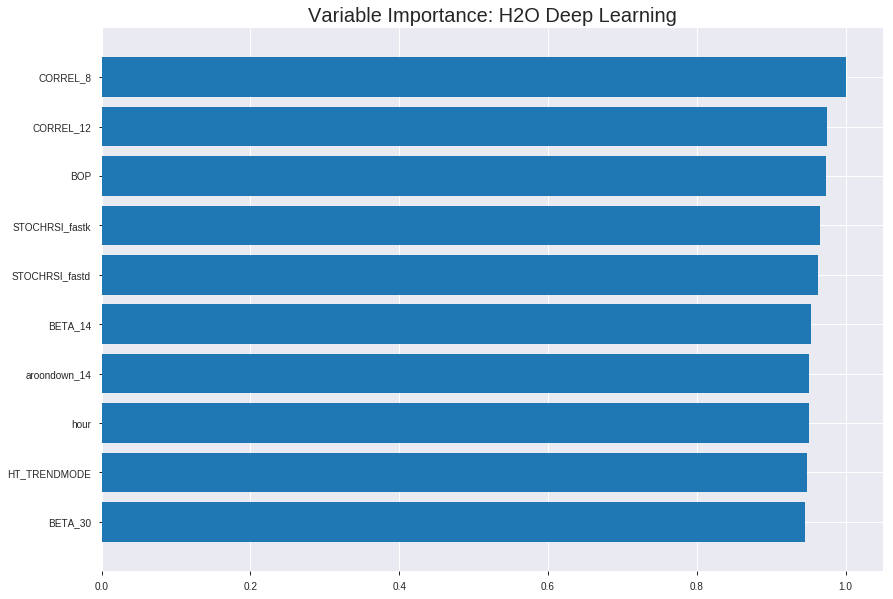

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_164949_model_5


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.24606022851927545
RMSE: 0.4960445831971915
LogLoss: 0.6849889974513851
Mean Per-Class Error: 0.45628140703517595
AUC: 0.5612585956096271
pr_auc: 0.6112628068137935
Gini: 0.1225171912192542
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.43915549794459935: 


,0,1,Error,Rate
0,34.0,726.0,0.9553,(726.0/760.0)
1,12.0,784.0,0.0151,(12.0/796.0)
Total,46.0,1510.0,0.4743,(738.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4391555,0.6799653,357.0
max f2,0.3880983,0.8398396,398.0
max f0point5,0.4775630,0.5768005,268.0
max accuracy,0.5174892,0.5482005,138.0
max precision,0.8824336,1.0,0.0
max recall,0.3880983,1.0,398.0
max specificity,0.8824336,1.0,0.0
max absolute_mcc,0.5478155,0.1354902,55.0
max min_per_class_accuracy,0.5256471,0.4263158,99.0
max mean_per_class_accuracy,0.5174892,0.5437186,138.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.58 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.6706477,1.8326005,1.8326005,0.9375,0.7270482,0.9375,0.7270482,0.0188442,0.0188442,83.2600503,83.2600503
,2,0.0205656,0.5854747,1.3439070,1.5882538,0.6875,0.6236002,0.8125,0.6753242,0.0138191,0.0326633,34.3907035,58.8253769
,3,0.0302057,0.5558553,1.8244556,1.6636373,0.9333333,0.5660060,0.8510638,0.6404354,0.0175879,0.0502513,82.4455611,66.3637336
,4,0.0404884,0.5477762,1.5882538,1.6444923,0.8125,0.5520035,0.8412698,0.6179765,0.0163317,0.0665829,58.8253769,64.4492303
,5,0.0501285,0.5411840,1.1728643,1.5537946,0.6,0.5444002,0.7948718,0.6038272,0.0113065,0.0778894,17.2864322,55.3794614
,6,0.6105398,0.5256474,1.0154961,1.0596932,0.5194954,0.5260242,0.5421053,0.5324122,0.5690955,0.6469849,1.5496058,5.9693203
,7,0.6998715,0.5165705,1.0547341,1.0590602,0.5395683,0.5214113,0.5417815,0.5310081,0.0942211,0.7412060,5.4734102,5.9060223
,8,0.8001285,0.5018433,0.9022033,1.0394059,0.4615385,0.5097026,0.5317269,0.5283385,0.0904523,0.8316583,-9.7796676,3.9405865
,9,0.8997429,0.4675150,0.9206354,1.0262563,0.4709677,0.4871561,0.525,0.5237790,0.0917085,0.9233668,-7.9364565,2.6256281
,10,1.0,0.3841500,0.7643667,1.0,0.3910256,0.4437494,0.5115681,0.5157555,0.0766332,1.0,-23.5633295,0.0




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.2486485770738944
RMSE: 0.49864674577690205
LogLoss: 0.6904318046412793
Mean Per-Class Error: 0.47017235101347254
AUC: 0.524729942954242
pr_auc: 0.6782805877101206
Gini: 0.04945988590848405
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4287020145315346: 


,0,1,Error,Rate
0,5.0,209.0,0.9766,(209.0/214.0)
1,1.0,230.0,0.0043,(1.0/231.0)
Total,6.0,439.0,0.4719,(210.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4287020,0.6865672,163.0
max f2,0.4133361,0.8449159,167.0
max f0point5,0.4744575,0.5842019,122.0
max accuracy,0.4806812,0.5438202,110.0
max precision,0.5754312,1.0,0.0
max recall,0.4133361,1.0,167.0
max specificity,0.5754312,1.0,0.0
max absolute_mcc,0.4744575,0.0936233,122.0
max min_per_class_accuracy,0.5256474,0.3971963,1.0
max mean_per_class_accuracy,0.4806812,0.5298276,110.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 51.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.6224719,0.5256474,1.0292716,1.0292716,0.5342960,0.5258271,0.5342960,0.5258271,0.6406926,0.6406926,2.9271571,2.9271571
,2,0.6988764,0.5106003,0.9065444,1.0158545,0.4705882,0.5180575,0.5273312,0.5249777,0.0692641,0.7099567,-9.3455564,1.5854456
,3,0.8,0.4946860,1.0274170,1.0173160,0.5333333,0.5039958,0.5280899,0.5223255,0.1038961,0.8138528,2.7417027,1.7316017
,4,0.8988764,0.4727531,1.0945494,1.0258117,0.5681818,0.4853140,0.5325,0.5182542,0.1082251,0.9220779,9.4549390,2.5811688
,5,1.0,0.4029429,0.7705628,1.0,0.4,0.4497978,0.5191011,0.5113317,0.0779221,1.0,-22.9437229,0.0



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:01:44,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 17:01:47,3 min 47.808 sec,306 obs/sec,0.4177378,1,650.0,0.6651889,2.2187486,-0.7708532,0.4928888,0.4676491,1.2217337,0.4884319,0.6756469,4.2530225,-0.8286639,0.5188736,0.5329763,0.7705628,0.4808989
,2019-08-25 17:02:13,4 min 13.653 sec,403 obs/sec,6.6143959,15,10292.0,0.4991526,0.6914378,0.0028531,0.5408465,0.5855908,1.7104271,0.4845758,0.4995856,0.6923120,0.0001978,0.4810657,0.4670916,1.1558442,0.4741573
,2019-08-25 17:02:38,4 min 39.039 sec,467 obs/sec,14.5546272,33,22647.0,0.4960446,0.6849890,0.0152320,0.5612586,0.6112628,1.8326005,0.4742931,0.4986467,0.6904318,0.0039520,0.5247299,0.6782806,1.0292716,0.4719101
,2019-08-25 17:03:03,5 min 4.580 sec,525 obs/sec,24.1201799,55,37531.0,0.4916847,0.6751455,0.0324666,0.5823327,0.6317762,1.9547739,0.4466581,0.5047977,0.7043147,-0.0207726,0.4605535,0.4027812,0.3852814,0.4808989
,2019-08-25 17:03:29,5 min 30.298 sec,569 obs/sec,34.6401028,79,53900.0,0.4890268,0.6697239,0.0428990,0.6011224,0.6553881,1.9547739,0.4530848,0.5066652,0.7092077,-0.0283394,0.4711130,0.4516250,0.3852814,0.4808989
,2019-08-25 17:03:55,5 min 55.761 sec,603 obs/sec,45.6073265,104,70965.0,0.4817091,0.6513045,0.0713283,0.6199459,0.6889325,1.9547739,0.4241645,0.5055213,0.7060848,-0.0237011,0.4958733,0.5358822,0.0,0.4808989
,2019-08-25 17:04:21,6 min 21.722 sec,633 obs/sec,57.3849614,131,89291.0,0.4744867,0.6343613,0.0989670,0.6403489,0.7209514,1.9547739,0.4177378,0.5062960,0.7090101,-0.0268410,0.4793462,0.4450148,0.3852814,0.4786517
,2019-08-25 17:04:23,6 min 24.215 sec,632 obs/sec,57.3849614,131,89291.0,0.4960446,0.6849890,0.0152320,0.5612586,0.6112628,1.8326005,0.4742931,0.4986467,0.6904318,0.0039520,0.5247299,0.6782806,1.0292716,0.4719101


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CORREL_8,1.0,1.0,0.0012957
CORREL_12,0.9749148,0.9749148,0.0012632
BOP,0.9734253,0.9734253,0.0012613
STOCHRSI_fastk,0.9655920,0.9655920,0.0012511
STOCHRSI_fastd,0.9631884,0.9631884,0.0012480
---,---,---,---
CDLHOMINGPIGEON,0.6447065,0.6447065,0.0008353
BBANDS_middleband_8_3_2,0.6444144,0.6444144,0.0008350
SUM_8,0.6420668,0.6420668,0.0008319
CDLTASUKIGAP,0.6396632,0.6396632,0.0008288



See the whole table with table.as_data_frame()


('accuracy', 0.5426008968609866)

('F1', 0.6503067484662576)

('auc', 0.5272536687631028)

('logloss', 0.6935540759254821)

('mean_per_class_error', 0.4460974036445734)

('rmse', 0.5002057919391723)

('mse', 0.2502058342894945)

deeplearning prediction progress: |███████████████████████████████████████| 100%


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


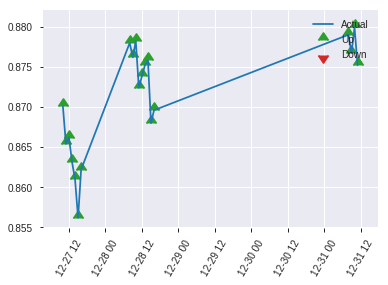


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2502058342894945
RMSE: 0.5002057919391723
LogLoss: 0.6935540759254821
Mean Per-Class Error: 0.4460974036445734
AUC: 0.5272536687631028
pr_auc: 0.14324267237119892
Gini: 0.05450733752620551
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42512764267557157: 


,0,1,Error,Rate
0,3.0,114.0,0.9744,(114.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,3.0,220.0,0.5112,(114.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4251276,0.6503067,67.0
max f2,0.4251276,0.8229814,67.0
max f0point5,0.5205389,0.5503979,9.0
max accuracy,0.5221759,0.5426009,7.0
max precision,0.5221759,0.5125,7.0
max recall,0.4251276,1.0,67.0
max specificity,0.5256474,0.3333333,0.0
max absolute_mcc,0.5025697,0.1209123,32.0
max min_per_class_accuracy,0.5256474,0.3333333,0.0
max mean_per_class_accuracy,0.5205389,0.5539026,9.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 51.49 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.6860987,0.5256474,1.0312616,1.0312616,0.4901961,0.5256474,0.4901961,0.5256474,0.7075472,0.7075472,3.1261561,3.1261561
,2,0.6995516,0.5231480,2.1037736,1.0518868,1.0,0.5238375,0.5,0.5256126,0.0283019,0.7358491,110.3773585,5.1886792
,3,0.7982063,0.5075022,0.9562607,1.0400678,0.4545455,0.5151397,0.4943820,0.5243182,0.0943396,0.8301887,-4.3739280,4.0067840
,4,0.8968610,0.4874504,0.5737564,0.9887736,0.2727273,0.4991352,0.47,0.5215480,0.0566038,0.8867925,-42.6243568,-1.1226415
,5,1.0,0.4068017,1.0976210,1.0,0.5217391,0.4570123,0.4753363,0.5148919,0.1132075,1.0,9.7621001,0.0


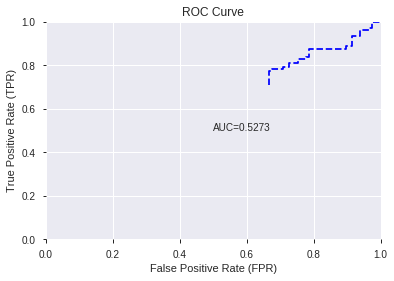

This function is available for GLM models only


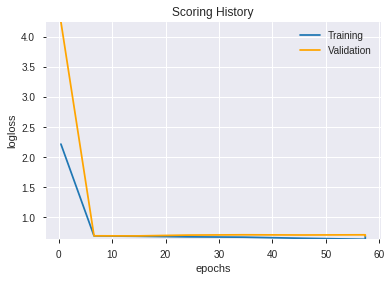

--2019-08-25 17:19:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.185.195
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.185.195|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


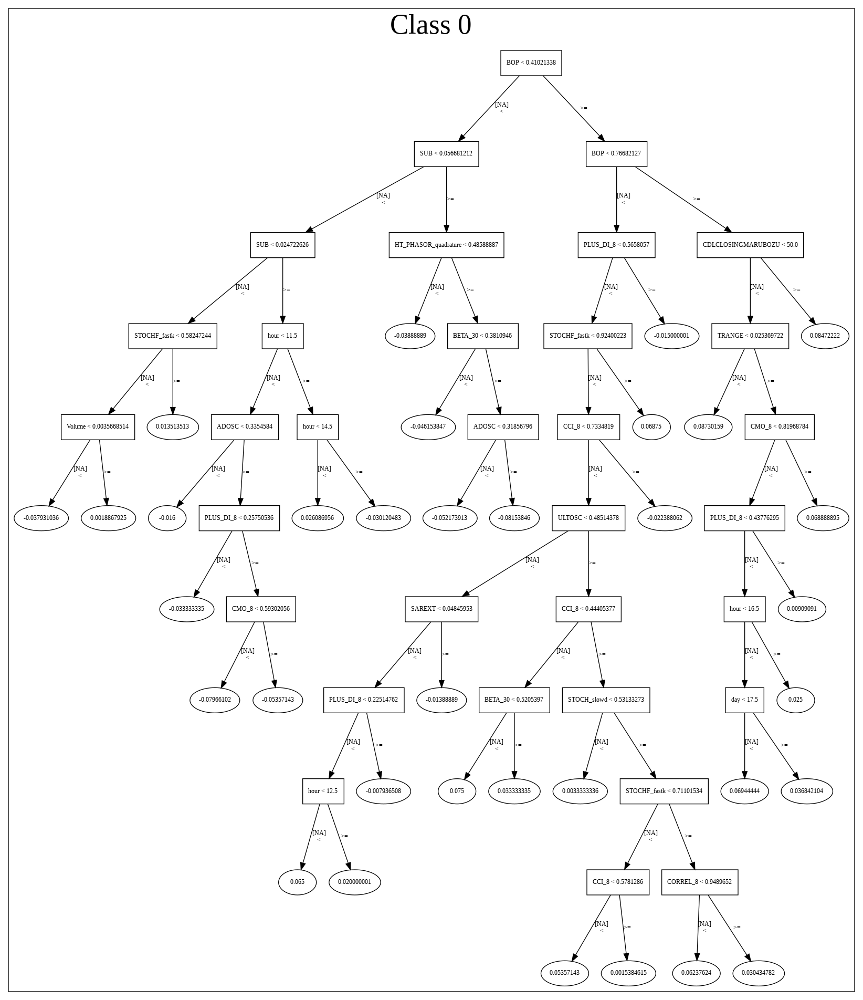

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_164949_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_164949_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

In [10]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_1_AutoML_20190825_171920,0.572085,1.018344,0.487179,0.565806,0.320136
1,DeepLearning_grid_1_AutoML_20190825_171920_model_5,0.553378,0.707791,0.500000,0.505033,0.255058
2,DeepLearning_grid_1_AutoML_20190825_171920_model_7,0.541606,0.917112,0.482906,0.561796,0.315615
3,DeepLearning_grid_1_AutoML_20190825_171920_model_4,0.538784,0.894926,0.483793,0.560744,0.314434
4,DeepLearning_grid_1_AutoML_20190825_171920_model_6,0.532898,0.701724,0.487179,0.503918,0.253934
5,DeepLearning_grid_1_AutoML_20190825_171920_model_3,0.516449,1.179540,0.495726,0.602096,0.362519
6,DeepLearning_grid_1_AutoML_20190825_171920_model_2,0.514594,1.141459,0.471859,0.595666,0.354818
7,DeepLearning_grid_1_AutoML_20190825_171920_model_8,0.512780,0.689953,0.491896,0.498469,0.248471
8,DeepLearning_grid_1_AutoML_20190825_171920_model_1,0.497984,2.398462,0.478632,0.653393,0.426923
9,DeepLearning_grid_1_AutoML_20190825_171920_model_9,0.496533,0.692776,0.495726,0.499812,0.249812


,variable,relative_importance,scaled_importance,percentage
0,AD,1.000000,1.000000,0.027607
1,LINEARREG_ANGLE_8,0.981631,0.981631,0.027100
2,BETA_30,0.944570,0.944570,0.026077
3,WILLR_8,0.932869,0.932869,0.025754
4,MFI_8,0.924452,0.924452,0.025521
5,STOCHF_fastd,0.897240,0.897240,0.024770
6,STOCH_slowd,0.894523,0.894523,0.024695
7,BETA_24,0.853806,0.853806,0.023571
8,ADX_24,0.818676,0.818676,0.022601
9,aroondown_8,0.817406,0.817406,0.022566


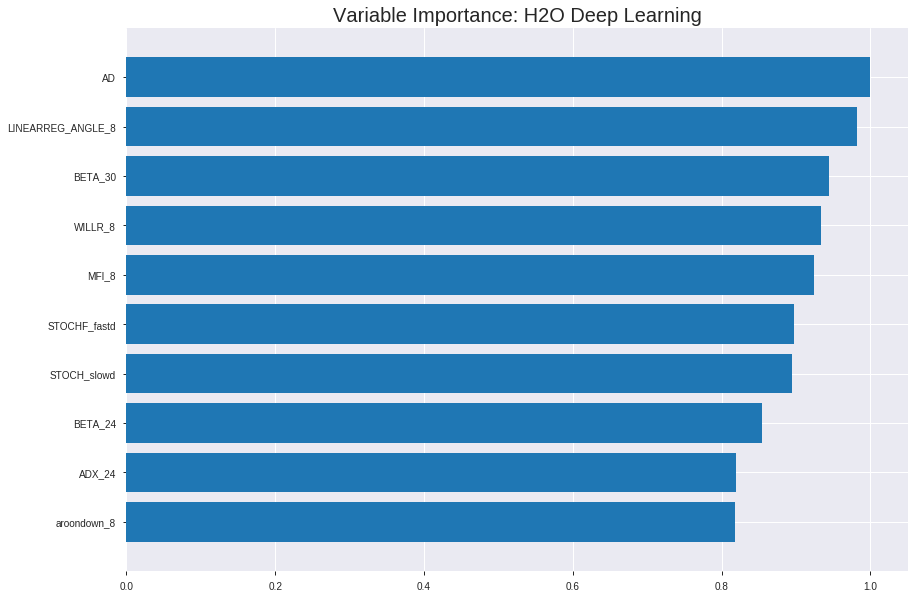

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20190825_171920


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2572467455964572
RMSE: 0.507194977889625
LogLoss: 0.7311511020894988
Mean Per-Class Error: 0.40756744247553556
AUC: 0.6125702525786829
pr_auc: 0.6157966706095214
Gini: 0.22514050515736583
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.03904518252735138: 


,0,1,Error,Rate
0,17.0,743.0,0.9776,(743.0/760.0)
1,4.0,792.0,0.005,(4.0/796.0)
Total,21.0,1535.0,0.4801,(747.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0390452,0.6795367,390.0
max f2,0.0207851,0.8405491,397.0
max f0point5,0.4618420,0.5949048,182.0
max accuracy,0.4885326,0.5899743,166.0
max precision,0.9383013,1.0,0.0
max recall,0.0207851,1.0,397.0
max specificity,0.9383013,1.0,0.0
max absolute_mcc,0.6077299,0.2126066,101.0
max min_per_class_accuracy,0.4389100,0.5697368,197.0
max mean_per_class_accuracy,0.4885326,0.5924326,166.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 43.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.8359140,1.2217337,1.2217337,0.625,0.8612471,0.625,0.8612471,0.0125628,0.0125628,22.1733668,22.1733668
,2,0.0205656,0.8109214,1.0995603,1.1606470,0.5625,0.8220945,0.59375,0.8416708,0.0113065,0.0238693,9.9560302,16.0646985
,3,0.0302057,0.7811119,1.0425461,1.1229552,0.5333333,0.7950944,0.5744681,0.8268060,0.0100503,0.0339196,4.2546064,12.2955202
,4,0.0404884,0.7702592,1.7104271,1.2721544,0.875,0.7762838,0.6507937,0.8139750,0.0175879,0.0515075,71.0427136,27.2154423
,5,0.0501285,0.7533702,1.5638191,1.3282438,0.8,0.7617166,0.6794872,0.8039253,0.0150754,0.0665829,56.3819095,32.8243783
,6,0.1002571,0.6825253,1.5287334,1.4284886,0.7820513,0.7208019,0.7307692,0.7623636,0.0766332,0.1432161,52.8733411,42.8488597
,7,0.1503856,0.6427676,1.4034274,1.4201349,0.7179487,0.6624468,0.7264957,0.7290580,0.0703518,0.2135678,40.3427393,42.0134862
,8,0.2005141,0.6081649,1.4034274,1.4159580,0.7179487,0.6257350,0.7243590,0.7032272,0.0703518,0.2839196,40.3427393,41.5957995
,9,0.3001285,0.5382708,0.9710812,1.2683008,0.4967742,0.5702695,0.6488223,0.6590978,0.0967337,0.3806533,-2.8918787,26.8300819
,10,0.4003856,0.4859823,1.0901624,1.2236947,0.5576923,0.5112175,0.6260032,0.6220684,0.1092965,0.4899497,9.0162350,22.3694718




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.30274179142349583
RMSE: 0.5502197664783552
LogLoss: 0.846314127553157
Mean Per-Class Error: 0.45737751345227984
AUC: 0.5181959784763523
pr_auc: 0.5272767448369542
Gini: 0.036391956952704696
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.07667966600779134: 


,0,1,Error,Rate
0,8.0,206.0,0.9626,(206.0/214.0)
1,3.0,228.0,0.013,(3.0/231.0)
Total,11.0,434.0,0.4697,(209.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0766797,0.6857143,389.0
max f2,0.0414637,0.8442982,398.0
max f0point5,0.0946897,0.5813953,382.0
max accuracy,0.6138947,0.5415730,182.0
max precision,0.8961937,0.6153846,22.0
max recall,0.0414637,1.0,398.0
max specificity,0.9578825,0.9953271,0.0
max absolute_mcc,0.0946897,0.0859372,382.0
max min_per_class_accuracy,0.5971567,0.5324675,194.0
max mean_per_class_accuracy,0.6138947,0.5426225,182.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 56.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.9342571,0.7705628,0.7705628,0.4,0.9485493,0.4,0.9485493,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.9217181,0.4816017,0.6421356,0.25,0.9256524,0.3333333,0.9383729,0.0043290,0.0129870,-51.8398268,-35.7864358
,3,0.0314607,0.9165638,1.5411255,0.9632035,0.8,0.9197967,0.5,0.9317385,0.0173160,0.0303030,54.1125541,-3.6796537
,4,0.0404494,0.9063311,0.9632035,0.9632035,0.5,0.9101239,0.5,0.9269353,0.0086580,0.0389610,-3.6796537,-3.6796537
,5,0.0516854,0.9018265,1.5411255,1.0888387,0.8,0.9041430,0.5652174,0.9219804,0.0173160,0.0562771,54.1125541,8.8838698
,6,0.1011236,0.8582724,1.1383314,1.1130351,0.5909091,0.8802263,0.5777778,0.9015673,0.0562771,0.1125541,13.8331366,11.3035113
,7,0.1505618,0.8193821,1.0507674,1.0925890,0.5454545,0.8394944,0.5671642,0.8811852,0.0519481,0.1645022,5.0767414,9.2589003
,8,0.2,0.7845281,0.8756395,1.0389610,0.4545455,0.7999625,0.5393258,0.8611077,0.0432900,0.2077922,-12.4360488,3.8961039
,9,0.3011236,0.7257055,0.8989899,0.9919558,0.4666667,0.7606030,0.5149254,0.8273561,0.0909091,0.2987013,-10.1010101,-0.8044195
,10,0.4,0.6604694,1.2258953,1.0497835,0.6363636,0.6937230,0.5449438,0.7943232,0.1212121,0.4199134,22.5895317,4.9783550



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:19:20,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 17:19:20,0.082 sec,47151 obs/sec,1.0,1,1556.0,0.5542973,0.8659030,-0.2296404,0.5253372,0.5227186,1.2217337,0.4884319,0.5727200,0.9622364,-0.3139502,0.5123903,0.5308813,1.5411255,0.4764045
,2019-08-25 17:19:20,0.273 sec,77800 obs/sec,10.0,10,15560.0,0.5071950,0.7311511,-0.0295381,0.6125703,0.6157967,1.2217337,0.4800771,0.5502198,0.8463141,-0.2127370,0.5181960,0.5272767,0.7705628,0.4696629


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
AD,1.0,1.0,0.0276069
LINEARREG_ANGLE_8,0.9816313,0.9816313,0.0270998
BETA_30,0.9445701,0.9445701,0.0260767
WILLR_8,0.9328689,0.9328689,0.0257537
MFI_8,0.9244520,0.9244520,0.0255213
---,---,---,---
CORREL_8,0.5495134,0.5495134,0.0151704
AROONOSC_8,0.5478206,0.5478206,0.0151237
AROONOSC_24,0.5365392,0.5365392,0.0148122
HT_TRENDMODE,0.5283996,0.5283996,0.0145875



See the whole table with table.as_data_frame()


('accuracy', 0.5829596412556054)

('F1', 0.6503067484662576)

('auc', 0.5720851475568457)

('logloss', 1.0183443484057921)

('mean_per_class_error', 0.412070633768747)

('rmse', 0.5658057413283019)

('mse', 0.3201361369200692)

deeplearning prediction progress: |███████████████████████████████████████| 100%


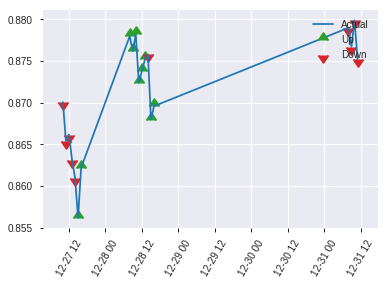


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.3201361369200692
RMSE: 0.5658057413283019
LogLoss: 1.0183443484057921
Mean Per-Class Error: 0.412070633768747
AUC: 0.5720851475568457
pr_auc: 0.5299143931279517
Gini: 0.1441702951136914
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.004627820785157419: 


,0,1,Error,Rate
0,3.0,114.0,0.9744,(114.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,3.0,220.0,0.5112,(114.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0046278,0.6503067,219.0
max f2,0.0046278,0.8229814,219.0
max f0point5,0.1840513,0.5721003,132.0
max accuracy,0.2090532,0.5829596,122.0
max precision,0.9460834,1.0,0.0
max recall,0.0046278,1.0,219.0
max specificity,0.9460834,1.0,0.0
max absolute_mcc,0.1840513,0.1790040,132.0
max min_per_class_accuracy,0.2540450,0.5726496,110.0
max mean_per_class_accuracy,0.1840513,0.5879294,132.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 34.11 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.9277430,1.4025157,1.4025157,0.6666667,0.9358212,0.6666667,0.9358212,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.9064376,2.1037736,1.6830189,1.0,0.9166533,0.8,0.9281540,0.0188679,0.0377358,110.3773585,68.3018868
,3,0.0313901,0.9015070,1.0518868,1.5026954,0.5,0.9030253,0.7142857,0.9209744,0.0094340,0.0471698,5.1886792,50.2695418
,4,0.0403587,0.8972217,2.1037736,1.6362683,1.0,0.8997623,0.7777778,0.9162606,0.0188679,0.0660377,110.3773585,63.6268344
,5,0.0538117,0.8956270,0.7012579,1.4025157,0.3333333,0.8968355,0.6666667,0.9114043,0.0094340,0.0754717,-29.8742138,40.2515723
,6,0.1031390,0.8036833,0.7650086,1.0976210,0.3636364,0.8487082,0.5217391,0.8814192,0.0377358,0.1132075,-23.4991424,9.7621001
,7,0.1524664,0.7296173,0.9562607,1.0518868,0.4545455,0.7656997,0.5,0.8439806,0.0471698,0.1603774,-4.3739280,5.1886792
,8,0.2017937,0.6643497,1.3387650,1.1220126,0.6363636,0.6946214,0.5333333,0.8074705,0.0660377,0.2264151,33.8765009,12.2012579
,9,0.3004484,0.4930645,1.2431389,1.1617854,0.5909091,0.5724604,0.5522388,0.7303030,0.1226415,0.3490566,24.3138937,16.1785413
,10,0.3991031,0.3730797,0.9562607,1.1109816,0.4545455,0.4432631,0.5280899,0.6593493,0.0943396,0.4433962,-4.3739280,11.0981556


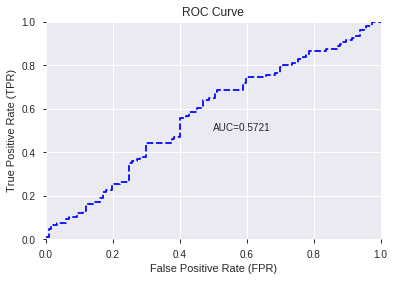

This function is available for GLM models only


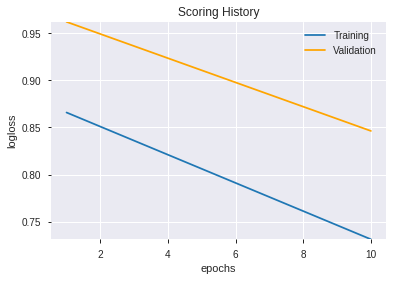

--2019-08-25 17:28:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.33.4
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.33.4|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


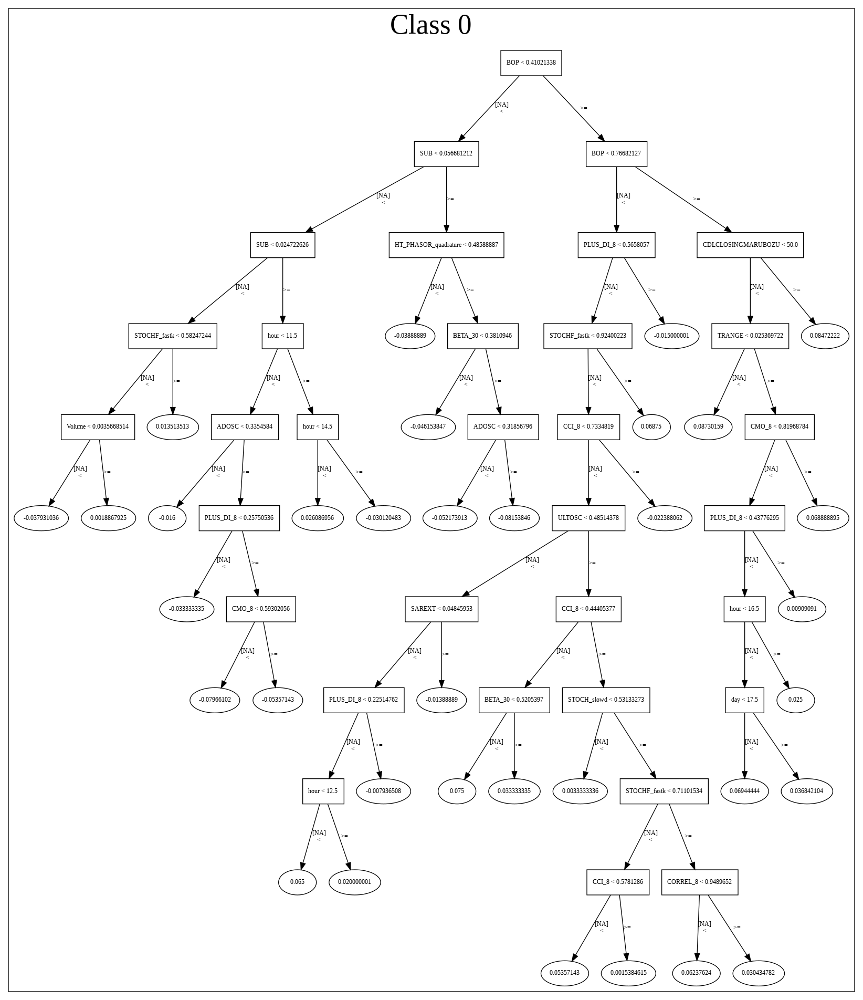

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_1_AutoML_20190825_171920',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_1_AutoML_20190825_171920',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_10_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_10_sid_b784'

['AD',
 'LINEARREG_ANGLE_8',
 'BETA_30',
 'WILLR_8',
 'MFI_8',
 'STOCHF_fastd',
 'STOCH_slowd',
 'BETA_24',
 'ADX_24',
 'aroondown_8',
 'weekday',
 'CORREL_12',
 'dayofweek',
 'AROONOSC_14',
 'CDLLONGLINE',
 'aroonup_8',
 'aroonup_14',
 'weekday_name',
 'aroondown_12',
 'HT_PHASOR_quadrature',
 'quarter',
 'BETA_14',
 'DX_12',
 'BETA_20',
 'month',
 'AROONOSC_30',
 'HT_PHASOR_inphase',
 'SAREXT',
 'CCI_12',
 'STOCHRSI_fastk',
 'hour',
 'dayofyear',
 'MFI_30',
 'aroondown_20',
 'aroondown_14',
 'STOCHRSI_fastd',
 'CCI_8',
 'aroonup_20',
 'day',
 'MACDFIX_signal_12',
 'STDDEV_8',
 'STOCH_slowk',
 'BOP',
 'DX_8',
 'weekofyear',
 'CORREL_8',
 'AROONOSC_8',
 'AROONOSC_24',
 'HT_TRENDMODE',
 'WILLR_14']

In [11]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_172812_model_1,0.496613,0.694148,0.479963,0.5005,0.250501


,variable,relative_importance,scaled_importance,percentage
0,ADX_24,0.008572,1.000000,0.072705
1,BETA_30,0.008154,0.951198,0.069157
2,BETA_20,0.005650,0.659157,0.047924
3,BETA_24,0.005195,0.606097,0.044067
4,CORREL_8,0.005104,0.595380,0.043287
5,CDLLONGLINE,0.004830,0.563471,0.040967
6,CORREL_12,0.004763,0.555598,0.040395
7,STOCHRSI_fastk,0.004128,0.481573,0.035013
8,HT_TRENDMODE,0.003821,0.445775,0.032410
9,STDDEV_8,0.003794,0.442631,0.032182


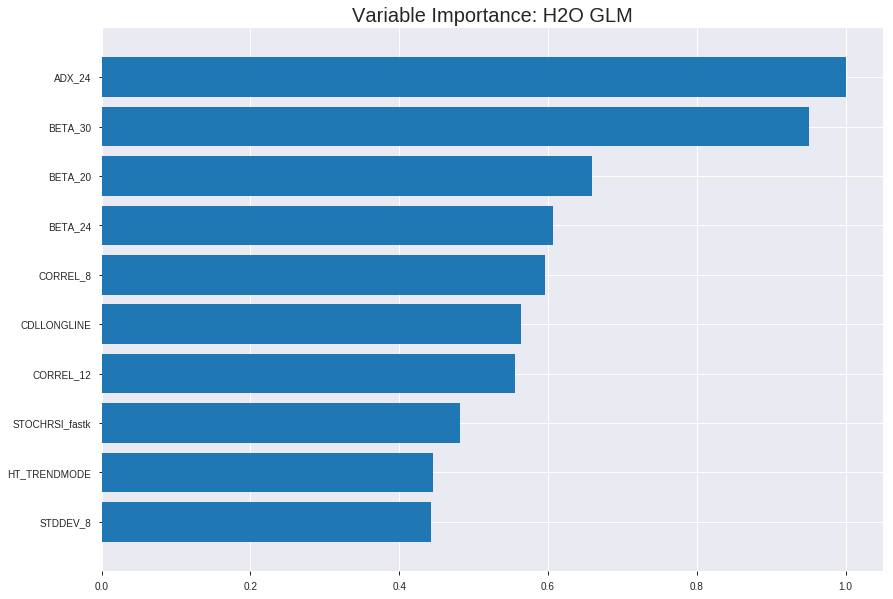

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_172812_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24908142652557058
RMSE: 0.4990805811946309
LogLoss: 0.6913083501120943
Null degrees of freedom: 1555
Residual degrees of freedom: 1505
Null deviance: 2156.2410466952756
Residual deviance: 2151.3515855488376
AIC: 2253.3515855488376
AUC: 0.5574426408357578
pr_auc: 0.5758033851822062
Gini: 0.11488528167151557
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47282359305676813: 


,0,1,Error,Rate
0,0.0,760.0,1.0,(760.0/760.0)
1,0.0,796.0,0.0,(0.0/796.0)
Total,0.0,1556.0,0.4884,(760.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4728236,0.6768707,399.0
max f2,0.4728236,0.8396624,399.0
max f0point5,0.5071622,0.5701079,257.0
max accuracy,0.5136869,0.5449871,170.0
max precision,0.5367456,1.0,0.0
max recall,0.4728236,1.0,399.0
max specificity,0.5367456,1.0,0.0
max absolute_mcc,0.5187664,0.1081375,105.0
max min_per_class_accuracy,0.5118607,0.5376884,195.0
max mean_per_class_accuracy,0.5136869,0.5470048,170.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.5310905,1.7104271,1.7104271,0.875,0.5326453,0.875,0.5326453,0.0175879,0.0175879,71.0427136,71.0427136
,2,0.0205656,0.5284580,1.2217337,1.4660804,0.625,0.5294819,0.75,0.5310636,0.0125628,0.0301508,22.1733668,46.6080402
,3,0.0302057,0.5272970,1.5638191,1.4972736,0.8,0.5277487,0.7659574,0.5300057,0.0150754,0.0452261,56.3819095,49.7273602
,4,0.0404884,0.5263708,1.0995603,1.3962670,0.5625,0.5268527,0.7142857,0.5292049,0.0113065,0.0565327,9.9560302,39.6267050
,5,0.0501285,0.5256205,1.1728643,1.3533050,0.6,0.5259304,0.6923077,0.5285752,0.0113065,0.0678392,17.2864322,35.3304986
,6,0.1002571,0.5224604,1.1778766,1.2655908,0.6025641,0.5237521,0.6474359,0.5261637,0.0590452,0.1268844,17.7876562,26.5590774
,7,0.1503856,0.5205834,1.1026930,1.2112915,0.5641026,0.5214642,0.6196581,0.5245972,0.0552764,0.1821608,10.2692952,21.1291500
,8,0.2005141,0.5190025,1.1778766,1.2029378,0.6025641,0.5197984,0.6153846,0.5233975,0.0590452,0.2412060,17.7876562,20.2937766
,9,0.3001285,0.5164318,0.9332469,1.1134258,0.4774194,0.5177678,0.5695931,0.5215290,0.0929648,0.3341709,-6.6753120,11.3425801
,10,0.4003856,0.5139878,1.0901624,1.1076006,0.5576923,0.5151837,0.5666132,0.5199401,0.1092965,0.4434673,9.0162350,10.7600603




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2501603251639217
RMSE: 0.5001602994680023
LogLoss: 0.6934679233269064
Null degrees of freedom: 444
Residual degrees of freedom: 394
Null deviance: 616.3524839130139
Residual deviance: 617.1864517609467
AIC: 719.1864517609467
AUC: 0.477596391147793
pr_auc: 0.5063413904578862
Gini: -0.04480721770441398
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4894682388347844: 


,0,1,Error,Rate
0,3.0,211.0,0.986,(211.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,3.0,442.0,0.4742,(211.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4894682,0.6864785,396.0
max f2,0.4894682,0.8455344,396.0
max f0point5,0.4894682,0.5777889,396.0
max accuracy,0.4894682,0.5258427,396.0
max precision,0.5211529,0.6,14.0
max recall,0.4894682,1.0,396.0
max specificity,0.5264108,0.9953271,0.0
max absolute_mcc,0.4979907,0.1288983,358.0
max min_per_class_accuracy,0.5078508,0.4813084,197.0
max mean_per_class_accuracy,0.5102539,0.5135939,140.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 50.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.5241978,0.7705628,0.7705628,0.4,0.5252454,0.4,0.5252454,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.5222882,0.9632035,0.8561809,0.5,0.5233456,0.4444444,0.5244010,0.0086580,0.0173160,-3.6796537,-14.3819144
,3,0.0314607,0.5214010,1.5411255,1.1008040,0.8,0.5219942,0.5714286,0.5235414,0.0173160,0.0346320,54.1125541,10.0803958
,4,0.0404494,0.5208221,0.4816017,0.9632035,0.25,0.5210467,0.5,0.5229871,0.0043290,0.0389610,-51.8398268,-3.6796537
,5,0.0516854,0.5205102,0.7705628,0.9213251,0.4,0.5206813,0.4782609,0.5224858,0.0086580,0.0476190,-22.9437229,-7.8674948
,6,0.1011236,0.5176932,0.9632035,0.9417989,0.5,0.5192798,0.4888889,0.5209184,0.0476190,0.0952381,-3.6796537,-5.8201058
,7,0.1505618,0.5153288,0.9632035,0.9488273,0.5,0.5160580,0.4925373,0.5193225,0.0476190,0.1428571,-3.6796537,-5.1172708
,8,0.2,0.5134673,1.0507674,0.9740260,0.5454545,0.5145280,0.5056180,0.5181373,0.0519481,0.1948052,5.0767414,-2.5974026
,9,0.3011236,0.5108436,1.0702261,1.0063320,0.5555556,0.5121251,0.5223881,0.5161183,0.1082251,0.3030303,7.0226070,0.6331976
,10,0.4,0.5093265,0.8756395,0.9740260,0.4545455,0.5101658,0.5056180,0.5146469,0.0865801,0.3896104,-12.4360488,-2.5974026



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 17:28:12,0.000 sec,2,.31E1,51,1.3826167,1.3869358
,2019-08-25 17:28:12,0.009 sec,4,.19E1,51,1.3813460,1.3877240
,2019-08-25 17:28:12,0.018 sec,6,.12E1,51,1.3798001,1.3887466
,2019-08-25 17:28:12,0.028 sec,8,.74E0,51,1.3780111,1.3900085
,2019-08-25 17:28:12,0.040 sec,10,.46E0,51,1.3760206,1.3915163


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5381165919282511)

('F1', 0.6477987421383649)

('auc', 0.4966134494436381)

('logloss', 0.6941483084060684)

('mean_per_class_error', 0.4703273665537817)

('rmse', 0.500500250158673)

('mse', 0.25050050040889427)

glm prediction progress: |████████████████████████████████████████████████| 100%


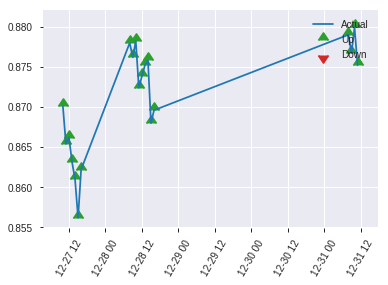


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.25050050040889427
RMSE: 0.500500250158673
LogLoss: 0.6941483084060684
Null degrees of freedom: 222
Residual degrees of freedom: 172
Null deviance: 309.77213152668094
Residual deviance: 309.5901455491065
AIC: 411.5901455491065
AUC: 0.4966134494436381
pr_auc: 0.4777831277363822
Gini: -0.006773101112723778
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.492195348454182: 


,0,1,Error,Rate
0,8.0,109.0,0.9316,(109.0/117.0)
1,3.0,103.0,0.0283,(3.0/106.0)
Total,11.0,212.0,0.5022,(112.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4921953,0.6477987,210.0
max f2,0.4851864,0.8191654,221.0
max f0point5,0.4921953,0.5398323,210.0
max accuracy,0.5166366,0.5381166,28.0
max precision,0.5285778,1.0,0.0
max recall,0.4851864,1.0,221.0
max specificity,0.5285778,1.0,0.0
max absolute_mcc,0.5013681,0.1008350,156.0
max min_per_class_accuracy,0.5073345,0.4871795,111.0
max mean_per_class_accuracy,0.5116661,0.5296726,72.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 50.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.5253339,1.4025157,1.4025157,0.6666667,0.5265593,0.6666667,0.5265593,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.5235366,0.0,0.8415094,0.0,0.5243064,0.4,0.5256581,0.0,0.0188679,-100.0,-15.8490566
,3,0.0313901,0.5221344,2.1037736,1.2021563,1.0,0.5228723,0.5714286,0.5248622,0.0188679,0.0377358,110.3773585,20.2156334
,4,0.0403587,0.5216389,0.0,0.9350105,0.0,0.5220722,0.4444444,0.5242422,0.0,0.0377358,-100.0,-6.4989518
,5,0.0538117,0.5205798,0.7012579,0.8765723,0.3333333,0.5210907,0.4166667,0.5234543,0.0094340,0.0471698,-29.8742138,-12.3427673
,6,0.1031390,0.5175678,1.3387650,1.0976210,0.6363636,0.5193422,0.5217391,0.5214877,0.0660377,0.1132075,33.8765009,9.7621001
,7,0.1524664,0.5159858,1.1475129,1.1137625,0.5454545,0.5166699,0.5294118,0.5199290,0.0566038,0.1698113,14.7512864,11.3762486
,8,0.2017937,0.5148484,0.7650086,1.0285115,0.3636364,0.5153442,0.4888889,0.5188083,0.0377358,0.2075472,-23.4991424,2.8511530
,9,0.3004484,0.5122682,1.0518868,1.0361870,0.5,0.5138504,0.4925373,0.5171803,0.1037736,0.3113208,5.1886792,3.6186990
,10,0.3991031,0.5102365,0.8606346,0.9927920,0.4090909,0.5112414,0.4719101,0.5157122,0.0849057,0.3962264,-13.9365352,-0.7207971


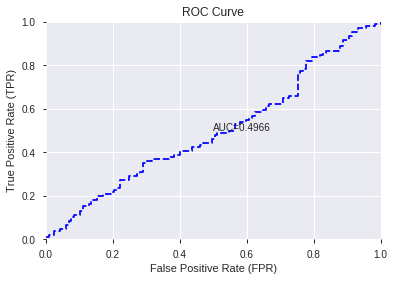

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


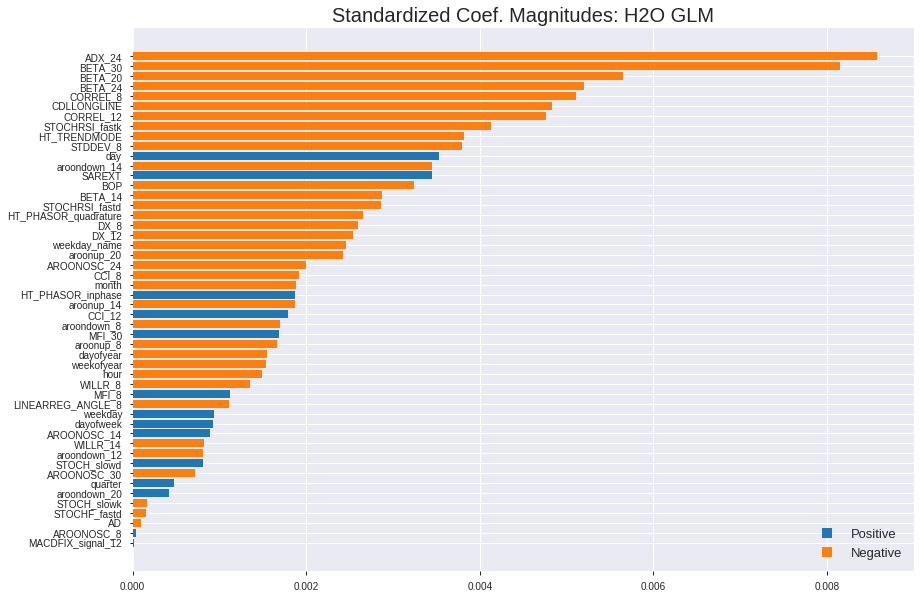

'log_likelihood'
--2019-08-25 17:28:17--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.106.252
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.106.252|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


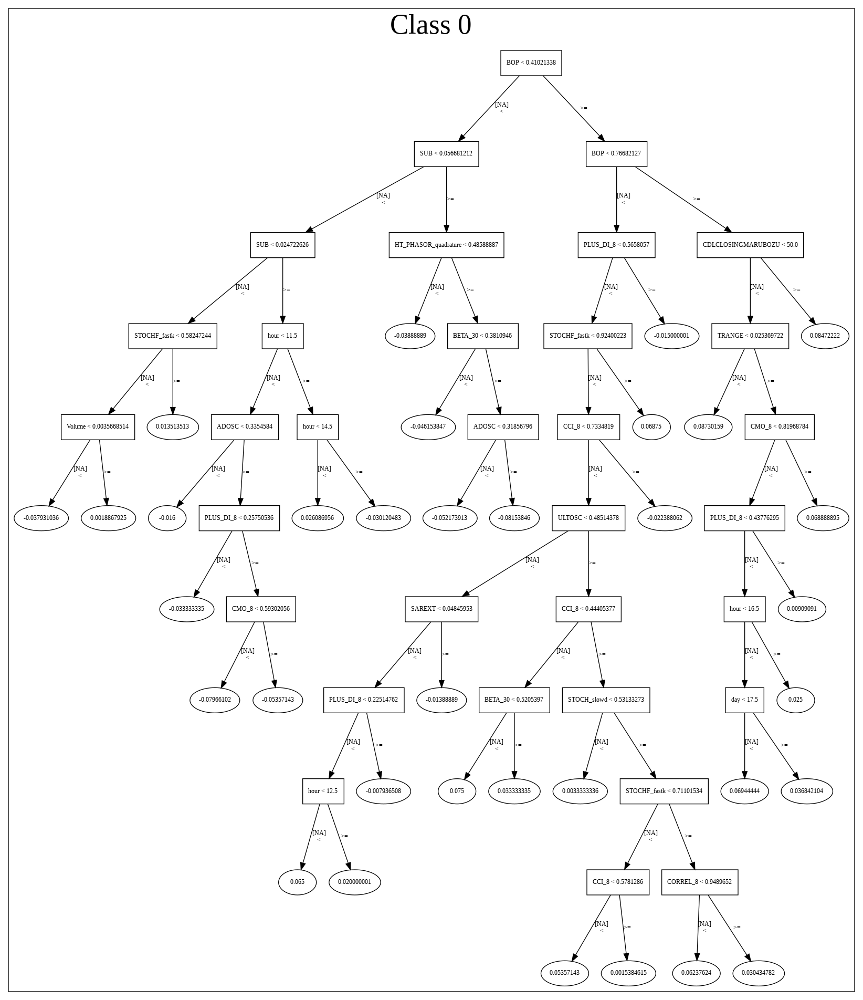

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_172812_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_172812_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_18_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_18_s

['ADX_24',
 'BETA_30',
 'BETA_20',
 'BETA_24',
 'CORREL_8',
 'CDLLONGLINE',
 'CORREL_12',
 'STOCHRSI_fastk',
 'HT_TRENDMODE',
 'STDDEV_8',
 'day',
 'aroondown_14',
 'SAREXT',
 'BOP',
 'BETA_14',
 'STOCHRSI_fastd',
 'HT_PHASOR_quadrature',
 'DX_8',
 'DX_12',
 'weekday_name',
 'aroonup_20',
 'AROONOSC_24',
 'CCI_8',
 'month',
 'HT_PHASOR_inphase',
 'aroonup_14',
 'CCI_12',
 'aroondown_8',
 'MFI_30',
 'aroonup_8',
 'dayofyear',
 'weekofyear',
 'hour',
 'WILLR_8',
 'MFI_8',
 'LINEARREG_ANGLE_8',
 'weekday',
 'dayofweek',
 'AROONOSC_14',
 'WILLR_14',
 'aroondown_12',
 'STOCH_slowd',
 'AROONOSC_30',
 'quarter',
 'aroondown_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'AD',
 'AROONOSC_8',
 'MACDFIX_signal_12']

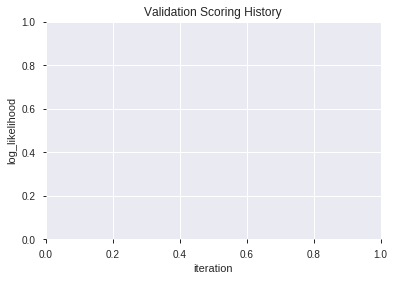

In [12]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190825_172826,0.538784,0.702723,0.491453,0.504322,0.254341
1,XGBoost_grid_1_AutoML_20190825_172826_model_3,0.520319,0.698139,0.491453,0.502487,0.252493
2,XGBoost_grid_1_AutoML_20190825_172826_model_5,0.509192,0.726864,0.495726,0.515135,0.265364
3,XGBoost_grid_1_AutoML_20190825_172826_model_4,0.494960,0.707199,0.500000,0.506855,0.256902
4,XGBoost_grid_1_AutoML_20190825_172826_model_7,0.493953,0.722854,0.500000,0.513606,0.263791
5,XGBoost_grid_1_AutoML_20190825_172826_model_2,0.482745,0.707112,0.500000,0.506816,0.256862
6,XGBoost_grid_1_AutoML_20190825_172826_model_1,0.476375,0.711704,0.487179,0.509031,0.259112
7,XGBoost_2_AutoML_20190825_172826,0.473553,0.720461,0.500000,0.512900,0.263066
8,XGBoost_3_AutoML_20190825_172826,0.468312,0.717074,0.487623,0.511412,0.261543
9,XGBoost_grid_1_AutoML_20190825_172826_model_6,0.449847,0.717223,0.482906,0.511768,0.261906


,variable,relative_importance,scaled_importance,percentage
0,BETA_14,330.311554,1.000000,0.048737
1,BOP,294.482758,0.891530,0.043451
2,STOCH_slowd,234.200623,0.709029,0.034556
3,SAREXT,234.152069,0.708882,0.034549
4,ADX_24,228.180481,0.690804,0.033668
5,BETA_30,226.991348,0.687204,0.033492
6,WILLR_8,221.778717,0.671423,0.032723
7,CCI_8,206.571075,0.625383,0.030479
8,CCI_12,205.716110,0.622794,0.030353
9,BETA_24,198.572815,0.601168,0.029299


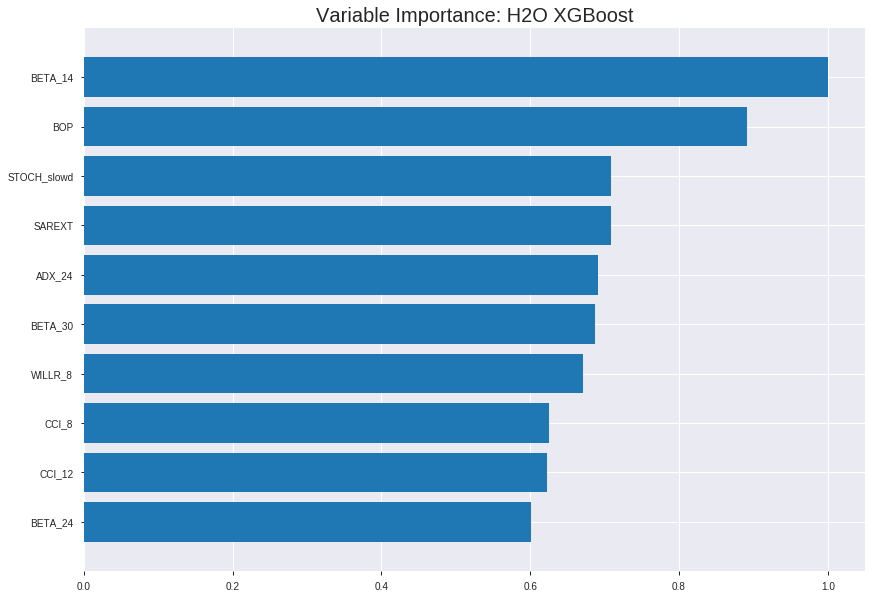

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190825_172826


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15384165973932493
RMSE: 0.39222654134992563
LogLoss: 0.4930236383203889
Mean Per-Class Error: 0.08057392224279292
AUC: 0.9731635149431367
pr_auc: 0.9708919232136549
Gini: 0.9463270298862734
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5213015675544739: 


,0,1,Error,Rate
0,711.0,49.0,0.0645,(49.0/760.0)
1,77.0,719.0,0.0967,(77.0/796.0)
Total,788.0,768.0,0.081,(126.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5213016,0.9194373,190.0
max f2,0.4476541,0.9432146,240.0
max f0point5,0.5303146,0.9345048,183.0
max accuracy,0.5223819,0.9190231,189.0
max precision,0.8714042,1.0,0.0
max recall,0.3650775,1.0,303.0
max specificity,0.8714042,1.0,0.0
max absolute_mcc,0.5223819,0.8387274,189.0
max min_per_class_accuracy,0.5125674,0.9145729,195.0
max mean_per_class_accuracy,0.5223819,0.9194261,189.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 50.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.7831542,1.9547739,1.9547739,1.0,0.8097506,1.0,0.8097506,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.7624682,1.9547739,1.9547739,1.0,0.7730895,1.0,0.7914200,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.7487998,1.9547739,1.9547739,1.0,0.7536444,1.0,0.7793640,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.7373267,1.9547739,1.9547739,1.0,0.7423438,1.0,0.7699620,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.7254472,1.9547739,1.9547739,1.0,0.7310521,1.0,0.7624794,0.0188442,0.0979899,95.4773869,95.4773869
,6,0.1002571,0.6948809,1.9297127,1.9422433,0.9871795,0.7100971,0.9935897,0.7362882,0.0967337,0.1947236,92.9712666,94.2243268
,7,0.1503856,0.6711883,1.9297127,1.9380664,0.9871795,0.6820554,0.9914530,0.7182106,0.0967337,0.2914573,92.9712666,93.8066400
,8,0.2005141,0.6473732,1.9297127,1.9359780,0.9871795,0.6596975,0.9903846,0.7035823,0.0967337,0.3881910,92.9712666,93.5977967
,9,0.3001285,0.6069645,1.9043281,1.9254732,0.9741935,0.6262209,0.9850107,0.6779056,0.1896985,0.5778894,90.4328092,92.5473190
,10,0.4003856,0.5655226,1.8044066,1.8951580,0.9230769,0.5886598,0.9695024,0.6555584,0.1809045,0.7587940,80.4406649,89.5157973




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26470188420818286
RMSE: 0.5144918699145623
LogLoss: 0.7245652799217243
Mean Per-Class Error: 0.48284581462151555
AUC: 0.48756928429825624
pr_auc: 0.5031018965746743
Gini: -0.02486143140348751
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21909315884113312: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2190932,0.6834320,399.0
max f2,0.2190932,0.8436815,399.0
max f0point5,0.2190932,0.5743411,399.0
max accuracy,0.4084993,0.5258427,288.0
max precision,0.6858521,0.5454545,10.0
max recall,0.2190932,1.0,399.0
max specificity,0.7463040,0.9953271,0.0
max absolute_mcc,0.3128564,0.0979685,383.0
max min_per_class_accuracy,0.4807220,0.4848485,198.0
max mean_per_class_accuracy,0.4084993,0.5171542,288.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 47.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.7283899,0.7705628,0.7705628,0.4,0.7381872,0.4,0.7381872,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.6990144,0.9632035,0.8561809,0.5,0.7153408,0.4444444,0.7280333,0.0086580,0.0173160,-3.6796537,-14.3819144
,3,0.0314607,0.6779585,0.7705628,0.8256030,0.4,0.6858706,0.4285714,0.7129752,0.0086580,0.0259740,-22.9437229,-17.4397032
,4,0.0404494,0.6686286,0.9632035,0.8561809,0.5,0.6722503,0.4444444,0.7039252,0.0086580,0.0346320,-3.6796537,-14.3819144
,5,0.0516854,0.6516482,1.5411255,1.0050819,0.8,0.6631487,0.5217391,0.6950607,0.0173160,0.0519481,54.1125541,0.5081875
,6,0.1011236,0.6086378,0.7880756,0.8989899,0.4090909,0.6249207,0.4666667,0.6607700,0.0389610,0.0909091,-21.1924439,-10.1010101
,7,0.1505618,0.5869038,1.1383314,0.9775796,0.5909091,0.5961659,0.5074627,0.6395567,0.0562771,0.1471861,13.8331366,-2.2420366
,8,0.2,0.5665884,0.7880756,0.9307359,0.4090909,0.5761027,0.4831461,0.6238715,0.0389610,0.1861472,-21.1924439,-6.9264069
,9,0.3011236,0.5327813,1.1130351,0.9919558,0.5777778,0.5490271,0.5149254,0.5987372,0.1125541,0.2987013,11.3035113,-0.8044195
,10,0.4,0.5029033,1.0507674,1.0064935,0.5454545,0.5137874,0.5224719,0.5777383,0.1038961,0.4025974,5.0767414,0.6493506



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:28:26,0.008 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4884319,0.5,0.6931472,0.5,0.0,1.0,0.4808989
,2019-08-25 17:28:26,0.088 sec,5.0,0.4853698,0.6642410,0.8094444,0.8127395,1.9547739,0.2679949,0.5020260,0.6972191,0.4764636,0.4863333,0.3852814,0.4808989
,2019-08-25 17:28:26,0.143 sec,10.0,0.4719652,0.6383173,0.8664391,0.8612076,1.9547739,0.2185090,0.5032209,0.6996747,0.4861735,0.5034480,0.7705628,0.4808989
,2019-08-25 17:28:27,0.212 sec,15.0,0.4604990,0.6164946,0.8948823,0.8893888,1.9547739,0.1825193,0.5043711,0.7020786,0.4926670,0.5150413,1.5411255,0.4764045
,2019-08-25 17:28:27,0.269 sec,20.0,0.4496347,0.5961089,0.9139034,0.9102863,1.9547739,0.1619537,0.5067421,0.7070403,0.4817939,0.5050507,1.1558442,0.4786517
,2019-08-25 17:28:27,0.333 sec,25.0,0.4386915,0.5759305,0.9344081,0.9326566,1.9547739,0.1426735,0.5074066,0.7085738,0.4893292,0.5113538,1.1558442,0.4808989
,2019-08-25 17:28:27,0.409 sec,30.0,0.4282809,0.5569167,0.9458163,0.9424480,1.9547739,0.1246787,0.5086407,0.7113358,0.4924647,0.5114363,1.1558442,0.4808989
,2019-08-25 17:28:27,0.490 sec,35.0,0.4186680,0.5395746,0.9551913,0.9534586,1.9547739,0.1118252,0.5116639,0.7177681,0.4789113,0.5048566,1.1558442,0.4808989
,2019-08-25 17:28:27,0.576 sec,40.0,0.4091834,0.5226779,0.9619198,0.9609609,1.9547739,0.1079692,0.5116968,0.7179731,0.4863050,0.5098940,1.1558442,0.4808989
,2019-08-25 17:28:27,0.666 sec,45.0,0.4002408,0.5070213,0.9687690,0.9668552,1.9547739,0.0925450,0.5129376,0.7208539,0.4882470,0.5065509,1.1558442,0.4808989


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_14,330.3115540,1.0,0.0487371
BOP,294.4827576,0.8915303,0.0434506
STOCH_slowd,234.2006226,0.7090295,0.0345560
SAREXT,234.1520691,0.7088825,0.0345489
ADX_24,228.1804810,0.6908038,0.0336678
---,---,---,---
dayofweek,28.3462753,0.0858168,0.0041825
HT_TRENDMODE,25.5609894,0.0773845,0.0037715
weekday_name,21.3652248,0.0646820,0.0031524
weekday,11.3384104,0.0343264,0.0016730



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.57847533632287)

('F1', 0.6483180428134556)

('auc', 0.5387840670859538)

('logloss', 0.7027225061972883)

('mean_per_class_error', 0.4327527818093856)

('rmse', 0.5043224185611129)

('mse', 0.25434110186333037)

xgboost prediction progress: |████████████████████████████████████████████| 100%


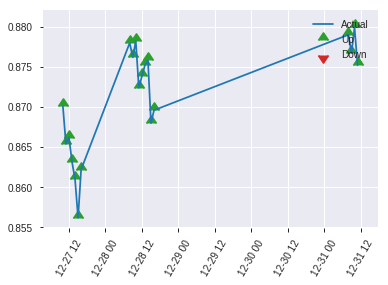


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25434110186333037
RMSE: 0.5043224185611129
LogLoss: 0.7027225061972883
Mean Per-Class Error: 0.4327527818093856
AUC: 0.5387840670859538
pr_auc: 0.5018369534134419
Gini: 0.07756813417190767
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24590083956718445: 


,0,1,Error,Rate
0,2.0,115.0,0.9829,(115.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,2.0,221.0,0.5157,(115.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2459008,0.6483180,220.0
max f2,0.2459008,0.8217054,220.0
max f0point5,0.3809974,0.5387409,179.0
max accuracy,0.5574299,0.5784753,59.0
max precision,0.7658705,1.0,0.0
max recall,0.2459008,1.0,220.0
max specificity,0.7658705,1.0,0.0
max absolute_mcc,0.5574299,0.1514540,59.0
max min_per_class_accuracy,0.4850252,0.5377358,108.0
max mean_per_class_accuracy,0.5574299,0.5672472,59.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 48.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.7112150,1.4025157,1.4025157,0.6666667,0.7322653,0.6666667,0.7322653,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.6889024,1.0518868,1.2622642,0.5,0.6950157,0.6,0.7173654,0.0094340,0.0283019,5.1886792,26.2264151
,3,0.0313901,0.6774116,1.0518868,1.2021563,0.5,0.6833277,0.5714286,0.7076404,0.0094340,0.0377358,5.1886792,20.2156334
,4,0.0403587,0.6680802,0.0,0.9350105,0.0,0.6754726,0.4444444,0.7004920,0.0,0.0377358,-100.0,-6.4989518
,5,0.0538117,0.6620371,0.0,0.7012579,0.0,0.6645726,0.3333333,0.6915121,0.0,0.0377358,-100.0,-29.8742138
,6,0.1031390,0.6334733,0.9562607,0.8232158,0.4545455,0.6471023,0.3913043,0.6702727,0.0471698,0.0849057,-4.3739280,-17.6784249
,7,0.1524664,0.6050386,1.5300172,1.0518868,0.7272727,0.6125697,0.5,0.6516040,0.0754717,0.1603774,53.0017153,5.1886792
,8,0.2017937,0.5758904,1.5300172,1.1687631,0.7272727,0.5874716,0.5555556,0.6359272,0.0754717,0.2358491,53.0017153,16.8763103
,9,0.3004484,0.5479101,1.2431389,1.1931850,0.5909091,0.5626083,0.5671642,0.6118524,0.1226415,0.3584906,24.3138937,19.3185018
,10,0.3991031,0.5087255,0.9562607,1.1346195,0.4545455,0.5287671,0.5393258,0.5913144,0.0943396,0.4528302,-4.3739280,13.4619462


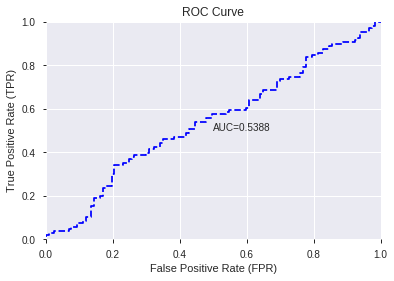

This function is available for GLM models only


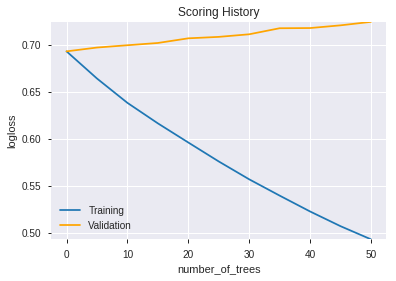

--2019-08-25 17:28:39--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.115.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.115.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

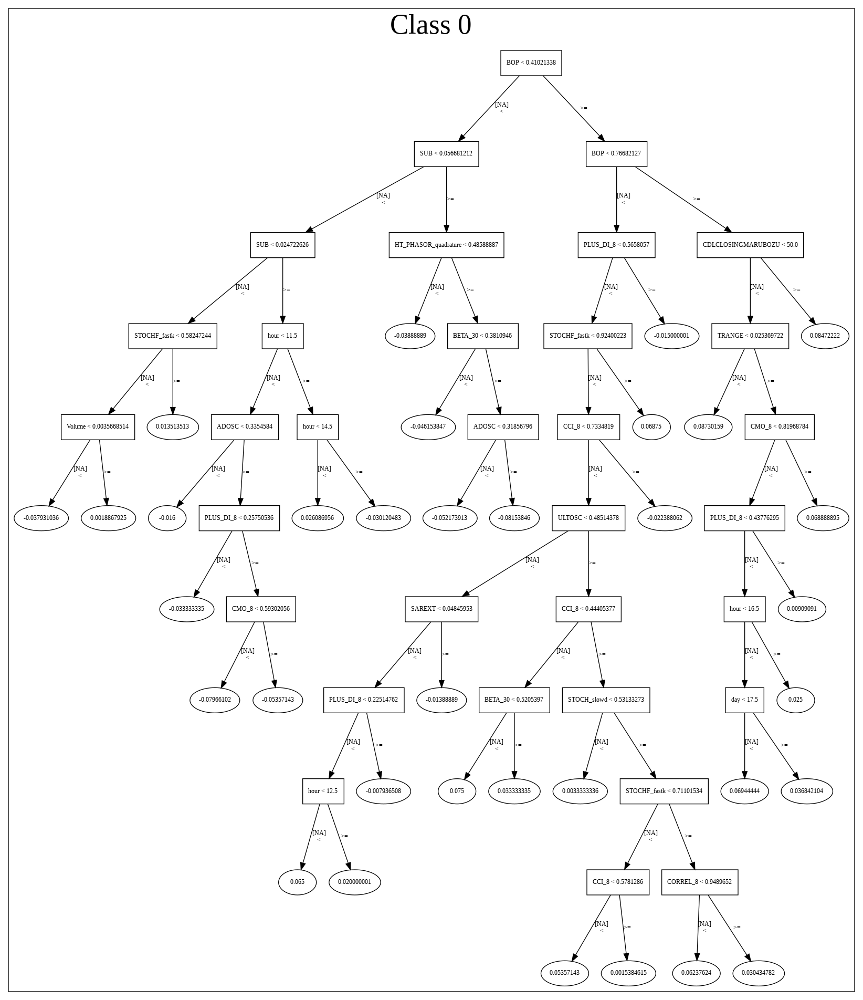

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190825_172826',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190825_172826',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_26_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_26_sid_b784',
   'type

['BETA_14',
 'BOP',
 'STOCH_slowd',
 'SAREXT',
 'ADX_24',
 'BETA_30',
 'WILLR_8',
 'CCI_8',
 'CCI_12',
 'BETA_24',
 'AD',
 'DX_12',
 'HT_PHASOR_inphase',
 'STOCHRSI_fastd',
 'MFI_8',
 'HT_PHASOR_quadrature',
 'dayofyear',
 'STDDEV_8',
 'MACDFIX_signal_12',
 'AROONOSC_30',
 'MFI_30',
 'AROONOSC_24',
 'day',
 'WILLR_14',
 'DX_8',
 'BETA_20',
 'CORREL_12',
 'STOCHRSI_fastk',
 'hour',
 'aroondown_20',
 'LINEARREG_ANGLE_8',
 'STOCH_slowk',
 'AROONOSC_14',
 'aroonup_20',
 'aroonup_8',
 'aroonup_14',
 'aroondown_12',
 'CORREL_8',
 'STOCHF_fastd',
 'aroondown_14',
 'AROONOSC_8',
 'aroondown_8',
 'weekofyear',
 'CDLLONGLINE',
 'dayofweek',
 'HT_TRENDMODE',
 'weekday_name',
 'weekday',
 'month']

In [13]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_172846_model_1,0.542896,0.717141,0.487623,0.511614,0.261748


,variable,relative_importance,scaled_importance,percentage
0,BETA_30,7.852613e-03,1.000000,1.309456e-02
1,CDLMARUBOZU,6.790865e-03,0.864791,1.132405e-02
2,is_month_start,6.744045e-03,0.858828,1.124597e-02
3,ADXR_14,6.374908e-03,0.811820,1.063042e-02
4,is_month_end,6.353369e-03,0.809077,1.059450e-02
5,ADX_24,5.938011e-03,0.756183,9.901878e-03
6,CDLBELTHOLD,5.928855e-03,0.755017,9.886611e-03
7,ADXR_12,5.729686e-03,0.729653,9.554488e-03
8,ADX_20,5.601324e-03,0.713307,9.340438e-03
9,BETA_20,5.377014e-03,0.684742,8.966393e-03


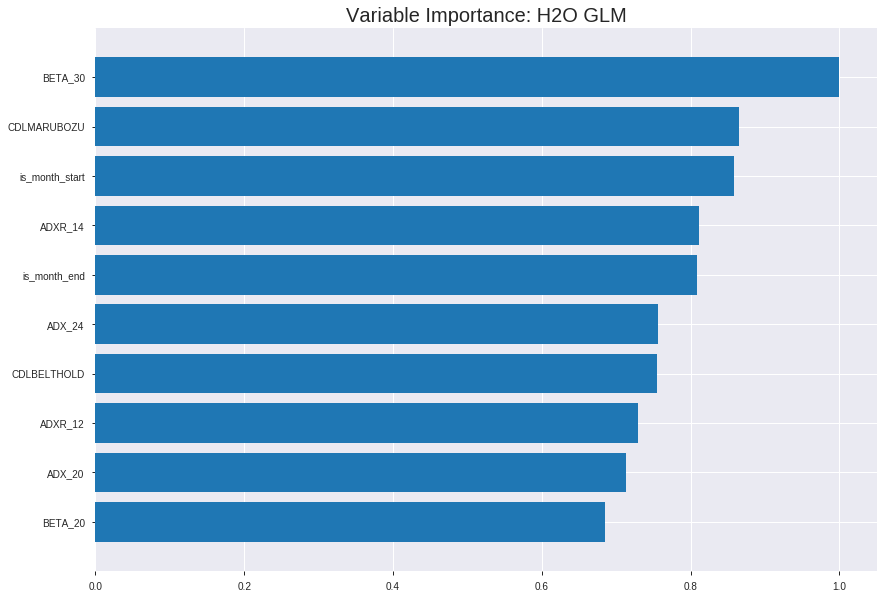

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_172846_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24701508867424465
RMSE: 0.49700612538905864
LogLoss: 0.6871632473325053
Null degrees of freedom: 1555
Residual degrees of freedom: 521
Null deviance: 2156.2410466952756
Residual deviance: 2138.4520256987566
AIC: 4208.452025698756
AUC: 0.583763389314996
pr_auc: 0.5872558282713327
Gini: 0.1675267786299921
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.486656293619819: 


,0,1,Error,Rate
0,119.0,641.0,0.8434,(641.0/760.0)
1,59.0,737.0,0.0741,(59.0/796.0)
Total,178.0,1378.0,0.4499,(700.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4866563,0.6780129,314.0
max f2,0.4087969,0.8398396,398.0
max f0point5,0.4925335,0.5879850,289.0
max accuracy,0.4983615,0.5623393,263.0
max precision,0.5919484,1.0,0.0
max recall,0.4087969,1.0,398.0
max specificity,0.5919484,1.0,0.0
max absolute_mcc,0.4925335,0.1371199,289.0
max min_per_class_accuracy,0.5117384,0.5513158,196.0
max mean_per_class_accuracy,0.5031764,0.5572633,240.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.5622276,1.5882538,1.5882538,0.8125,0.5745546,0.8125,0.5745546,0.0163317,0.0163317,58.8253769,58.8253769
,2,0.0205656,0.5559227,1.2217337,1.4049937,0.625,0.5594549,0.71875,0.5670048,0.0125628,0.0288945,22.1733668,40.4993719
,3,0.0302057,0.5517375,1.3031826,1.3725008,0.6666667,0.5540752,0.7021277,0.5628783,0.0125628,0.0414573,30.3182580,37.2500802
,4,0.0404884,0.5495961,1.3439070,1.3652389,0.6875,0.5508341,0.6984127,0.5598195,0.0138191,0.0552764,34.3907035,36.5238893
,5,0.0501285,0.5473665,0.9122278,1.2781214,0.4666667,0.5485057,0.6538462,0.5576438,0.0087940,0.0640704,-8.7772194,27.8121376
,6,0.1002571,0.5397178,1.2781214,1.2781214,0.6538462,0.5430507,0.6538462,0.5503472,0.0640704,0.1281407,27.8121376,27.8121376
,7,0.1503856,0.5349458,1.1778766,1.2447064,0.6025641,0.5370173,0.6367521,0.5459039,0.0590452,0.1871859,17.7876562,24.4706438
,8,0.2005141,0.5308169,1.1277542,1.2154684,0.5769231,0.5327162,0.6217949,0.5426070,0.0565327,0.2437186,12.7754155,21.5468367
,9,0.3001285,0.5236467,1.0467499,1.1594697,0.5354839,0.5270170,0.5931478,0.5374326,0.1042714,0.3479899,4.6749878,15.9469726
,10,0.4003856,0.5172222,1.0024481,1.1201513,0.5128205,0.5202132,0.5730337,0.5331208,0.1005025,0.4484925,0.2448138,12.0151318




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2540697270879198
RMSE: 0.5040532978643427
LogLoss: 0.701383499325086
Null degrees of freedom: 444
Residual degrees of freedom: -590
Null deviance: 616.3524839130139
Residual deviance: 624.2313143993266
AIC: 2694.2313143993265
AUC: 0.46099850305457785
pr_auc: 0.4875815581296637
Gini: -0.07800299389084431
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4359907920879382: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4359908,0.6834320,399.0
max f2,0.4359908,0.8436815,399.0
max f0point5,0.4605180,0.5748317,379.0
max accuracy,0.4635977,0.5235955,377.0
max precision,0.5874807,0.5263158,18.0
max recall,0.4359908,1.0,399.0
max specificity,0.6313733,0.9953271,0.0
max absolute_mcc,0.5607481,0.1044775,105.0
max min_per_class_accuracy,0.5315221,0.4632035,195.0
max mean_per_class_accuracy,0.4802066,0.5074948,341.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 52.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.6094608,0.3852814,0.3852814,0.2,0.6177696,0.2,0.6177696,0.0043290,0.0043290,-61.4718615,-61.4718615
,2,0.0202247,0.6036378,0.9632035,0.6421356,0.5,0.6062823,0.3333333,0.6126641,0.0086580,0.0129870,-3.6796537,-35.7864358
,3,0.0314607,0.5916048,1.5411255,0.9632035,0.8,0.5962146,0.5,0.6067893,0.0173160,0.0303030,54.1125541,-3.6796537
,4,0.0404494,0.5876153,0.9632035,0.9632035,0.5,0.5900321,0.5,0.6030655,0.0086580,0.0389610,-3.6796537,-3.6796537
,5,0.0516854,0.5845295,1.1558442,1.0050819,0.6,0.5858294,0.5217391,0.5993185,0.0129870,0.0519481,15.5844156,0.5081875
,6,0.1011236,0.5795485,0.8756395,0.9417989,0.4545455,0.5816493,0.4888889,0.5906802,0.0432900,0.0952381,-12.4360488,-5.8201058
,7,0.1505618,0.5739064,0.9632035,0.9488273,0.5,0.5759613,0.4925373,0.5858471,0.0476190,0.1428571,-3.6796537,-5.1172708
,8,0.2,0.5694307,0.7005116,0.8874459,0.3636364,0.5722239,0.4606742,0.5824796,0.0346320,0.1774892,-29.9488390,-11.2554113
,9,0.3011236,0.5571886,0.8133718,0.8625703,0.4222222,0.5628145,0.4477612,0.5758757,0.0822511,0.2597403,-18.6628187,-13.7429734
,10,0.4,0.5426967,1.1383314,0.9307359,0.5909091,0.5495707,0.4831461,0.5693733,0.1125541,0.3722944,13.8331366,-6.9264069



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 17:28:49,0.000 sec,2,.34E1,1035,1.3743265,1.4027670
,2019-08-25 17:28:51,1.681 sec,4,.25E1,1035,1.3716281,1.4069215
,2019-08-25 17:28:53,3.407 sec,6,.18E1,1036,1.3683776,1.4116958
,2019-08-25 17:28:54,5.103 sec,8,.13E1,1036,1.3645250,1.4175362
,2019-08-25 17:28:56,6.813 sec,10,.96E0,1036,1.3600538,1.4245107


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5560538116591929)

('F1', 0.6481481481481481)

('auc', 0.5428963070472504)

('logloss', 0.717141479730846)

('mean_per_class_error', 0.4438800193517174)

('rmse', 0.5116135417583073)

('mse', 0.2617484161104793)

glm prediction progress: |████████████████████████████████████████████████| 100%


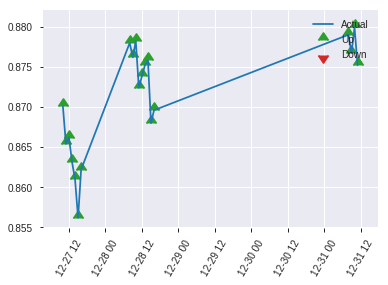


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2617484161104793
RMSE: 0.5116135417583073
LogLoss: 0.717141479730846
Null degrees of freedom: 222
Residual degrees of freedom: -812
Null deviance: 309.77213152668094
Residual deviance: 319.8450999599573
AIC: 2389.845099959957
AUC: 0.5428963070472504
pr_auc: 0.5048781952525406
Gini: 0.0857926140945009
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5213165535466251: 


,0,1,Error,Rate
0,4.0,113.0,0.9658,(113.0/117.0)
1,1.0,105.0,0.0094,(1.0/106.0)
Total,5.0,218.0,0.5112,(114.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5213166,0.6481481,217.0
max f2,0.5178355,0.8191654,222.0
max f0point5,0.5754134,0.5541562,171.0
max accuracy,0.6188096,0.5560538,40.0
max precision,0.6497998,0.6666667,2.0
max recall,0.5178355,1.0,222.0
max specificity,0.6708688,0.9914530,0.0
max absolute_mcc,0.5754134,0.1334578,171.0
max min_per_class_accuracy,0.5960042,0.5188679,110.0
max mean_per_class_accuracy,0.5754134,0.5561200,171.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 59.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.6496447,1.4025157,1.4025157,0.6666667,0.6584356,0.6666667,0.6584356,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.6412882,0.0,0.8415094,0.0,0.6457163,0.4,0.6533479,0.0,0.0188679,-100.0,-15.8490566
,3,0.0313901,0.6361685,2.1037736,1.2021563,1.0,0.6383947,0.5714286,0.6490755,0.0188679,0.0377358,110.3773585,20.2156334
,4,0.0403587,0.6355580,1.0518868,1.1687631,0.5,0.6357992,0.5555556,0.6461252,0.0094340,0.0471698,5.1886792,16.8763103
,5,0.0538117,0.6341605,1.4025157,1.2272013,0.6666667,0.6349592,0.5833333,0.6433337,0.0188679,0.0660377,40.2515723,22.7201258
,6,0.1031390,0.6269977,0.9562607,1.0976210,0.4545455,0.6295847,0.5217391,0.6367581,0.0471698,0.1132075,-4.3739280,9.7621001
,7,0.1524664,0.6204047,1.3387650,1.1756382,0.6363636,0.6234823,0.5588235,0.6324630,0.0660377,0.1792453,33.8765009,17.5638180
,8,0.2017937,0.6182724,1.1475129,1.1687631,0.5454545,0.6194116,0.5555556,0.6292727,0.0566038,0.2358491,14.7512864,16.8763103
,9,0.3004484,0.6088064,0.5737564,0.9733878,0.2727273,0.6139037,0.4626866,0.6242261,0.0566038,0.2924528,-42.6243568,-2.6612222
,10,0.3991031,0.6020215,1.0518868,0.9927920,0.5,0.6056870,0.4719101,0.6196434,0.1037736,0.3962264,5.1886792,-0.7207971


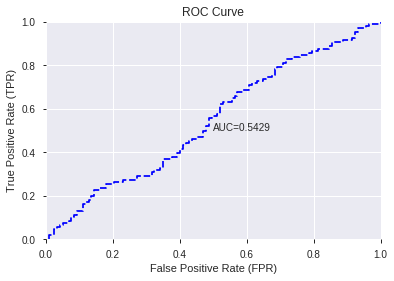

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


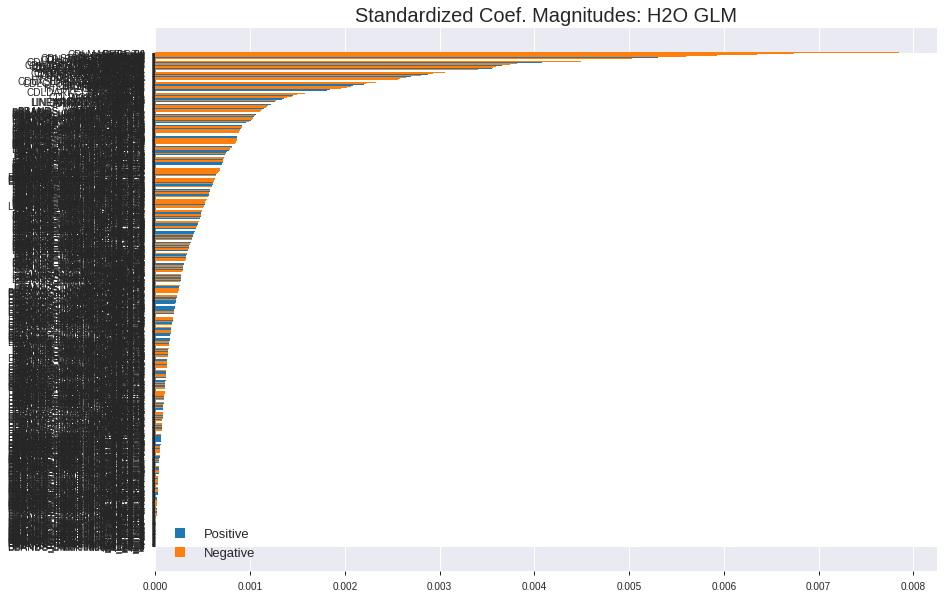

'log_likelihood'
--2019-08-25 17:29:16--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.132.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.132.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


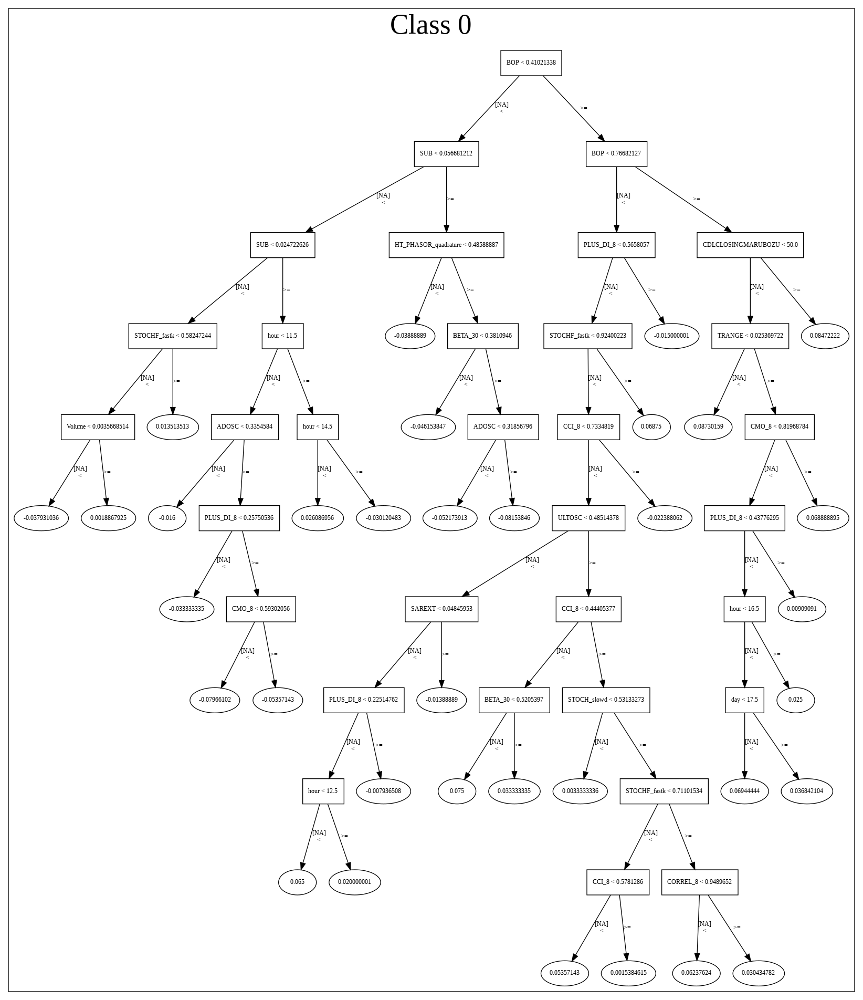

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_172846_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_172846_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_34_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_34_s

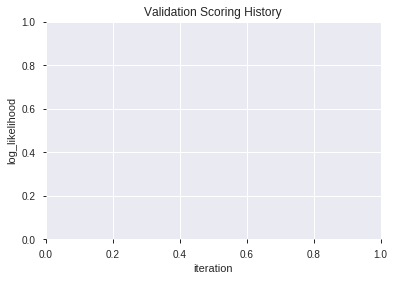

In [14]:
# GLM
glm_features = model_train(feature_name='All',model_algo="GLM")

In [15]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [16]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [17]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190825_172923_model_6,0.542009,0.721403,0.483349,0.513406,0.263585
1,XGBoost_grid_1_AutoML_20190825_172923_model_4,0.516288,0.700754,0.454322,0.503690,0.253704
2,XGBoost_grid_1_AutoML_20190825_172923_model_1,0.508305,0.762852,0.470972,0.531010,0.281972
3,XGBoost_3_AutoML_20190825_172923,0.505402,0.762639,0.483349,0.531084,0.282050
4,XGBoost_grid_1_AutoML_20190825_172923_model_3,0.501371,0.717368,0.495726,0.511392,0.261522
5,XGBoost_grid_1_AutoML_20190825_172923_model_5,0.496291,0.746812,0.495726,0.524018,0.274595
6,XGBoost_2_AutoML_20190825_172923,0.494840,0.706328,0.475246,0.506407,0.256448
7,XGBoost_grid_1_AutoML_20190825_172923_model_7,0.490002,0.760713,0.491896,0.529957,0.280854
8,XGBoost_grid_1_AutoML_20190825_172923_model_2,0.485889,0.709173,0.500000,0.507724,0.257784
9,XGBoost_1_AutoML_20190825_172923,0.480003,0.723747,0.483793,0.514418,0.264626


,variable,relative_importance,scaled_importance,percentage
0,BETA_12,148.043854,1.000000,0.020040
1,HT_PHASOR_quadrature,124.223167,0.839097,0.016816
2,BETA_30,121.055222,0.817698,0.016387
3,BOP,112.165428,0.757650,0.015183
4,Volume,104.625092,0.706717,0.014163
5,MACDEXT_hist,101.993477,0.688941,0.013806
6,TRANGE,92.042984,0.621728,0.012459
7,MFI_14,83.385315,0.563247,0.011288
8,STOCHRSI_fastk,82.712257,0.558701,0.011196
9,DIV,81.570312,0.550987,0.011042


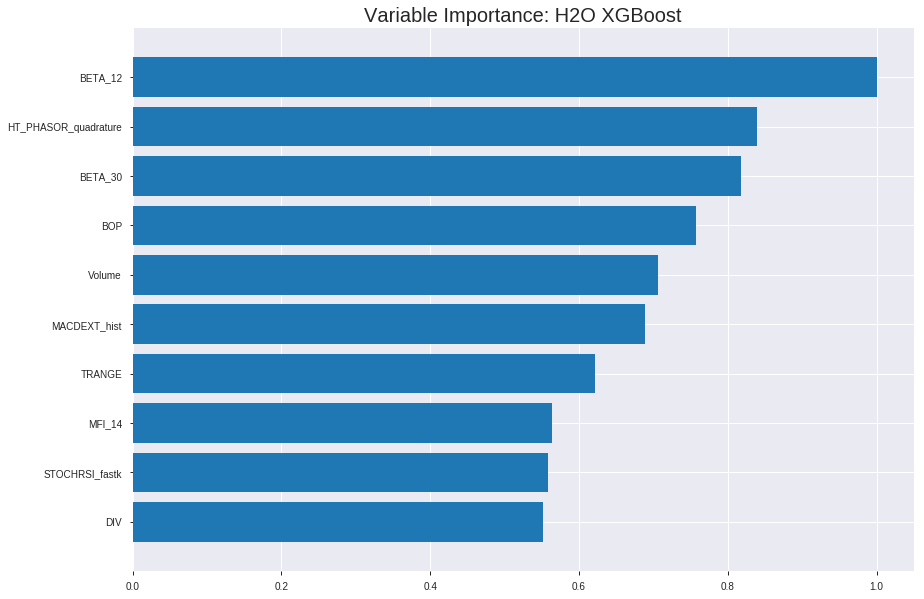

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190825_172923_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1665186485471859
RMSE: 0.40806696576320156
LogLoss: 0.5205086478763453
Mean Per-Class Error: 0.09896191483734462
AUC: 0.9609081592171382
pr_auc: 0.9594433590750743
Gini: 0.9218163184342765
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.501954197883606: 


,0,1,Error,Rate
0,664.0,96.0,0.1263,(96.0/760.0)
1,57.0,739.0,0.0716,(57.0/796.0)
Total,721.0,835.0,0.0983,(153.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5019542,0.9061925,211.0
max f2,0.4694198,0.9341723,237.0
max f0point5,0.5262511,0.9092119,188.0
max accuracy,0.5019542,0.9016710,211.0
max precision,0.8198610,1.0,0.0
max recall,0.3840101,1.0,308.0
max specificity,0.8198610,1.0,0.0
max absolute_mcc,0.5019542,0.8040223,211.0
max min_per_class_accuracy,0.5119127,0.8947368,200.0
max mean_per_class_accuracy,0.5019542,0.9010381,211.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.7651884,1.9547739,1.9547739,1.0,0.7817190,1.0,0.7817190,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.7419021,1.9547739,1.9547739,1.0,0.7547876,1.0,0.7682533,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.7276801,1.9547739,1.9547739,1.0,0.7335573,1.0,0.7571801,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.7146751,1.9547739,1.9547739,1.0,0.7195360,1.0,0.7476197,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.7072320,1.9547739,1.9547739,1.0,0.7111513,1.0,0.7406066,0.0188442,0.0979899,95.4773869,95.4773869
,6,0.1002571,0.6731639,1.9547739,1.9547739,1.0,0.6888123,1.0,0.7147095,0.0979899,0.1959799,95.4773869,95.4773869
,7,0.1503856,0.6500900,1.9046515,1.9380664,0.9743590,0.6634069,0.9914530,0.6976086,0.0954774,0.2914573,90.4651462,93.8066400
,8,0.2005141,0.6306587,1.9046515,1.9297127,0.9743590,0.6409139,0.9871795,0.6834349,0.0954774,0.3869347,90.4651462,92.9712666
,9,0.3001285,0.5920227,1.8412709,1.9003583,0.9419355,0.6116677,0.9721627,0.6596150,0.1834171,0.5703518,84.1270870,90.0358323
,10,0.4003856,0.5568042,1.7041618,1.8512305,0.8717949,0.5762392,0.9470305,0.6387376,0.1708543,0.7412060,70.4161835,85.1230470




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26888851741389264
RMSE: 0.5185446146802536
LogLoss: 0.7354360565877798
Mean Per-Class Error: 0.47668608649917066
AUC: 0.49290973823684103
pr_auc: 0.49713684241409956
Gini: -0.014180523526317934
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2278393656015396: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2278394,0.6834320,399.0
max f2,0.2278394,0.8436815,399.0
max f0point5,0.2278394,0.5743411,399.0
max accuracy,0.5195306,0.5258427,280.0
max precision,0.5925969,0.545,177.0
max recall,0.2278394,1.0,399.0
max specificity,0.8166655,0.9953271,0.0
max absolute_mcc,0.7922459,0.1107536,4.0
max min_per_class_accuracy,0.5778035,0.5108225,196.0
max mean_per_class_accuracy,0.5925969,0.5233139,177.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 56.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.7905507,0.0,0.0,0.0,0.8028483,0.0,0.8028483,0.0,0.0,-100.0,-100.0
,2,0.0202247,0.7641965,0.9632035,0.4280904,0.5,0.7809821,0.2222222,0.7931300,0.0086580,0.0086580,-3.6796537,-57.1909572
,3,0.0314607,0.7550241,1.1558442,0.6880025,0.6,0.7573612,0.3571429,0.7803554,0.0129870,0.0216450,15.5844156,-31.1997526
,4,0.0404494,0.7483929,1.4448052,0.8561809,0.75,0.7510814,0.4444444,0.7738501,0.0129870,0.0346320,44.4805195,-14.3819144
,5,0.0516854,0.7416553,0.0,0.6700546,0.0,0.7453318,0.3478261,0.7676504,0.0,0.0346320,-100.0,-32.9945417
,6,0.1011236,0.7009780,0.9632035,0.8133718,0.5,0.7226225,0.4222222,0.7456368,0.0476190,0.0822511,-3.6796537,-18.6628187
,7,0.1505618,0.6806950,1.0507674,0.8913226,0.5454545,0.6912109,0.4626866,0.7277656,0.0519481,0.1341991,5.0767414,-10.8677392
,8,0.2,0.6675380,0.8756395,0.8874459,0.4545455,0.6746475,0.4606742,0.7146353,0.0432900,0.1774892,-12.4360488,-11.2554113
,9,0.3011236,0.6317213,1.1558442,0.9775796,0.6,0.6503506,0.5074627,0.6930471,0.1168831,0.2943723,15.5844156,-2.2420366
,10,0.4,0.6048832,1.1821133,1.0281385,0.6136364,0.6171902,0.5337079,0.6742960,0.1168831,0.4112554,18.2113341,2.8138528



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:29:55,19.307 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4884319,0.5,0.6931472,0.5,0.0,1.0,0.4808989
,2019-08-25 17:29:55,19.801 sec,5.0,0.4886089,0.6705647,0.7645910,0.7641278,1.8397872,0.3168380,0.5009077,0.6949722,0.4879941,0.5092116,0.7705628,0.4808989
,2019-08-25 17:29:55,19.950 sec,10.0,0.4777606,0.6493811,0.8207278,0.8162974,1.9547739,0.2789203,0.5028109,0.6988555,0.4834830,0.5049568,0.7705628,0.4808989
,2019-08-25 17:29:55,20.100 sec,15.0,0.4674085,0.6295002,0.8655572,0.8687369,1.9547739,0.2152956,0.5055308,0.7045309,0.4788809,0.4915725,0.7705628,0.4808989
,2019-08-25 17:29:56,20.262 sec,20.0,0.4588250,0.6131592,0.8884207,0.8884082,1.9547739,0.1883033,0.5075481,0.7089188,0.4796294,0.4897534,0.3852814,0.4786517
,2019-08-25 17:29:56,20.410 sec,25.0,0.4520660,0.6004285,0.9019679,0.8998138,1.9547739,0.1831620,0.5110965,0.7167157,0.4734292,0.4850602,0.7705628,0.4786517
,2019-08-25 17:29:56,20.575 sec,30.0,0.4411648,0.5800553,0.9178483,0.9160925,1.9547739,0.1535990,0.5116493,0.7181009,0.4844742,0.4948468,0.7705628,0.4786517
,2019-08-25 17:29:56,20.740 sec,35.0,0.4312743,0.5620266,0.9372355,0.9370093,1.9547739,0.1388175,0.5124144,0.7200939,0.4856981,0.4907485,0.7705628,0.4786517
,2019-08-25 17:29:56,20.907 sec,40.0,0.4233603,0.5477850,0.9481123,0.9473170,1.9547739,0.1176093,0.5152700,0.7269643,0.4846664,0.4883411,0.3852814,0.4786517
,2019-08-25 17:29:56,21.069 sec,45.0,0.4156284,0.5340020,0.9565980,0.9552512,1.9547739,0.1015424,0.5175235,0.7326354,0.4919792,0.4963101,0.7705628,0.4786517


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_12,148.0438538,1.0,0.0200401
HT_PHASOR_quadrature,124.2231674,0.8390971,0.0168156
BETA_30,121.0552216,0.8176984,0.0163868
BOP,112.1654282,0.7576500,0.0151834
Volume,104.6250916,0.7067169,0.0141627
---,---,---,---
BBANDS_upperband_12_1_5,3.3069305,0.0223375,0.0004476
BBANDS_lowerband_30_0_3,2.8420122,0.0191971,0.0003847
MA_8_6,2.8153975,0.0190173,0.0003811
BBANDS_upperband_14_7_3,2.6814528,0.0181126,0.0003630



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5739910313901345)

('F1', 0.65015479876161)

('auc', 0.542009353330108)

('logloss', 0.7214029013704011)

('mean_per_class_error', 0.441904531527173)

('rmse', 0.5134056706163341)

('mse', 0.2635853826210077)

xgboost prediction progress: |████████████████████████████████████████████| 100%


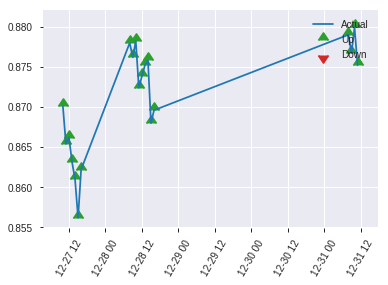


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2635853826210077
RMSE: 0.5134056706163341
LogLoss: 0.7214029013704011
Mean Per-Class Error: 0.441904531527173
AUC: 0.542009353330108
pr_auc: 0.5324361373607535
Gini: 0.08401870666021605
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4165300130844116: 


,0,1,Error,Rate
0,5.0,112.0,0.9573,(112.0/117.0)
1,1.0,105.0,0.0094,(1.0/106.0)
Total,6.0,217.0,0.5067,(113.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4165300,0.6501548,216.0
max f2,0.3102275,0.8191654,222.0
max f0point5,0.4591086,0.5414013,208.0
max accuracy,0.6708323,0.5739910,38.0
max precision,0.7802500,1.0,0.0
max recall,0.3102275,1.0,222.0
max specificity,0.7802500,1.0,0.0
max absolute_mcc,0.7125852,0.1877045,15.0
max min_per_class_accuracy,0.6042049,0.5283019,108.0
max mean_per_class_accuracy,0.6708323,0.5580955,38.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 59.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.7513419,1.4025157,1.4025157,0.6666667,0.7649814,0.6666667,0.7649814,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.7297893,1.0518868,1.2622642,0.5,0.7356984,0.6,0.7532682,0.0094340,0.0283019,5.1886792,26.2264151
,3,0.0313901,0.7258506,2.1037736,1.5026954,1.0,0.7274919,0.7142857,0.7459036,0.0188679,0.0471698,110.3773585,50.2695418
,4,0.0403587,0.7196095,1.0518868,1.4025157,0.5,0.7234286,0.6666667,0.7409091,0.0094340,0.0566038,5.1886792,40.2515723
,5,0.0538117,0.7157402,2.1037736,1.5778302,1.0,0.7179234,0.75,0.7351627,0.0283019,0.0849057,110.3773585,57.7830189
,6,0.1031390,0.6925454,1.3387650,1.4634947,0.6363636,0.7028438,0.6956522,0.7197058,0.0660377,0.1509434,33.8765009,46.3494668
,7,0.1524664,0.6743202,0.9562607,1.2993896,0.4545455,0.6828442,0.6176471,0.7077800,0.0471698,0.1981132,-4.3739280,29.9389567
,8,0.2017937,0.6613487,0.9562607,1.2155136,0.4545455,0.6679881,0.5777778,0.6980531,0.0471698,0.2452830,-4.3739280,21.5513627
,9,0.3004484,0.6403180,0.6693825,1.0361870,0.3181818,0.6491444,0.4925373,0.6819935,0.0660377,0.3113208,-33.0617496,3.6186990
,10,0.3991031,0.6146471,1.2431389,1.0873437,0.5909091,0.6269567,0.5168539,0.6683889,0.1226415,0.4339623,24.3138937,8.7343651


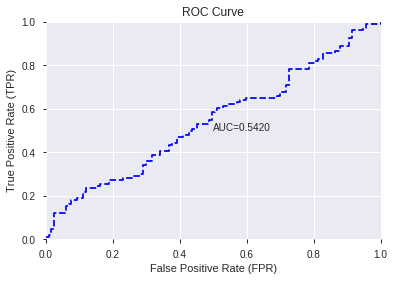

This function is available for GLM models only


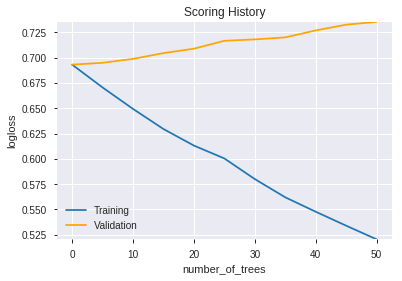

--2019-08-25 17:30:03--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.139.3
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.139.3|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.indexOf(String.java:1578)
	at java.base/java.lang.String.indexOf(String.java:1535)
	at java.base/java.lang.String.split(String.java:2274)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.jav

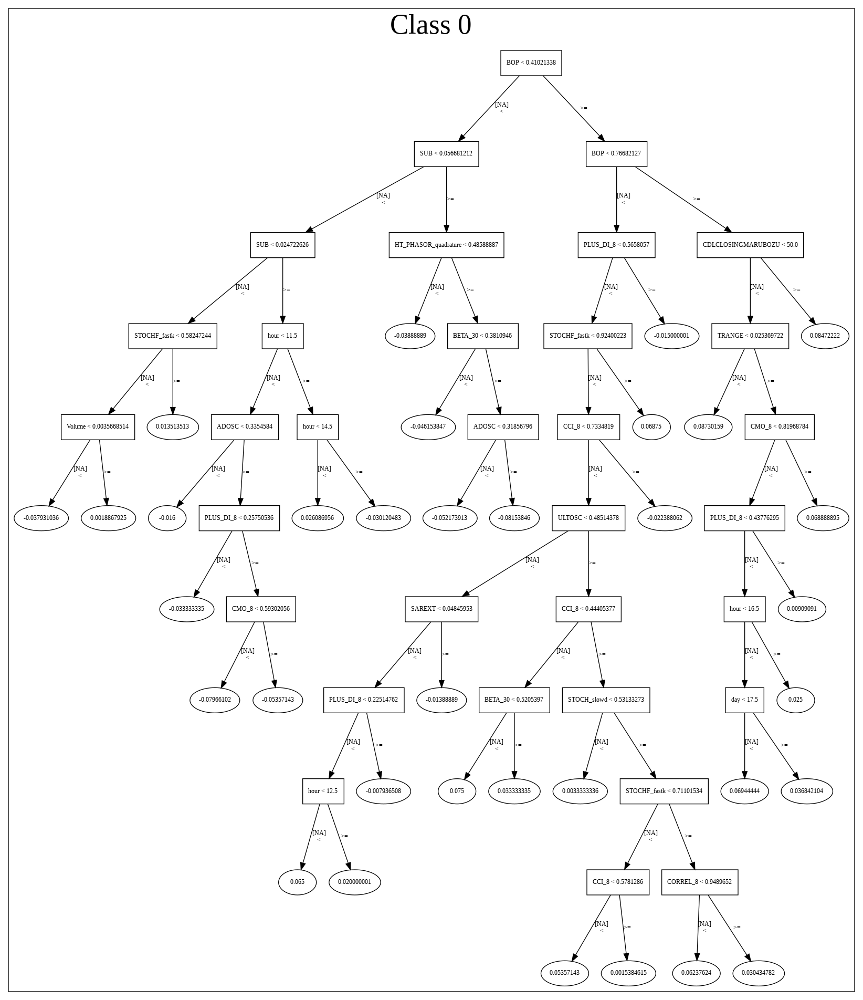

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190825_172923_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190825_172923_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_42_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

In [18]:
# XGBoost
xgb_features = model_train(feature_name='All',model_algo="XGBoost")

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_173011_model_7,0.574343,0.729823,0.500000,0.511903,0.262044
1,DeepLearning_1_AutoML_20190825_173011,0.546847,1.071891,0.487179,0.575178,0.330829
2,DeepLearning_grid_1_AutoML_20190825_173011_model_5,0.539913,0.692903,0.491453,0.499709,0.249709
3,DeepLearning_grid_1_AutoML_20190825_173011_model_1,0.536768,2.892795,0.495726,0.646938,0.418529
4,DeepLearning_grid_1_AutoML_20190825_173011_model_4,0.533382,1.360029,0.487179,0.617933,0.381842
5,DeepLearning_grid_1_AutoML_20190825_173011_model_6,0.533140,0.694735,0.462425,0.500739,0.250739
6,DeepLearning_grid_1_AutoML_20190825_173011_model_8,0.508990,0.693938,0.495726,0.500395,0.250395
7,DeepLearning_grid_1_AutoML_20190825_173011_model_3,0.508950,0.995290,0.474802,0.579817,0.336188
8,DeepLearning_grid_1_AutoML_20190825_173011_model_2,0.499758,1.778535,0.500000,0.643929,0.414644
9,DeepLearning_grid_1_AutoML_20190825_173011_model_9,0.488671,0.694022,0.500000,0.500437,0.250438


,variable,relative_importance,scaled_importance,percentage
0,HT_PHASOR_inphase,1.000000,1.000000,0.021314
1,DX_12,0.983614,0.983614,0.020965
2,STOCHF_fastd,0.980866,0.980866,0.020906
3,hour,0.979635,0.979635,0.020880
4,aroondown_20,0.965306,0.965306,0.020574
5,HT_PHASOR_quadrature,0.964359,0.964359,0.020554
6,STDDEV_8,0.963640,0.963640,0.020539
7,CDLLONGLINE,0.961171,0.961171,0.020486
8,dayofyear,0.960026,0.960026,0.020462
9,day,0.958135,0.958135,0.020421


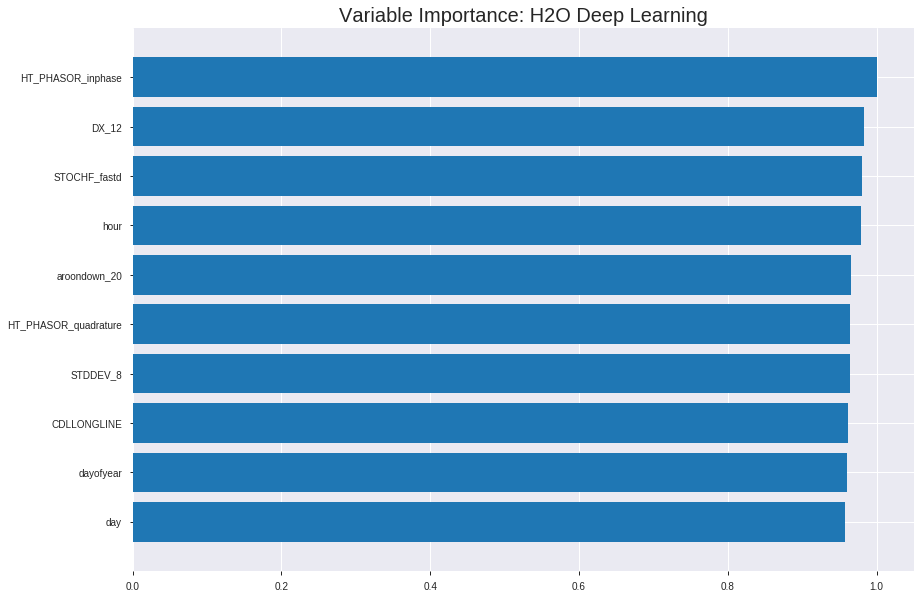

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_173011_model_7


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.21898093431881235
RMSE: 0.46795398739492794
LogLoss: 0.6325992568345185
Mean Per-Class Error: 0.34043903729172176
AUC: 0.7108957617032532
pr_auc: 0.7175721774632488
Gini: 0.4217915234065064
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.30849029454038174: 


,0,1,Error,Rate
0,196.0,564.0,0.7421,(564.0/760.0)
1,65.0,731.0,0.0817,(65.0/796.0)
Total,261.0,1295.0,0.4042,(629.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3084903,0.6991870,299.0
max f2,0.0137167,0.8396624,399.0
max f0point5,0.5467511,0.6669132,183.0
max accuracy,0.5271314,0.6606684,195.0
max precision,0.9730375,1.0,0.0
max recall,0.0137167,1.0,399.0
max specificity,0.9730375,1.0,0.0
max absolute_mcc,0.5271314,0.3210650,195.0
max min_per_class_accuracy,0.5532693,0.6557789,179.0
max mean_per_class_accuracy,0.5467511,0.6595610,183.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.56 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.8874822,1.7104271,1.7104271,0.875,0.9250152,0.875,0.9250152,0.0175879,0.0175879,71.0427136,71.0427136
,2,0.0205656,0.8524374,1.5882538,1.6493405,0.8125,0.8683220,0.84375,0.8966686,0.0163317,0.0339196,58.8253769,64.9340452
,3,0.0302057,0.8274661,1.5638191,1.6220464,0.8,0.8400052,0.8297872,0.8785846,0.0150754,0.0489950,56.3819095,62.2046402
,4,0.0404884,0.8088994,1.8326005,1.6755205,0.9375,0.8178502,0.8571429,0.8631600,0.0188442,0.0678392,83.2600503,67.5520459
,5,0.0501285,0.7791551,1.6941374,1.6791006,0.8666667,0.7952234,0.8589744,0.8500952,0.0163317,0.0841709,69.4137353,67.9100631
,6,0.1002571,0.7287543,1.6039170,1.6415088,0.8205128,0.7537616,0.8397436,0.8019284,0.0804020,0.1645729,60.3917021,64.1508826
,7,0.1503856,0.6928425,1.6289782,1.6373320,0.8333333,0.7106455,0.8376068,0.7715008,0.0816583,0.2462312,62.8978224,63.7331959
,8,0.2005141,0.6641311,1.4284886,1.5851211,0.7307692,0.6780551,0.8108974,0.7481394,0.0716080,0.3178392,42.8488597,58.5121118
,9,0.3001285,0.6287421,1.1602529,1.4441049,0.5935484,0.6445154,0.7387580,0.7137460,0.1155779,0.4334171,16.0252877,44.4104893
,10,0.4003856,0.5913689,1.0651011,1.3492019,0.5448718,0.6100108,0.6902087,0.6877706,0.1067839,0.5402010,6.5101147,34.9201868




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.28324464017591083
RMSE: 0.5322073281869678
LogLoss: 0.7835956868737501
Mean Per-Class Error: 0.4642857142857143
AUC: 0.5308087551078206
pr_auc: 0.5429277627142467
Gini: 0.0616175102156411
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.08433302898699938: 


,0,1,Error,Rate
0,5.0,209.0,0.9766,(209.0/214.0)
1,1.0,230.0,0.0043,(1.0/231.0)
Total,6.0,439.0,0.4719,(210.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0843330,0.6865672,393.0
max f2,0.0529810,0.8449159,397.0
max f0point5,0.0843330,0.5787620,393.0
max accuracy,0.3534445,0.5393258,262.0
max precision,0.9264762,1.0,0.0
max recall,0.0529810,1.0,397.0
max specificity,0.9264762,1.0,0.0
max absolute_mcc,0.6304800,0.0863011,67.0
max min_per_class_accuracy,0.4586613,0.5233645,197.0
max mean_per_class_accuracy,0.4336081,0.5357143,211.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 43.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.8361558,1.1558442,1.1558442,0.6,0.8734818,0.6,0.8734818,0.0129870,0.0129870,15.5844156,15.5844156
,2,0.0202247,0.8121786,0.9632035,1.0702261,0.5,0.8240072,0.5555556,0.8514931,0.0086580,0.0216450,-3.6796537,7.0226070
,3,0.0314607,0.7706813,1.1558442,1.1008040,0.6,0.7888608,0.5714286,0.8291244,0.0129870,0.0346320,15.5844156,10.0803958
,4,0.0404494,0.7616278,0.9632035,1.0702261,0.5,0.7651795,0.5555556,0.8149144,0.0086580,0.0432900,-3.6796537,7.0226070
,5,0.0516854,0.7444937,1.5411255,1.1725955,0.8,0.7528762,0.6086957,0.8014279,0.0173160,0.0606061,54.1125541,17.2595520
,6,0.1011236,0.6873061,0.9632035,1.0702261,0.5,0.7100087,0.5555556,0.7567340,0.0476190,0.1082251,-3.6796537,7.0226070
,7,0.1505618,0.6379712,1.3134593,1.1500937,0.6818182,0.6625597,0.5970149,0.7258111,0.0649351,0.1731602,31.3459268,15.0093687
,8,0.2,0.6079051,0.8756395,1.0822511,0.4545455,0.6215069,0.5617978,0.7000280,0.0432900,0.2164502,-12.4360488,8.2251082
,9,0.3011236,0.5543065,0.8989899,1.0207081,0.4666667,0.5825265,0.5298507,0.6605685,0.0909091,0.3073593,-10.1010101,2.0708148
,10,0.4,0.5032145,1.1821133,1.0606061,0.6136364,0.5266904,0.5505618,0.6274751,0.1168831,0.4242424,18.2113341,6.0606061



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:35:02,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 17:35:07,6.249 sec,245 obs/sec,0.8026992,1,1249.0,0.6163041,1.3681076,-0.5201368,0.5143307,0.5241138,1.3439070,0.4884319,0.6014118,1.3463338,-0.4488990,0.5529292,0.5750018,1.5411255,0.4764045
,2019-08-25 17:35:19,17.788 sec,478 obs/sec,4.7634961,6,7412.0,0.4679540,0.6325993,0.1236071,0.7108958,0.7175722,1.7104271,0.4042416,0.5322073,0.7835957,-0.1346345,0.5308088,0.5429278,1.1558442,0.4719101
,2019-08-25 17:35:32,30.595 sec,546 obs/sec,9.5520566,12,14863.0,0.4303420,0.5473514,0.2588261,0.7988355,0.7965020,1.8326005,0.2866324,0.5563456,0.9496497,-0.2398911,0.5497734,0.5565981,1.1558442,0.4786517
,2019-08-25 17:35:44,42.946 sec,578 obs/sec,14.2994859,18,22250.0,0.3731842,0.4283326,0.4426359,0.8889629,0.8904474,1.9547739,0.2037275,0.5698092,1.0167736,-0.3006283,0.5351276,0.5512082,1.1558442,0.4808989
,2019-08-25 17:35:56,55.150 sec,599 obs/sec,19.0886889,24,29702.0,0.4229077,0.5526252,0.2842132,0.9198170,0.8744994,1.9547739,0.1555270,0.5957633,1.2605033,-0.4218105,0.5239006,0.5390937,1.1558442,0.4808989
,2019-08-25 17:36:08,1 min 7.327 sec,613 obs/sec,23.8521851,30,37114.0,0.3189162,0.3245729,0.5929519,0.9365710,0.8918879,1.9547739,0.1433162,0.6062794,1.4147092,-0.4724479,0.5325181,0.5394683,0.7705628,0.4808989
,2019-08-25 17:36:20,1 min 19.403 sec,622 obs/sec,28.6240360,36,44539.0,0.2776899,0.2520205,0.6913882,0.9615611,0.9377702,1.9547739,0.1041131,0.6102331,1.5230939,-0.4917147,0.5424809,0.5578002,1.1558442,0.4808989
,2019-08-25 17:36:21,1 min 20.521 sec,622 obs/sec,28.6240360,36,44539.0,0.4679540,0.6325993,0.1236071,0.7108958,0.7175722,1.7104271,0.4042416,0.5322073,0.7835957,-0.1346345,0.5308088,0.5429278,1.1558442,0.4719101


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
HT_PHASOR_inphase,1.0,1.0,0.0213138
DX_12,0.9836142,0.9836142,0.0209645
STOCHF_fastd,0.9808655,0.9808655,0.0209059
hour,0.9796354,0.9796354,0.0208797
aroondown_20,0.9653056,0.9653056,0.0205743
---,---,---,---
WILLR_14,0.8980089,0.8980089,0.0191400
weekday,0.8969566,0.8969566,0.0191175
CORREL_12,0.8947091,0.8947091,0.0190696
ADX_24,0.8906735,0.8906735,0.0189836



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5829596412556054)

('F1', 0.6443768996960486)

('auc', 0.5743428479277536)

('logloss', 0.7298231270483094)

('mean_per_class_error', 0.42581841638445406)

('rmse', 0.5119027536939197)

('mse', 0.2620444292394178)

deeplearning prediction progress: |███████████████████████████████████████| 100%


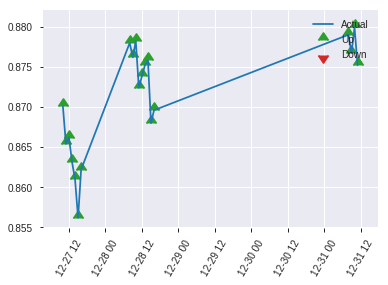


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2620444292394178
RMSE: 0.5119027536939197
LogLoss: 0.7298231270483094
Mean Per-Class Error: 0.42581841638445406
AUC: 0.5743428479277536
pr_auc: 0.5678744810936327
Gini: 0.14868569585550717
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.04406862965574565: 


,0,1,Error,Rate
0,0.0,117.0,1.0,(117.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,0.0,223.0,0.5247,(117.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0440686,0.6443769,222.0
max f2,0.0440686,0.8191654,222.0
max f0point5,0.2907866,0.5541562,171.0
max accuracy,0.5707431,0.5829596,68.0
max precision,0.8934444,1.0,0.0
max recall,0.0440686,1.0,222.0
max specificity,0.8934444,1.0,0.0
max absolute_mcc,0.7445702,0.1669027,21.0
max min_per_class_accuracy,0.4673235,0.5283019,110.0
max mean_per_class_accuracy,0.5648822,0.5741816,70.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 46.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.8489306,2.1037736,2.1037736,1.0,0.8662579,1.0,0.8662579,0.0283019,0.0283019,110.3773585,110.3773585
,2,0.0224215,0.8332804,2.1037736,2.1037736,1.0,0.8403201,1.0,0.8558828,0.0188679,0.0471698,110.3773585,110.3773585
,3,0.0313901,0.8217062,1.0518868,1.8032345,0.5,0.8268240,0.8571429,0.8475803,0.0094340,0.0566038,5.1886792,80.3234501
,4,0.0403587,0.8198081,1.0518868,1.6362683,0.5,0.8211856,0.7777778,0.8417148,0.0094340,0.0660377,5.1886792,63.6268344
,5,0.0538117,0.8118706,1.4025157,1.5778302,0.6666667,0.8166785,0.75,0.8354557,0.0188679,0.0849057,40.2515723,57.7830189
,6,0.1031390,0.7322871,1.3387650,1.4634947,0.6363636,0.7668111,0.6956522,0.8026257,0.0660377,0.1509434,33.8765009,46.3494668
,7,0.1524664,0.6733354,0.9562607,1.2993896,0.4545455,0.6934799,0.6176471,0.7673138,0.0471698,0.1981132,-4.3739280,29.9389567
,8,0.2017937,0.6427979,1.1475129,1.2622642,0.5454545,0.6586254,0.6,0.7407455,0.0566038,0.2547170,14.7512864,26.2264151
,9,0.3004484,0.5795427,1.1475129,1.2245846,0.5454545,0.6081366,0.5820896,0.6972023,0.1132075,0.3679245,14.7512864,22.4584624
,10,0.3991031,0.5251130,0.9562607,1.1582574,0.4545455,0.5501967,0.5505618,0.6608639,0.0943396,0.4622642,-4.3739280,15.8257367


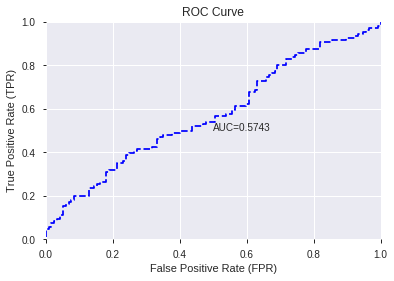

This function is available for GLM models only


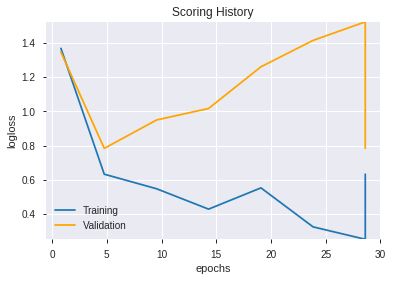

--2019-08-25 17:38:43--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.37.180
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.37.180|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


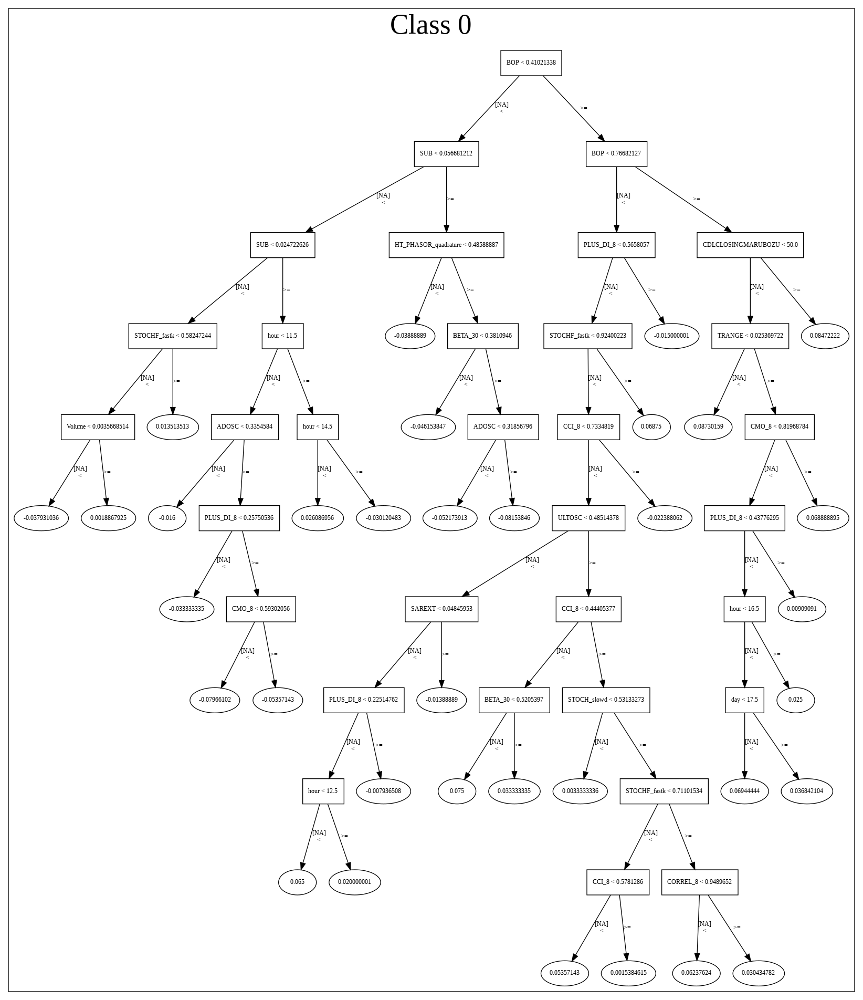

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_173011_model_7',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_173011_model_7',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['HT_PHASOR_inphase',
 'DX_12',
 'STOCHF_fastd',
 'hour',
 'aroondown_20',
 'HT_PHASOR_quadrature',
 'STDDEV_8',
 'CDLLONGLINE',
 'dayofyear',
 'day',
 'weekofyear',
 'BETA_14',
 'BETA_20',
 'BOP',
 'WILLR_8',
 'month',
 'aroonup_8',
 'AD',
 'STOCHRSI_fastd',
 'MACDFIX_signal_12',
 'DX_8',
 'BETA_24',
 'STOCH_slowd',
 'aroondown_12',
 'CCI_12',
 'aroondown_8',
 'AROONOSC_14',
 'SAREXT',
 'MFI_30',
 'STOCH_slowk',
 'dayofweek',
 'weekday_name',
 'AROONOSC_24',
 'aroonup_14',
 'STOCHRSI_fastk',
 'AROONOSC_8',
 'CCI_8',
 'BETA_30',
 'LINEARREG_ANGLE_8',
 'aroonup_20',
 'AROONOSC_30',
 'MFI_8',
 'aroondown_14',
 'quarter',
 'CORREL_8',
 'WILLR_14',
 'weekday',
 'CORREL_12',
 'ADX_24',
 'HT_TRENDMODE']

In [19]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_173850_model_1,0.496613,0.694148,0.479963,0.5005,0.250501


,variable,relative_importance,scaled_importance,percentage
0,ADX_24,0.008572,1.000000,0.072705
1,BETA_30,0.008154,0.951198,0.069157
2,BETA_20,0.005650,0.659157,0.047924
3,BETA_24,0.005195,0.606097,0.044067
4,CORREL_8,0.005104,0.595380,0.043287
5,CDLLONGLINE,0.004830,0.563471,0.040967
6,CORREL_12,0.004763,0.555598,0.040395
7,STOCHRSI_fastk,0.004128,0.481573,0.035013
8,HT_TRENDMODE,0.003821,0.445775,0.032410
9,STDDEV_8,0.003794,0.442631,0.032182


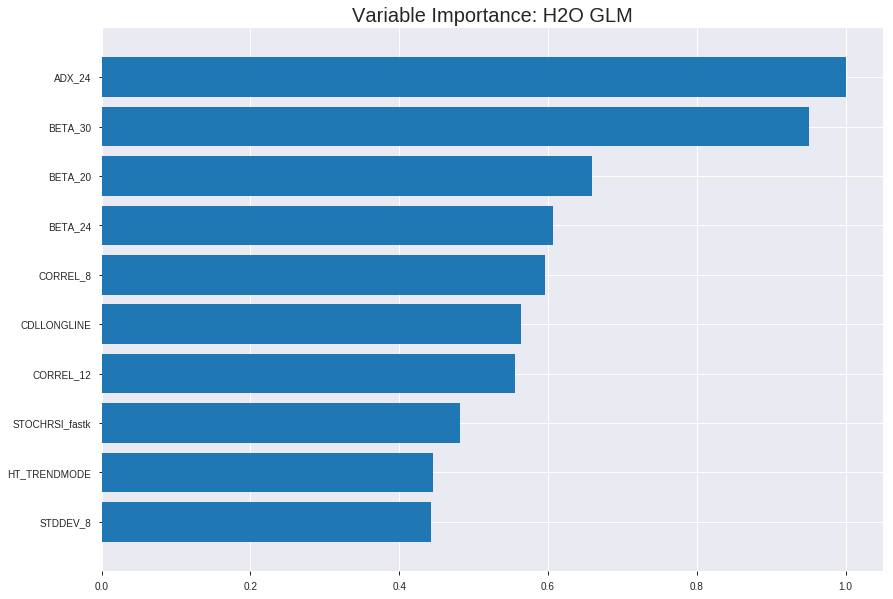

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_173850_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24908142652557058
RMSE: 0.4990805811946309
LogLoss: 0.6913083501120943
Null degrees of freedom: 1555
Residual degrees of freedom: 1505
Null deviance: 2156.2410466952756
Residual deviance: 2151.3515855488376
AIC: 2253.3515855488376
AUC: 0.5574426408357578
pr_auc: 0.5758033851822062
Gini: 0.11488528167151557
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47282359305676813: 


,0,1,Error,Rate
0,0.0,760.0,1.0,(760.0/760.0)
1,0.0,796.0,0.0,(0.0/796.0)
Total,0.0,1556.0,0.4884,(760.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4728236,0.6768707,399.0
max f2,0.4728236,0.8396624,399.0
max f0point5,0.5071622,0.5701079,257.0
max accuracy,0.5136869,0.5449871,170.0
max precision,0.5367456,1.0,0.0
max recall,0.4728236,1.0,399.0
max specificity,0.5367456,1.0,0.0
max absolute_mcc,0.5187664,0.1081375,105.0
max min_per_class_accuracy,0.5118607,0.5376884,195.0
max mean_per_class_accuracy,0.5136869,0.5470048,170.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.5310905,1.7104271,1.7104271,0.875,0.5326453,0.875,0.5326453,0.0175879,0.0175879,71.0427136,71.0427136
,2,0.0205656,0.5284580,1.2217337,1.4660804,0.625,0.5294819,0.75,0.5310636,0.0125628,0.0301508,22.1733668,46.6080402
,3,0.0302057,0.5272970,1.5638191,1.4972736,0.8,0.5277487,0.7659574,0.5300057,0.0150754,0.0452261,56.3819095,49.7273602
,4,0.0404884,0.5263708,1.0995603,1.3962670,0.5625,0.5268527,0.7142857,0.5292049,0.0113065,0.0565327,9.9560302,39.6267050
,5,0.0501285,0.5256205,1.1728643,1.3533050,0.6,0.5259304,0.6923077,0.5285752,0.0113065,0.0678392,17.2864322,35.3304986
,6,0.1002571,0.5224604,1.1778766,1.2655908,0.6025641,0.5237521,0.6474359,0.5261637,0.0590452,0.1268844,17.7876562,26.5590774
,7,0.1503856,0.5205834,1.1026930,1.2112915,0.5641026,0.5214642,0.6196581,0.5245972,0.0552764,0.1821608,10.2692952,21.1291500
,8,0.2005141,0.5190025,1.1778766,1.2029378,0.6025641,0.5197984,0.6153846,0.5233975,0.0590452,0.2412060,17.7876562,20.2937766
,9,0.3001285,0.5164318,0.9332469,1.1134258,0.4774194,0.5177678,0.5695931,0.5215290,0.0929648,0.3341709,-6.6753120,11.3425801
,10,0.4003856,0.5139878,1.0901624,1.1076006,0.5576923,0.5151837,0.5666132,0.5199401,0.1092965,0.4434673,9.0162350,10.7600603




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2501603251639217
RMSE: 0.5001602994680023
LogLoss: 0.6934679233269064
Null degrees of freedom: 444
Residual degrees of freedom: 394
Null deviance: 616.3524839130139
Residual deviance: 617.1864517609467
AIC: 719.1864517609467
AUC: 0.477596391147793
pr_auc: 0.5063413904578862
Gini: -0.04480721770441398
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4894682388347844: 


,0,1,Error,Rate
0,3.0,211.0,0.986,(211.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,3.0,442.0,0.4742,(211.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4894682,0.6864785,396.0
max f2,0.4894682,0.8455344,396.0
max f0point5,0.4894682,0.5777889,396.0
max accuracy,0.4894682,0.5258427,396.0
max precision,0.5211529,0.6,14.0
max recall,0.4894682,1.0,396.0
max specificity,0.5264108,0.9953271,0.0
max absolute_mcc,0.4979907,0.1288983,358.0
max min_per_class_accuracy,0.5078508,0.4813084,197.0
max mean_per_class_accuracy,0.5102539,0.5135939,140.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 50.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.5241978,0.7705628,0.7705628,0.4,0.5252454,0.4,0.5252454,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.5222882,0.9632035,0.8561809,0.5,0.5233456,0.4444444,0.5244010,0.0086580,0.0173160,-3.6796537,-14.3819144
,3,0.0314607,0.5214010,1.5411255,1.1008040,0.8,0.5219942,0.5714286,0.5235414,0.0173160,0.0346320,54.1125541,10.0803958
,4,0.0404494,0.5208221,0.4816017,0.9632035,0.25,0.5210467,0.5,0.5229871,0.0043290,0.0389610,-51.8398268,-3.6796537
,5,0.0516854,0.5205102,0.7705628,0.9213251,0.4,0.5206813,0.4782609,0.5224858,0.0086580,0.0476190,-22.9437229,-7.8674948
,6,0.1011236,0.5176932,0.9632035,0.9417989,0.5,0.5192798,0.4888889,0.5209184,0.0476190,0.0952381,-3.6796537,-5.8201058
,7,0.1505618,0.5153288,0.9632035,0.9488273,0.5,0.5160580,0.4925373,0.5193225,0.0476190,0.1428571,-3.6796537,-5.1172708
,8,0.2,0.5134673,1.0507674,0.9740260,0.5454545,0.5145280,0.5056180,0.5181373,0.0519481,0.1948052,5.0767414,-2.5974026
,9,0.3011236,0.5108436,1.0702261,1.0063320,0.5555556,0.5121251,0.5223881,0.5161183,0.1082251,0.3030303,7.0226070,0.6331976
,10,0.4,0.5093265,0.8756395,0.9740260,0.4545455,0.5101658,0.5056180,0.5146469,0.0865801,0.3896104,-12.4360488,-2.5974026



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 17:38:51,0.000 sec,2,.31E1,51,1.3826167,1.3869358
,2019-08-25 17:38:51,0.009 sec,4,.19E1,51,1.3813460,1.3877240
,2019-08-25 17:38:51,0.018 sec,6,.12E1,51,1.3798001,1.3887466
,2019-08-25 17:38:51,0.027 sec,8,.74E0,51,1.3780111,1.3900085
,2019-08-25 17:38:51,0.038 sec,10,.46E0,51,1.3760206,1.3915163


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5381165919282511)

('F1', 0.6477987421383649)

('auc', 0.4966134494436381)

('logloss', 0.6941483084060684)

('mean_per_class_error', 0.4703273665537817)

('rmse', 0.500500250158673)

('mse', 0.25050050040889427)

glm prediction progress: |████████████████████████████████████████████████| 100%


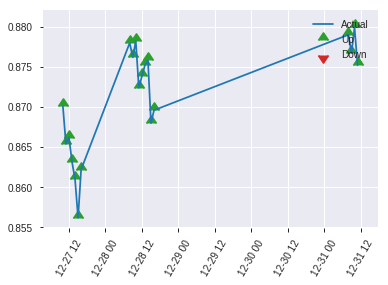


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.25050050040889427
RMSE: 0.500500250158673
LogLoss: 0.6941483084060684
Null degrees of freedom: 222
Residual degrees of freedom: 172
Null deviance: 309.77213152668094
Residual deviance: 309.5901455491065
AIC: 411.5901455491065
AUC: 0.4966134494436381
pr_auc: 0.4777831277363822
Gini: -0.006773101112723778
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.492195348454182: 


,0,1,Error,Rate
0,8.0,109.0,0.9316,(109.0/117.0)
1,3.0,103.0,0.0283,(3.0/106.0)
Total,11.0,212.0,0.5022,(112.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4921953,0.6477987,210.0
max f2,0.4851864,0.8191654,221.0
max f0point5,0.4921953,0.5398323,210.0
max accuracy,0.5166366,0.5381166,28.0
max precision,0.5285778,1.0,0.0
max recall,0.4851864,1.0,221.0
max specificity,0.5285778,1.0,0.0
max absolute_mcc,0.5013681,0.1008350,156.0
max min_per_class_accuracy,0.5073345,0.4871795,111.0
max mean_per_class_accuracy,0.5116661,0.5296726,72.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 50.70 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.5253339,1.4025157,1.4025157,0.6666667,0.5265593,0.6666667,0.5265593,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.5235366,0.0,0.8415094,0.0,0.5243064,0.4,0.5256581,0.0,0.0188679,-100.0,-15.8490566
,3,0.0313901,0.5221344,2.1037736,1.2021563,1.0,0.5228723,0.5714286,0.5248622,0.0188679,0.0377358,110.3773585,20.2156334
,4,0.0403587,0.5216389,0.0,0.9350105,0.0,0.5220722,0.4444444,0.5242422,0.0,0.0377358,-100.0,-6.4989518
,5,0.0538117,0.5205798,0.7012579,0.8765723,0.3333333,0.5210907,0.4166667,0.5234543,0.0094340,0.0471698,-29.8742138,-12.3427673
,6,0.1031390,0.5175678,1.3387650,1.0976210,0.6363636,0.5193422,0.5217391,0.5214877,0.0660377,0.1132075,33.8765009,9.7621001
,7,0.1524664,0.5159858,1.1475129,1.1137625,0.5454545,0.5166699,0.5294118,0.5199290,0.0566038,0.1698113,14.7512864,11.3762486
,8,0.2017937,0.5148484,0.7650086,1.0285115,0.3636364,0.5153442,0.4888889,0.5188083,0.0377358,0.2075472,-23.4991424,2.8511530
,9,0.3004484,0.5122682,1.0518868,1.0361870,0.5,0.5138504,0.4925373,0.5171803,0.1037736,0.3113208,5.1886792,3.6186990
,10,0.3991031,0.5102365,0.8606346,0.9927920,0.4090909,0.5112414,0.4719101,0.5157122,0.0849057,0.3962264,-13.9365352,-0.7207971


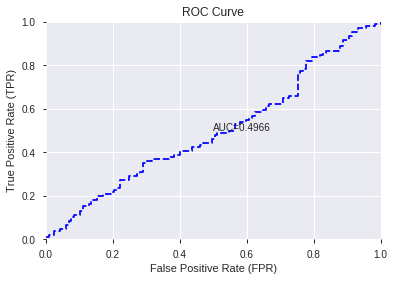

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


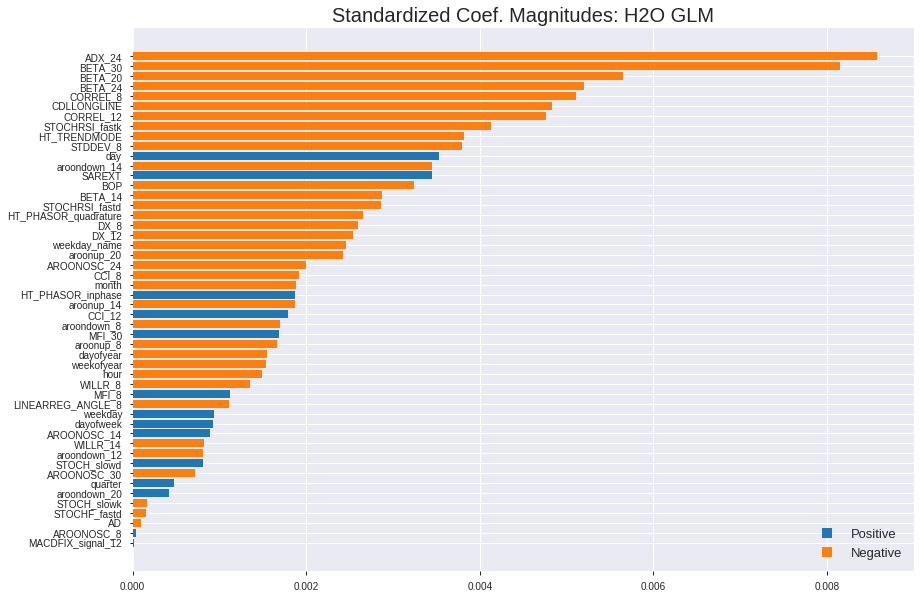

'log_likelihood'
--2019-08-25 17:38:55--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.168.163
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.168.163|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


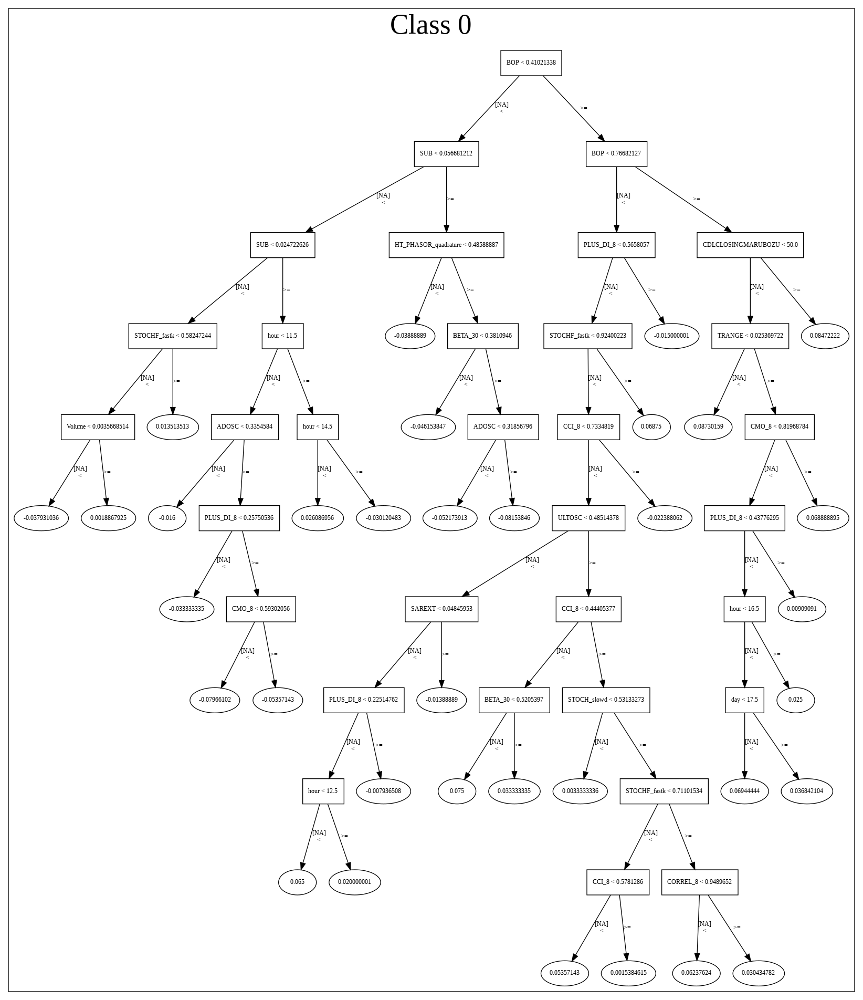

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_173850_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_173850_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_58_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_58_s

['ADX_24',
 'BETA_30',
 'BETA_20',
 'BETA_24',
 'CORREL_8',
 'CDLLONGLINE',
 'CORREL_12',
 'STOCHRSI_fastk',
 'HT_TRENDMODE',
 'STDDEV_8',
 'day',
 'aroondown_14',
 'SAREXT',
 'BOP',
 'BETA_14',
 'STOCHRSI_fastd',
 'HT_PHASOR_quadrature',
 'DX_8',
 'DX_12',
 'weekday_name',
 'aroonup_20',
 'AROONOSC_24',
 'CCI_8',
 'month',
 'HT_PHASOR_inphase',
 'aroonup_14',
 'CCI_12',
 'aroondown_8',
 'MFI_30',
 'aroonup_8',
 'dayofyear',
 'weekofyear',
 'hour',
 'WILLR_8',
 'MFI_8',
 'LINEARREG_ANGLE_8',
 'weekday',
 'dayofweek',
 'AROONOSC_14',
 'WILLR_14',
 'aroondown_12',
 'STOCH_slowd',
 'AROONOSC_30',
 'quarter',
 'aroondown_20',
 'STOCH_slowk',
 'STOCHF_fastd',
 'AD',
 'AROONOSC_8',
 'MACDFIX_signal_12']

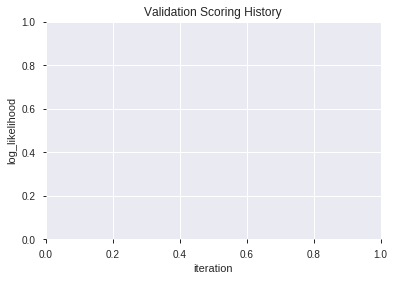

In [20]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20190825_173902,0.538784,0.702723,0.491453,0.504322,0.254341
1,XGBoost_grid_1_AutoML_20190825_173902_model_3,0.520319,0.698139,0.491453,0.502487,0.252493
2,XGBoost_grid_1_AutoML_20190825_173902_model_5,0.509192,0.726864,0.495726,0.515135,0.265364
3,XGBoost_grid_1_AutoML_20190825_173902_model_4,0.494960,0.707199,0.500000,0.506855,0.256902
4,XGBoost_grid_1_AutoML_20190825_173902_model_7,0.493953,0.722854,0.500000,0.513606,0.263791
5,XGBoost_grid_1_AutoML_20190825_173902_model_2,0.482745,0.707112,0.500000,0.506816,0.256862
6,XGBoost_grid_1_AutoML_20190825_173902_model_1,0.476375,0.711704,0.487179,0.509031,0.259112
7,XGBoost_2_AutoML_20190825_173902,0.473553,0.720461,0.500000,0.512900,0.263066
8,XGBoost_3_AutoML_20190825_173902,0.468312,0.717074,0.487623,0.511412,0.261543
9,XGBoost_grid_1_AutoML_20190825_173902_model_6,0.449847,0.717223,0.482906,0.511768,0.261906


,variable,relative_importance,scaled_importance,percentage
0,BETA_14,330.311554,1.000000,0.048737
1,BOP,294.482758,0.891530,0.043451
2,STOCH_slowd,234.200623,0.709029,0.034556
3,SAREXT,234.152069,0.708882,0.034549
4,ADX_24,228.180481,0.690804,0.033668
5,BETA_30,226.991348,0.687204,0.033492
6,WILLR_8,221.778717,0.671423,0.032723
7,CCI_8,206.571075,0.625383,0.030479
8,CCI_12,205.716110,0.622794,0.030353
9,BETA_24,198.572815,0.601168,0.029299


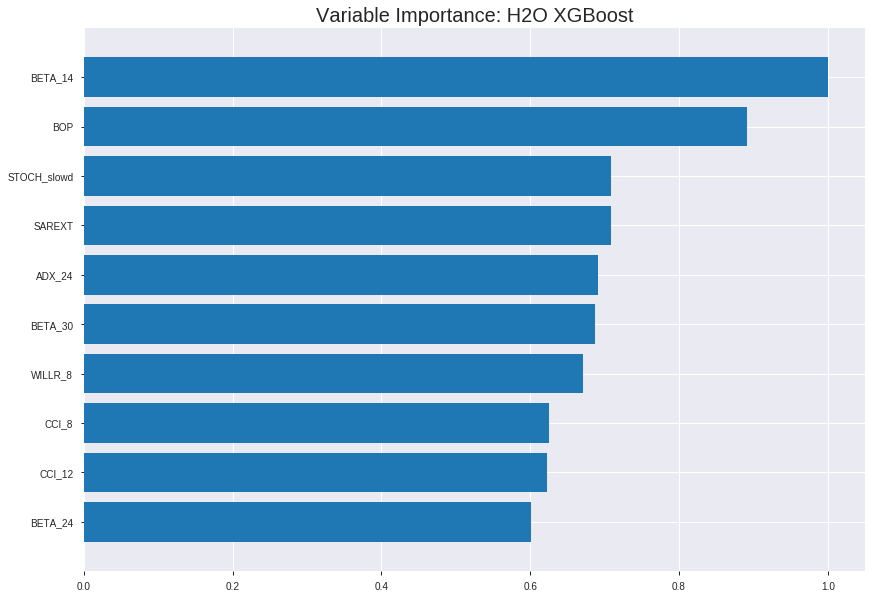

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20190825_173902


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15384165973932493
RMSE: 0.39222654134992563
LogLoss: 0.4930236383203889
Mean Per-Class Error: 0.08057392224279292
AUC: 0.9731635149431367
pr_auc: 0.9708919232136549
Gini: 0.9463270298862734
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5213015675544739: 


,0,1,Error,Rate
0,711.0,49.0,0.0645,(49.0/760.0)
1,77.0,719.0,0.0967,(77.0/796.0)
Total,788.0,768.0,0.081,(126.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5213016,0.9194373,190.0
max f2,0.4476541,0.9432146,240.0
max f0point5,0.5303146,0.9345048,183.0
max accuracy,0.5223819,0.9190231,189.0
max precision,0.8714042,1.0,0.0
max recall,0.3650775,1.0,303.0
max specificity,0.8714042,1.0,0.0
max absolute_mcc,0.5223819,0.8387274,189.0
max min_per_class_accuracy,0.5125674,0.9145729,195.0
max mean_per_class_accuracy,0.5223819,0.9194261,189.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 50.96 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.7831542,1.9547739,1.9547739,1.0,0.8097506,1.0,0.8097506,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.7624682,1.9547739,1.9547739,1.0,0.7730895,1.0,0.7914200,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.7487998,1.9547739,1.9547739,1.0,0.7536444,1.0,0.7793640,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.7373267,1.9547739,1.9547739,1.0,0.7423438,1.0,0.7699620,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.7254472,1.9547739,1.9547739,1.0,0.7310521,1.0,0.7624794,0.0188442,0.0979899,95.4773869,95.4773869
,6,0.1002571,0.6948809,1.9297127,1.9422433,0.9871795,0.7100971,0.9935897,0.7362882,0.0967337,0.1947236,92.9712666,94.2243268
,7,0.1503856,0.6711883,1.9297127,1.9380664,0.9871795,0.6820554,0.9914530,0.7182106,0.0967337,0.2914573,92.9712666,93.8066400
,8,0.2005141,0.6473732,1.9297127,1.9359780,0.9871795,0.6596975,0.9903846,0.7035823,0.0967337,0.3881910,92.9712666,93.5977967
,9,0.3001285,0.6069645,1.9043281,1.9254732,0.9741935,0.6262209,0.9850107,0.6779056,0.1896985,0.5778894,90.4328092,92.5473190
,10,0.4003856,0.5655226,1.8044066,1.8951580,0.9230769,0.5886598,0.9695024,0.6555584,0.1809045,0.7587940,80.4406649,89.5157973




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26470188420818286
RMSE: 0.5144918699145623
LogLoss: 0.7245652799217243
Mean Per-Class Error: 0.48284581462151555
AUC: 0.48756928429825624
pr_auc: 0.5031018965746743
Gini: -0.02486143140348751
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.21909315884113312: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2190932,0.6834320,399.0
max f2,0.2190932,0.8436815,399.0
max f0point5,0.2190932,0.5743411,399.0
max accuracy,0.4084993,0.5258427,288.0
max precision,0.6858521,0.5454545,10.0
max recall,0.2190932,1.0,399.0
max specificity,0.7463040,0.9953271,0.0
max absolute_mcc,0.3128564,0.0979685,383.0
max min_per_class_accuracy,0.4807220,0.4848485,198.0
max mean_per_class_accuracy,0.4084993,0.5171542,288.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 47.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.7283899,0.7705628,0.7705628,0.4,0.7381872,0.4,0.7381872,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.6990144,0.9632035,0.8561809,0.5,0.7153408,0.4444444,0.7280333,0.0086580,0.0173160,-3.6796537,-14.3819144
,3,0.0314607,0.6779585,0.7705628,0.8256030,0.4,0.6858706,0.4285714,0.7129752,0.0086580,0.0259740,-22.9437229,-17.4397032
,4,0.0404494,0.6686286,0.9632035,0.8561809,0.5,0.6722503,0.4444444,0.7039252,0.0086580,0.0346320,-3.6796537,-14.3819144
,5,0.0516854,0.6516482,1.5411255,1.0050819,0.8,0.6631487,0.5217391,0.6950607,0.0173160,0.0519481,54.1125541,0.5081875
,6,0.1011236,0.6086378,0.7880756,0.8989899,0.4090909,0.6249207,0.4666667,0.6607700,0.0389610,0.0909091,-21.1924439,-10.1010101
,7,0.1505618,0.5869038,1.1383314,0.9775796,0.5909091,0.5961659,0.5074627,0.6395567,0.0562771,0.1471861,13.8331366,-2.2420366
,8,0.2,0.5665884,0.7880756,0.9307359,0.4090909,0.5761027,0.4831461,0.6238715,0.0389610,0.1861472,-21.1924439,-6.9264069
,9,0.3011236,0.5327813,1.1130351,0.9919558,0.5777778,0.5490271,0.5149254,0.5987372,0.1125541,0.2987013,11.3035113,-0.8044195
,10,0.4,0.5029033,1.0507674,1.0064935,0.5454545,0.5137874,0.5224719,0.5777383,0.1038961,0.4025974,5.0767414,0.6493506



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:39:02,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4884319,0.5,0.6931472,0.5,0.0,1.0,0.4808989
,2019-08-25 17:39:02,0.092 sec,5.0,0.4853698,0.6642410,0.8094444,0.8127395,1.9547739,0.2679949,0.5020260,0.6972191,0.4764636,0.4863333,0.3852814,0.4808989
,2019-08-25 17:39:02,0.147 sec,10.0,0.4719652,0.6383173,0.8664391,0.8612076,1.9547739,0.2185090,0.5032209,0.6996747,0.4861735,0.5034480,0.7705628,0.4808989
,2019-08-25 17:39:02,0.204 sec,15.0,0.4604990,0.6164946,0.8948823,0.8893888,1.9547739,0.1825193,0.5043711,0.7020786,0.4926670,0.5150413,1.5411255,0.4764045
,2019-08-25 17:39:02,0.262 sec,20.0,0.4496347,0.5961089,0.9139034,0.9102863,1.9547739,0.1619537,0.5067421,0.7070403,0.4817939,0.5050507,1.1558442,0.4786517
,2019-08-25 17:39:02,0.322 sec,25.0,0.4386915,0.5759305,0.9344081,0.9326566,1.9547739,0.1426735,0.5074066,0.7085738,0.4893292,0.5113538,1.1558442,0.4808989
,2019-08-25 17:39:02,0.379 sec,30.0,0.4282809,0.5569167,0.9458163,0.9424480,1.9547739,0.1246787,0.5086407,0.7113358,0.4924647,0.5114363,1.1558442,0.4808989
,2019-08-25 17:39:02,0.439 sec,35.0,0.4186680,0.5395746,0.9551913,0.9534586,1.9547739,0.1118252,0.5116639,0.7177681,0.4789113,0.5048566,1.1558442,0.4808989
,2019-08-25 17:39:02,0.500 sec,40.0,0.4091834,0.5226779,0.9619198,0.9609609,1.9547739,0.1079692,0.5116968,0.7179731,0.4863050,0.5098940,1.1558442,0.4808989
,2019-08-25 17:39:02,0.559 sec,45.0,0.4002408,0.5070213,0.9687690,0.9668552,1.9547739,0.0925450,0.5129376,0.7208539,0.4882470,0.5065509,1.1558442,0.4808989


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_14,330.3115540,1.0,0.0487371
BOP,294.4827576,0.8915303,0.0434506
STOCH_slowd,234.2006226,0.7090295,0.0345560
SAREXT,234.1520691,0.7088825,0.0345489
ADX_24,228.1804810,0.6908038,0.0336678
---,---,---,---
dayofweek,28.3462753,0.0858168,0.0041825
HT_TRENDMODE,25.5609894,0.0773845,0.0037715
weekday_name,21.3652248,0.0646820,0.0031524
weekday,11.3384104,0.0343264,0.0016730



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.57847533632287)

('F1', 0.6483180428134556)

('auc', 0.5387840670859538)

('logloss', 0.7027225061972883)

('mean_per_class_error', 0.4327527818093856)

('rmse', 0.5043224185611129)

('mse', 0.25434110186333037)

xgboost prediction progress: |████████████████████████████████████████████| 100%


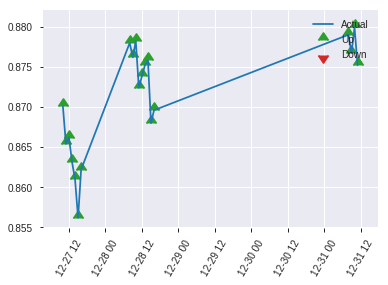


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.25434110186333037
RMSE: 0.5043224185611129
LogLoss: 0.7027225061972883
Mean Per-Class Error: 0.4327527818093856
AUC: 0.5387840670859538
pr_auc: 0.5018369534134419
Gini: 0.07756813417190767
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.24590083956718445: 


,0,1,Error,Rate
0,2.0,115.0,0.9829,(115.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,2.0,221.0,0.5157,(115.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2459008,0.6483180,220.0
max f2,0.2459008,0.8217054,220.0
max f0point5,0.3809974,0.5387409,179.0
max accuracy,0.5574299,0.5784753,59.0
max precision,0.7658705,1.0,0.0
max recall,0.2459008,1.0,220.0
max specificity,0.7658705,1.0,0.0
max absolute_mcc,0.5574299,0.1514540,59.0
max min_per_class_accuracy,0.4850252,0.5377358,108.0
max mean_per_class_accuracy,0.5574299,0.5672472,59.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 48.52 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.7112150,1.4025157,1.4025157,0.6666667,0.7322653,0.6666667,0.7322653,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.6889024,1.0518868,1.2622642,0.5,0.6950157,0.6,0.7173654,0.0094340,0.0283019,5.1886792,26.2264151
,3,0.0313901,0.6774116,1.0518868,1.2021563,0.5,0.6833277,0.5714286,0.7076404,0.0094340,0.0377358,5.1886792,20.2156334
,4,0.0403587,0.6680802,0.0,0.9350105,0.0,0.6754726,0.4444444,0.7004920,0.0,0.0377358,-100.0,-6.4989518
,5,0.0538117,0.6620371,0.0,0.7012579,0.0,0.6645726,0.3333333,0.6915121,0.0,0.0377358,-100.0,-29.8742138
,6,0.1031390,0.6334733,0.9562607,0.8232158,0.4545455,0.6471023,0.3913043,0.6702727,0.0471698,0.0849057,-4.3739280,-17.6784249
,7,0.1524664,0.6050386,1.5300172,1.0518868,0.7272727,0.6125697,0.5,0.6516040,0.0754717,0.1603774,53.0017153,5.1886792
,8,0.2017937,0.5758904,1.5300172,1.1687631,0.7272727,0.5874716,0.5555556,0.6359272,0.0754717,0.2358491,53.0017153,16.8763103
,9,0.3004484,0.5479101,1.2431389,1.1931850,0.5909091,0.5626083,0.5671642,0.6118524,0.1226415,0.3584906,24.3138937,19.3185018
,10,0.3991031,0.5087255,0.9562607,1.1346195,0.4545455,0.5287671,0.5393258,0.5913144,0.0943396,0.4528302,-4.3739280,13.4619462


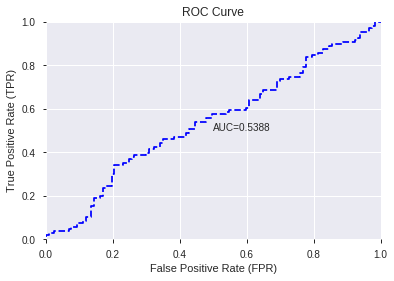

This function is available for GLM models only


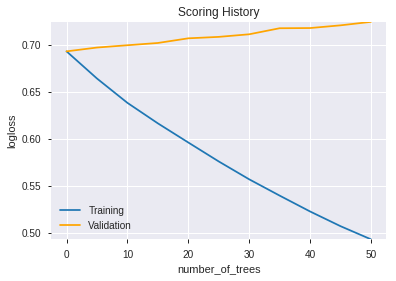

--2019-08-25 17:39:15--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.20
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.20|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoMode

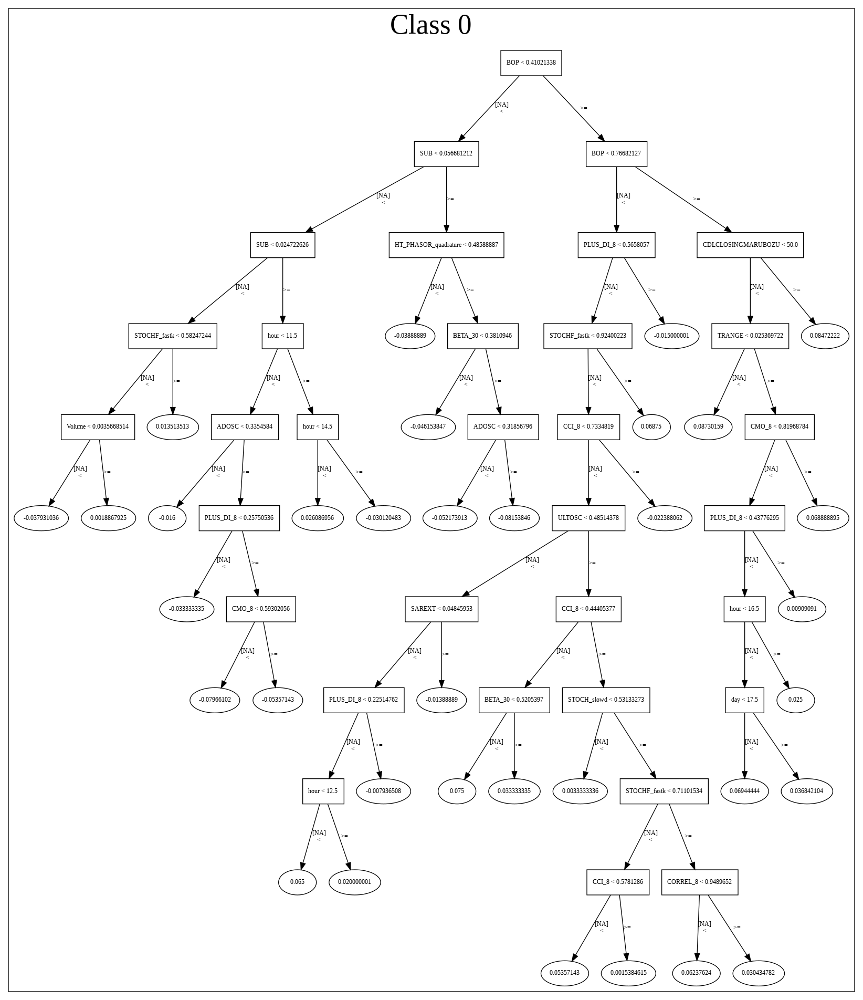

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20190825_173902',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20190825_173902',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_66_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_66_sid_b784',
   'type

['BETA_14',
 'BOP',
 'STOCH_slowd',
 'SAREXT',
 'ADX_24',
 'BETA_30',
 'WILLR_8',
 'CCI_8',
 'CCI_12',
 'BETA_24',
 'AD',
 'DX_12',
 'HT_PHASOR_inphase',
 'STOCHRSI_fastd',
 'MFI_8',
 'HT_PHASOR_quadrature',
 'dayofyear',
 'STDDEV_8',
 'MACDFIX_signal_12',
 'AROONOSC_30',
 'MFI_30',
 'AROONOSC_24',
 'day',
 'WILLR_14',
 'DX_8',
 'BETA_20',
 'CORREL_12',
 'STOCHRSI_fastk',
 'hour',
 'aroondown_20',
 'LINEARREG_ANGLE_8',
 'STOCH_slowk',
 'AROONOSC_14',
 'aroonup_20',
 'aroonup_8',
 'aroonup_14',
 'aroondown_12',
 'CORREL_8',
 'STOCHF_fastd',
 'aroondown_14',
 'AROONOSC_8',
 'aroondown_8',
 'weekofyear',
 'CDLLONGLINE',
 'dayofweek',
 'HT_TRENDMODE',
 'weekday_name',
 'weekday',
 'month']

In [21]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del xgb_features,glm_features,dl_features
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [23]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [24]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [25]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [27]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [28]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [29]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [31]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [32]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [33]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [35]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [36]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [37]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [39]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [40]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [41]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [43]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [44]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [45]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [46]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [ 12  13 894 994 998] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


0

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_173924_model_4,0.579906,3.502933,0.5,0.718481,0.516214
1,DeepLearning_grid_1_AutoML_20190825_173924_model_2,0.530721,1.003004,0.5,0.591621,0.350015
2,DeepLearning_grid_1_AutoML_20190825_173924_model_1,0.526205,5.907870,0.5,0.686443,0.471204
3,DeepLearning_grid_1_AutoML_20190825_173924_model_9,0.500000,0.694717,0.5,0.500784,0.250785
4,DeepLearning_grid_1_AutoML_20190825_173924_model_5,0.500000,0.695028,0.5,0.500939,0.250940
5,DeepLearning_grid_1_AutoML_20190825_173924_model_7,0.500000,0.700093,0.5,0.503453,0.253464
6,DeepLearning_grid_1_AutoML_20190825_173924_model_8,0.500000,0.693196,0.5,0.500025,0.250025
7,DeepLearning_1_AutoML_20190825_173924,0.500000,0.692498,0.5,0.499675,0.249675
8,DeepLearning_grid_1_AutoML_20190825_173924_model_3,0.487099,0.772068,0.5,0.532587,0.283649
9,DeepLearning_grid_1_AutoML_20190825_173924_model_6,0.486051,0.693726,0.5,0.500289,0.250289


,variable,relative_importance,scaled_importance,percentage
0,CDLIDENTICAL3CROWS,1.000000,1.000000,0.002355
1,CDLCOUNTERATTACK,0.988468,0.988468,0.002328
2,CDLGAPSIDESIDEWHITE,0.982273,0.982273,0.002313
3,CDLHOMINGPIGEON,0.974275,0.974275,0.002295
4,CDLTASUKIGAP,0.972427,0.972427,0.002290
5,CDLEVENINGDOJISTAR,0.959929,0.959929,0.002261
6,CDLSTICKSANDWICH,0.958476,0.958476,0.002257
7,CDL2CROWS,0.950387,0.950387,0.002238
8,CDLLADDERBOTTOM,0.928823,0.928823,0.002188
9,CDLONNECK,0.918436,0.918436,0.002163


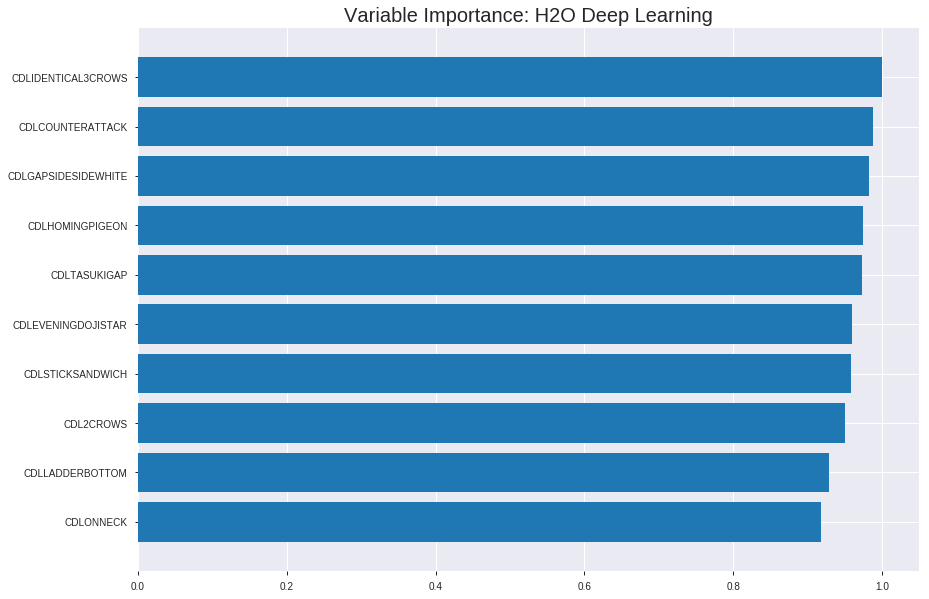

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_173924_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.31673306684469765
RMSE: 0.5627904288851203
LogLoss: 1.1705939188517132
Mean Per-Class Error: 0.3485420523670987
AUC: 0.6744999669399631
pr_auc: 0.647781828170058
Gini: 0.3489999338799261
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.044430611890877325: 


,0,1,Error,Rate
0,362.0,398.0,0.5237,(398.0/760.0)
1,162.0,634.0,0.2035,(162.0/796.0)
Total,524.0,1032.0,0.3599,(560.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0444306,0.6936543,358.0
max f2,0.0002188,0.8396624,399.0
max f0point5,0.1053723,0.6586538,322.0
max accuracy,0.1053723,0.6523136,322.0
max precision,0.9948438,1.0,0.0
max recall,0.0002188,1.0,399.0
max specificity,0.9948438,1.0,0.0
max absolute_mcc,0.1053723,0.3038326,322.0
max min_per_class_accuracy,0.1298851,0.6447368,308.0
max mean_per_class_accuracy,0.1053723,0.6514579,322.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 29.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.9748768,1.4660804,1.4660804,0.75,0.9819537,0.75,0.9819537,0.0150754,0.0150754,46.6080402,46.6080402
,2,0.0205656,0.9607873,1.5882538,1.5271671,0.8125,0.9692914,0.78125,0.9756225,0.0163317,0.0314070,58.8253769,52.7167085
,3,0.0302057,0.9497077,1.3031826,1.4556827,0.6666667,0.9549818,0.7446809,0.9690350,0.0125628,0.0439698,30.3182580,45.5682669
,4,0.0404884,0.9343787,1.0995603,1.3652389,0.5625,0.9431661,0.6984127,0.9624651,0.0113065,0.0552764,9.9560302,36.5238893
,5,0.0501285,0.9248668,0.7819095,1.2530602,0.4,0.9298945,0.6410256,0.9562016,0.0075377,0.0628141,-21.8090452,25.3060173
,6,0.1002571,0.8542126,1.4535498,1.3533050,0.7435897,0.8976457,0.6923077,0.9269236,0.0728643,0.1356784,45.3549800,35.3304986
,7,0.1503856,0.7611081,1.4786110,1.3950737,0.7564103,0.8057779,0.7136752,0.8865417,0.0741206,0.2097990,47.8611004,39.5073659
,8,0.2005141,0.6564889,1.2029378,1.3470397,0.6153846,0.7127869,0.6891026,0.8431030,0.0603015,0.2701005,20.2937766,34.7039686
,9,0.3001285,0.4501934,1.2611444,1.3185306,0.6451613,0.5458542,0.6745182,0.7444444,0.1256281,0.3957286,26.1144432,31.8530554
,10,0.4003856,0.2496952,1.2781214,1.3084120,0.6538462,0.3420112,0.6693419,0.6436746,0.1281407,0.5238693,27.8121376,30.8412044




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.380617469179657
RMSE: 0.616942030647659
LogLoss: 1.3467322630688492
Mean Per-Class Error: 0.47560383541691953
AUC: 0.5088704130760205
pr_auc: 0.5224604060048104
Gini: 0.01774082615204109
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0054015641457840855: 


,0,1,Error,Rate
0,16.0,198.0,0.9252,(198.0/214.0)
1,6.0,225.0,0.026,(6.0/231.0)
Total,22.0,423.0,0.4584,(204.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0054016,0.6880734,386.0
max f2,0.0003020,0.8442982,398.0
max f0point5,0.0054016,0.5850234,386.0
max accuracy,0.0054016,0.5415730,386.0
max precision,0.9992630,1.0,0.0
max recall,0.0003020,1.0,398.0
max specificity,0.9992630,1.0,0.0
max absolute_mcc,0.0054016,0.1124561,386.0
max min_per_class_accuracy,0.5375348,0.5,197.0
max mean_per_class_accuracy,0.0054016,0.5243962,386.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 51.13 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.9960866,0.7705628,0.7705628,0.4,0.9978040,0.4,0.9978040,0.0086580,0.0086580,-22.9437229,-22.9437229
,2,0.0202247,0.9937225,0.9632035,0.8561809,0.5,0.9948078,0.4444444,0.9964724,0.0086580,0.0173160,-3.6796537,-14.3819144
,3,0.0314607,0.9921047,1.1558442,0.9632035,0.6,0.9925724,0.5,0.9950795,0.0129870,0.0303030,15.5844156,-3.6796537
,4,0.0404494,0.9905899,1.4448052,1.0702261,0.75,0.9913842,0.5555556,0.9942583,0.0129870,0.0432900,44.4805195,7.0226070
,5,0.0516854,0.9888042,1.1558442,1.0888387,0.6,0.9895553,0.5652174,0.9932359,0.0129870,0.0562771,15.5844156,8.8838698
,6,0.1011236,0.9787614,1.1383314,1.1130351,0.5909091,0.9839449,0.5777778,0.9886937,0.0562771,0.1125541,13.8331366,11.3035113
,7,0.1505618,0.9626084,0.8756395,1.0350843,0.4545455,0.9705615,0.5373134,0.9827398,0.0432900,0.1558442,-12.4360488,3.5084319
,8,0.2,0.9265481,0.8756395,0.9956710,0.4545455,0.9491654,0.5168539,0.9744405,0.0432900,0.1991342,-12.4360488,-0.4329004
,9,0.3011236,0.8356597,0.9417989,0.9775796,0.4888889,0.8860161,0.5074627,0.9447458,0.0952381,0.2943723,-5.8201058,-2.2420366
,10,0.4,0.6977509,1.0069854,0.9848485,0.5227273,0.7716447,0.5112360,0.9019567,0.0995671,0.3939394,0.6985439,-1.5151515



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 17:44:58,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 17:45:02,7.066 sec,149 obs/sec,0.4273779,1,665.0,0.6791690,4.8301565,-0.8460702,0.5121248,0.3218316,0.8552136,0.4858612,0.6427963,3.5508998,-0.6551639,0.5364526,0.4771156,1.1558442,0.4808989
,2019-08-25 17:45:26,31.182 sec,157 obs/sec,2.6458869,6,4117.0,0.5893825,1.2965405,-0.3902311,0.5684756,0.5671796,1.4660804,0.4704370,0.6243056,1.4133844,-0.5613086,0.5049460,0.5184816,0.3852814,0.4808989
,2019-08-25 17:45:53,57.240 sec,166 obs/sec,5.3464010,12,8319.0,0.6159187,1.5045122,-0.5182360,0.5920863,0.5790858,1.5882538,0.4768638,0.6159392,1.5361320,-0.5197423,0.5279767,0.5338322,1.1558442,0.4808989
,2019-08-25 17:46:17,1 min 22.095 sec,174 obs/sec,8.0700514,18,12557.0,0.5941226,1.3814364,-0.4126829,0.6458237,0.5985199,1.4660804,0.4074550,0.6621986,4.1816569,-0.7565917,0.4902496,0.4879560,1.1558442,0.4786517
,2019-08-25 17:46:44,1 min 49.004 sec,180 obs/sec,11.2172237,25,17454.0,0.5393930,1.0241465,-0.1644027,0.6697443,0.6890885,1.8326005,0.4428021,0.6319601,1.5651167,-0.5998291,0.5709835,0.5710935,1.1558442,0.4808989
,2019-08-25 17:47:11,2 min 15.506 sec,186 obs/sec,14.4672237,32,22511.0,0.5627904,1.1705939,-0.2676108,0.6745000,0.6477818,1.4660804,0.3598972,0.6169420,1.3467323,-0.5246950,0.5088704,0.5224604,0.7705628,0.4584270


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLIDENTICAL3CROWS,1.0,1.0,0.0023553
CDLCOUNTERATTACK,0.9884681,0.9884681,0.0023281
CDLGAPSIDESIDEWHITE,0.9822727,0.9822727,0.0023135
CDLHOMINGPIGEON,0.9742753,0.9742753,0.0022947
CDLTASUKIGAP,0.9724272,0.9724272,0.0022903
---,---,---,---
BBANDS_middleband_8_3_2,0.3659175,0.3659175,0.0008618
BBANDS_upperband_20_3_3,0.3652625,0.3652625,0.0008603
BBANDS_upperband_20_7_4,0.3624141,0.3624141,0.0008536
BBANDS_upperband_8_8_2,0.3623253,0.3623253,0.0008534



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5829596412556054)

('F1', 0.6443768996960486)

('auc', 0.5799064666989195)

('logloss', 3.5029334089825586)

('mean_per_class_error', 0.41827930978874384)

('rmse', 0.7184805270384271)

('mse', 0.5162142677334159)

deeplearning prediction progress: |███████████████████████████████████████| 100%


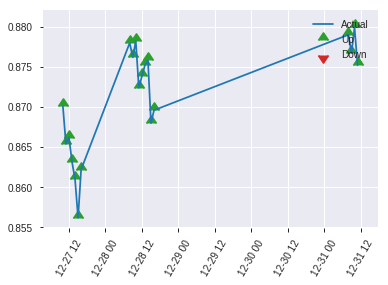


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.5162142677334159
RMSE: 0.7184805270384271
LogLoss: 3.5029334089825586
Mean Per-Class Error: 0.41827930978874384
AUC: 0.5799064666989195
pr_auc: 0.5334259302967197
Gini: 0.15981293339783909
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0011425939494288074: 


,0,1,Error,Rate
0,0.0,117.0,1.0,(117.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,0.0,223.0,0.5247,(117.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0011426,0.6443769,222.0
max f2,0.0011426,0.8191654,222.0
max f0point5,0.9984580,0.5610561,124.0
max accuracy,0.9991262,0.5829596,104.0
max precision,0.9999895,1.0,0.0
max recall,0.0011426,1.0,222.0
max specificity,0.9999895,1.0,0.0
max absolute_mcc,0.9991262,0.1635205,104.0
max min_per_class_accuracy,0.9990023,0.5726496,110.0
max mean_per_class_accuracy,0.9991262,0.5817207,104.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 96.77 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.9999874,1.4025157,1.4025157,0.6666667,0.9999887,0.6666667,0.9999887,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.9999856,1.0518868,1.2622642,0.5,0.9999866,0.6,0.9999879,0.0094340,0.0283019,5.1886792,26.2264151
,3,0.0313901,0.9999833,1.0518868,1.2021563,0.5,0.9999847,0.5714286,0.9999870,0.0094340,0.0377358,5.1886792,20.2156334
,4,0.0403587,0.9999797,1.0518868,1.1687631,0.5,0.9999814,0.5555556,0.9999857,0.0094340,0.0471698,5.1886792,16.8763103
,5,0.0538117,0.9999664,0.7012579,1.0518868,0.3333333,0.9999745,0.5,0.9999829,0.0094340,0.0566038,-29.8742138,5.1886792
,6,0.1031390,0.9999333,1.5300172,1.2805578,0.7272727,0.9999509,0.6086957,0.9999676,0.0754717,0.1320755,53.0017153,28.0557834
,7,0.1524664,0.9998839,0.9562607,1.1756382,0.4545455,0.9999072,0.5588235,0.9999481,0.0471698,0.1792453,-4.3739280,17.5638180
,8,0.2017937,0.9997985,1.1475129,1.1687631,0.5454545,0.9998425,0.5555556,0.9999223,0.0566038,0.2358491,14.7512864,16.8763103
,9,0.3004484,0.9996870,1.2431389,1.1931850,0.5909091,0.9997419,0.5671642,0.9998631,0.1226415,0.3584906,24.3138937,19.3185018
,10,0.3991031,0.9993549,1.1475129,1.1818953,0.5454545,0.9995148,0.5617978,0.9997770,0.1132075,0.4716981,14.7512864,18.1895272


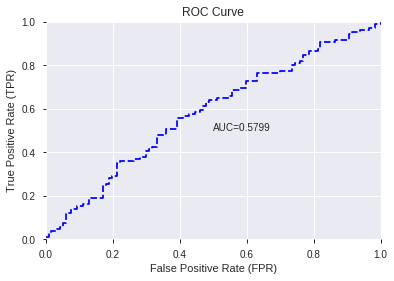

This function is available for GLM models only


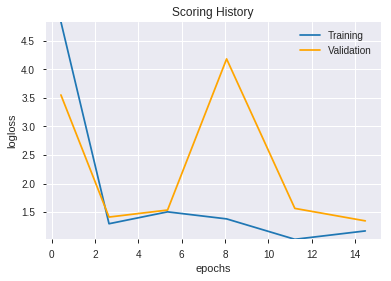

--2019-08-25 18:04:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.81.24
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.81.24|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


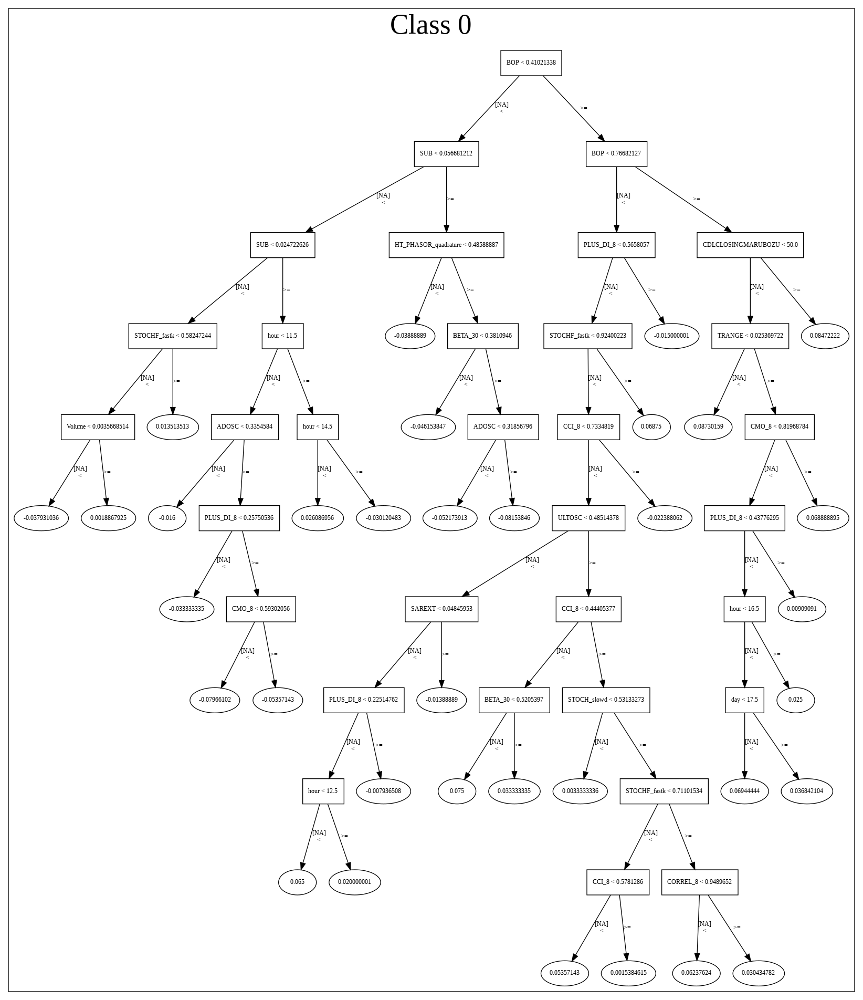

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_173924_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_173924_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_74_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLIDENTICAL3CROWS',
 'CDLCOUNTERATTACK',
 'CDLGAPSIDESIDEWHITE',
 'CDLHOMINGPIGEON',
 'CDLTASUKIGAP',
 'CDLEVENINGDOJISTAR',
 'CDLSTICKSANDWICH',
 'CDL2CROWS',
 'CDLLADDERBOTTOM',
 'CDLONNECK',
 'CDLINNECK',
 'CDLDARKCLOUDCOVER',
 'CDLMORNINGDOJISTAR',
 'CDLHIKKAKEMOD',
 'CDLTHRUSTING',
 'CDLMORNINGSTAR',
 'CDLSTALLEDPATTERN',
 'CDLSEPARATINGLINES',
 'CDLXSIDEGAP3METHODS',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'CDLMATCHINGLOW',
 'is_month_start',
 'CDLEVENINGSTAR',
 'CDLDOJISTAR',
 'CDLADVANCEBLOCK',
 'CDLGRAVESTONEDOJI',
 'CDLHANGINGMAN',
 'CDLHARAMICROSS',
 'CDLDRAGONFLYDOJI',
 'is_month_end',
 'CDL3INSIDE',
 'CDLTAKURI',
 'CDLHAMMER',
 'hour',
 'STOCHRSI_fastk',
 'BOP',
 'HT_TRENDMODE',
 'WILLR_8',
 'CORREL_14',
 'BETA_20',
 'BETA_30',
 'HT_PHASOR_inphase',
 'day',
 'CDLLONGLEGGEDDOJI',
 'CDLDOJI',
 'dayofweek',
 'CDLRICKSHAWMAN',
 'DIV',
 'SAREXT',
 'days_in_month',
 'BETA_12',
 'aroonup_30',
 'HT_PHASOR_quadrature',
 'CDLHIGHWAVE',
 'aroondown_14',
 'weekday_name',
 'BETA_

In [47]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_180408_model_1,0.542896,0.717141,0.487623,0.511614,0.261748


,variable,relative_importance,scaled_importance,percentage
0,BETA_30,7.852613e-03,1.000000,1.309456e-02
1,CDLMARUBOZU,6.790865e-03,0.864791,1.132405e-02
2,is_month_start,6.744045e-03,0.858828,1.124597e-02
3,ADXR_14,6.374908e-03,0.811820,1.063042e-02
4,is_month_end,6.353369e-03,0.809077,1.059450e-02
5,ADX_24,5.938011e-03,0.756183,9.901878e-03
6,CDLBELTHOLD,5.928855e-03,0.755017,9.886611e-03
7,ADXR_12,5.729686e-03,0.729653,9.554488e-03
8,ADX_20,5.601324e-03,0.713307,9.340438e-03
9,BETA_20,5.377014e-03,0.684742,8.966393e-03


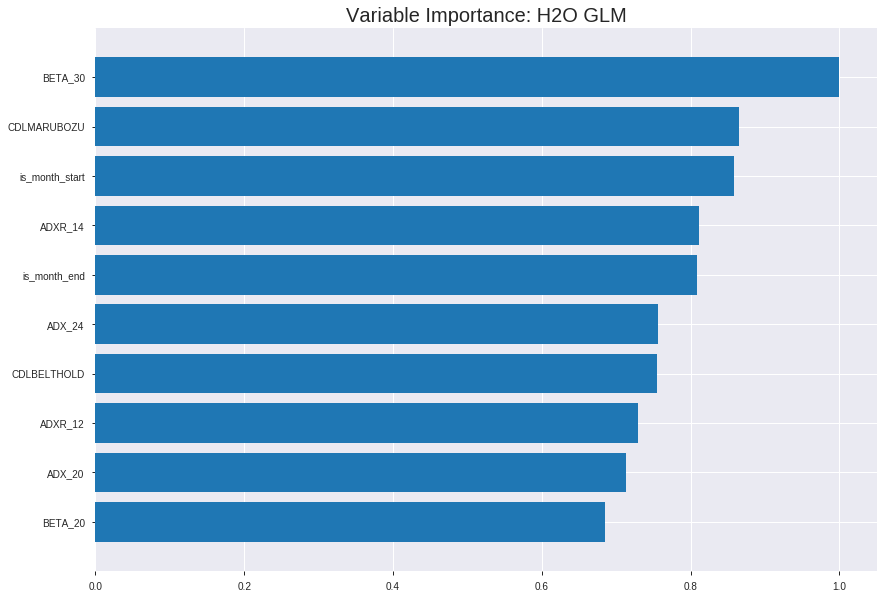

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_180408_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24701508867424465
RMSE: 0.49700612538905864
LogLoss: 0.6871632473325053
Null degrees of freedom: 1555
Residual degrees of freedom: 521
Null deviance: 2156.2410466952756
Residual deviance: 2138.4520256987566
AIC: 4208.452025698756
AUC: 0.583763389314996
pr_auc: 0.5872558282713327
Gini: 0.1675267786299921
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.486656293619819: 


,0,1,Error,Rate
0,119.0,641.0,0.8434,(641.0/760.0)
1,59.0,737.0,0.0741,(59.0/796.0)
Total,178.0,1378.0,0.4499,(700.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4866563,0.6780129,314.0
max f2,0.4087969,0.8398396,398.0
max f0point5,0.4925335,0.5879850,289.0
max accuracy,0.4983615,0.5623393,263.0
max precision,0.5919484,1.0,0.0
max recall,0.4087969,1.0,398.0
max specificity,0.5919484,1.0,0.0
max absolute_mcc,0.4925335,0.1371199,289.0
max min_per_class_accuracy,0.5117384,0.5513158,196.0
max mean_per_class_accuracy,0.5031764,0.5572633,240.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.5622276,1.5882538,1.5882538,0.8125,0.5745546,0.8125,0.5745546,0.0163317,0.0163317,58.8253769,58.8253769
,2,0.0205656,0.5559227,1.2217337,1.4049937,0.625,0.5594549,0.71875,0.5670048,0.0125628,0.0288945,22.1733668,40.4993719
,3,0.0302057,0.5517375,1.3031826,1.3725008,0.6666667,0.5540752,0.7021277,0.5628783,0.0125628,0.0414573,30.3182580,37.2500802
,4,0.0404884,0.5495961,1.3439070,1.3652389,0.6875,0.5508341,0.6984127,0.5598195,0.0138191,0.0552764,34.3907035,36.5238893
,5,0.0501285,0.5473665,0.9122278,1.2781214,0.4666667,0.5485057,0.6538462,0.5576438,0.0087940,0.0640704,-8.7772194,27.8121376
,6,0.1002571,0.5397178,1.2781214,1.2781214,0.6538462,0.5430507,0.6538462,0.5503472,0.0640704,0.1281407,27.8121376,27.8121376
,7,0.1503856,0.5349458,1.1778766,1.2447064,0.6025641,0.5370173,0.6367521,0.5459039,0.0590452,0.1871859,17.7876562,24.4706438
,8,0.2005141,0.5308169,1.1277542,1.2154684,0.5769231,0.5327162,0.6217949,0.5426070,0.0565327,0.2437186,12.7754155,21.5468367
,9,0.3001285,0.5236467,1.0467499,1.1594697,0.5354839,0.5270170,0.5931478,0.5374326,0.1042714,0.3479899,4.6749878,15.9469726
,10,0.4003856,0.5172222,1.0024481,1.1201513,0.5128205,0.5202132,0.5730337,0.5331208,0.1005025,0.4484925,0.2448138,12.0151318




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2540697270879198
RMSE: 0.5040532978643427
LogLoss: 0.701383499325086
Null degrees of freedom: 444
Residual degrees of freedom: -590
Null deviance: 616.3524839130139
Residual deviance: 624.2313143993266
AIC: 2694.2313143993265
AUC: 0.46099850305457785
pr_auc: 0.4875815581296637
Gini: -0.07800299389084431
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4359907920879382: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4359908,0.6834320,399.0
max f2,0.4359908,0.8436815,399.0
max f0point5,0.4605180,0.5748317,379.0
max accuracy,0.4635977,0.5235955,377.0
max precision,0.5874807,0.5263158,18.0
max recall,0.4359908,1.0,399.0
max specificity,0.6313733,0.9953271,0.0
max absolute_mcc,0.5607481,0.1044775,105.0
max min_per_class_accuracy,0.5315221,0.4632035,195.0
max mean_per_class_accuracy,0.4802066,0.5074948,341.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 52.86 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.6094608,0.3852814,0.3852814,0.2,0.6177696,0.2,0.6177696,0.0043290,0.0043290,-61.4718615,-61.4718615
,2,0.0202247,0.6036378,0.9632035,0.6421356,0.5,0.6062823,0.3333333,0.6126641,0.0086580,0.0129870,-3.6796537,-35.7864358
,3,0.0314607,0.5916048,1.5411255,0.9632035,0.8,0.5962146,0.5,0.6067893,0.0173160,0.0303030,54.1125541,-3.6796537
,4,0.0404494,0.5876153,0.9632035,0.9632035,0.5,0.5900321,0.5,0.6030655,0.0086580,0.0389610,-3.6796537,-3.6796537
,5,0.0516854,0.5845295,1.1558442,1.0050819,0.6,0.5858294,0.5217391,0.5993185,0.0129870,0.0519481,15.5844156,0.5081875
,6,0.1011236,0.5795485,0.8756395,0.9417989,0.4545455,0.5816493,0.4888889,0.5906802,0.0432900,0.0952381,-12.4360488,-5.8201058
,7,0.1505618,0.5739064,0.9632035,0.9488273,0.5,0.5759613,0.4925373,0.5858471,0.0476190,0.1428571,-3.6796537,-5.1172708
,8,0.2,0.5694307,0.7005116,0.8874459,0.3636364,0.5722239,0.4606742,0.5824796,0.0346320,0.1774892,-29.9488390,-11.2554113
,9,0.3011236,0.5571886,0.8133718,0.8625703,0.4222222,0.5628145,0.4477612,0.5758757,0.0822511,0.2597403,-18.6628187,-13.7429734
,10,0.4,0.5426967,1.1383314,0.9307359,0.5909091,0.5495707,0.4831461,0.5693733,0.1125541,0.3722944,13.8331366,-6.9264069



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 18:04:11,0.000 sec,2,.34E1,1035,1.3743265,1.4027670
,2019-08-25 18:04:13,1.707 sec,4,.25E1,1035,1.3716281,1.4069215
,2019-08-25 18:04:14,3.449 sec,6,.18E1,1036,1.3683776,1.4116958
,2019-08-25 18:04:16,5.151 sec,8,.13E1,1036,1.3645250,1.4175362
,2019-08-25 18:04:18,6.855 sec,10,.96E0,1036,1.3600538,1.4245107


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5560538116591929)

('F1', 0.6481481481481481)

('auc', 0.5428963070472504)

('logloss', 0.717141479730846)

('mean_per_class_error', 0.4438800193517174)

('rmse', 0.5116135417583073)

('mse', 0.2617484161104793)

glm prediction progress: |████████████████████████████████████████████████| 100%


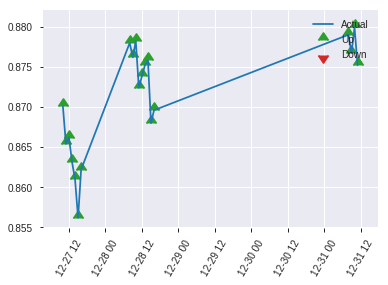


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2617484161104793
RMSE: 0.5116135417583073
LogLoss: 0.717141479730846
Null degrees of freedom: 222
Residual degrees of freedom: -812
Null deviance: 309.77213152668094
Residual deviance: 319.8450999599573
AIC: 2389.845099959957
AUC: 0.5428963070472504
pr_auc: 0.5048781952525406
Gini: 0.0857926140945009
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5213165535466251: 


,0,1,Error,Rate
0,4.0,113.0,0.9658,(113.0/117.0)
1,1.0,105.0,0.0094,(1.0/106.0)
Total,5.0,218.0,0.5112,(114.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5213166,0.6481481,217.0
max f2,0.5178355,0.8191654,222.0
max f0point5,0.5754134,0.5541562,171.0
max accuracy,0.6188096,0.5560538,40.0
max precision,0.6497998,0.6666667,2.0
max recall,0.5178355,1.0,222.0
max specificity,0.6708688,0.9914530,0.0
max absolute_mcc,0.5754134,0.1334578,171.0
max min_per_class_accuracy,0.5960042,0.5188679,110.0
max mean_per_class_accuracy,0.5754134,0.5561200,171.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 59.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.6496447,1.4025157,1.4025157,0.6666667,0.6584356,0.6666667,0.6584356,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.6412882,0.0,0.8415094,0.0,0.6457163,0.4,0.6533479,0.0,0.0188679,-100.0,-15.8490566
,3,0.0313901,0.6361685,2.1037736,1.2021563,1.0,0.6383947,0.5714286,0.6490755,0.0188679,0.0377358,110.3773585,20.2156334
,4,0.0403587,0.6355580,1.0518868,1.1687631,0.5,0.6357992,0.5555556,0.6461252,0.0094340,0.0471698,5.1886792,16.8763103
,5,0.0538117,0.6341605,1.4025157,1.2272013,0.6666667,0.6349592,0.5833333,0.6433337,0.0188679,0.0660377,40.2515723,22.7201258
,6,0.1031390,0.6269977,0.9562607,1.0976210,0.4545455,0.6295847,0.5217391,0.6367581,0.0471698,0.1132075,-4.3739280,9.7621001
,7,0.1524664,0.6204047,1.3387650,1.1756382,0.6363636,0.6234823,0.5588235,0.6324630,0.0660377,0.1792453,33.8765009,17.5638180
,8,0.2017937,0.6182724,1.1475129,1.1687631,0.5454545,0.6194116,0.5555556,0.6292727,0.0566038,0.2358491,14.7512864,16.8763103
,9,0.3004484,0.6088064,0.5737564,0.9733878,0.2727273,0.6139037,0.4626866,0.6242261,0.0566038,0.2924528,-42.6243568,-2.6612222
,10,0.3991031,0.6020215,1.0518868,0.9927920,0.5,0.6056870,0.4719101,0.6196434,0.1037736,0.3962264,5.1886792,-0.7207971


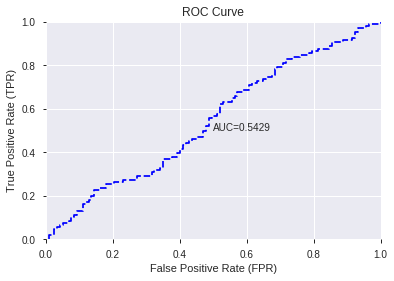

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


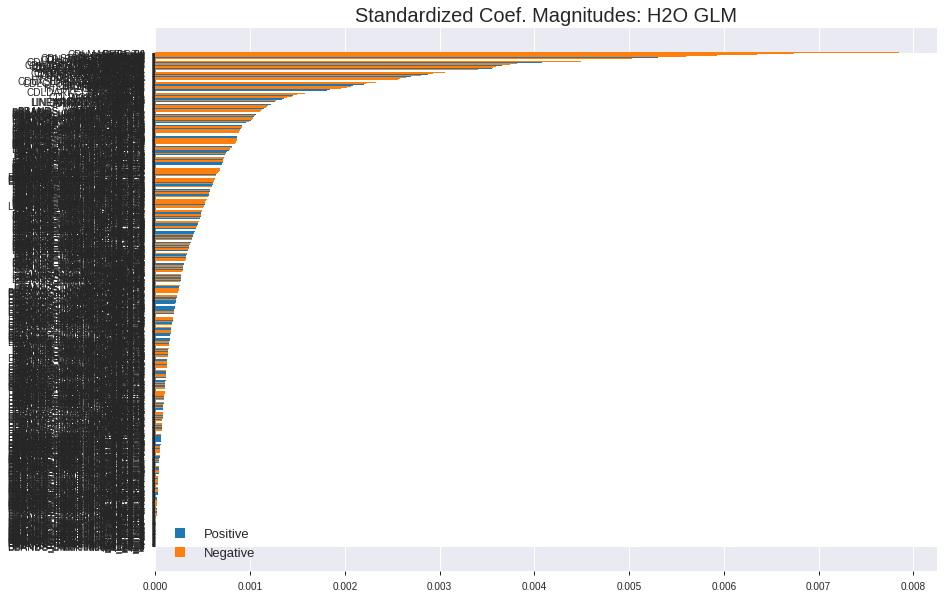

'log_likelihood'
--2019-08-25 18:04:38--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.166.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.166.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


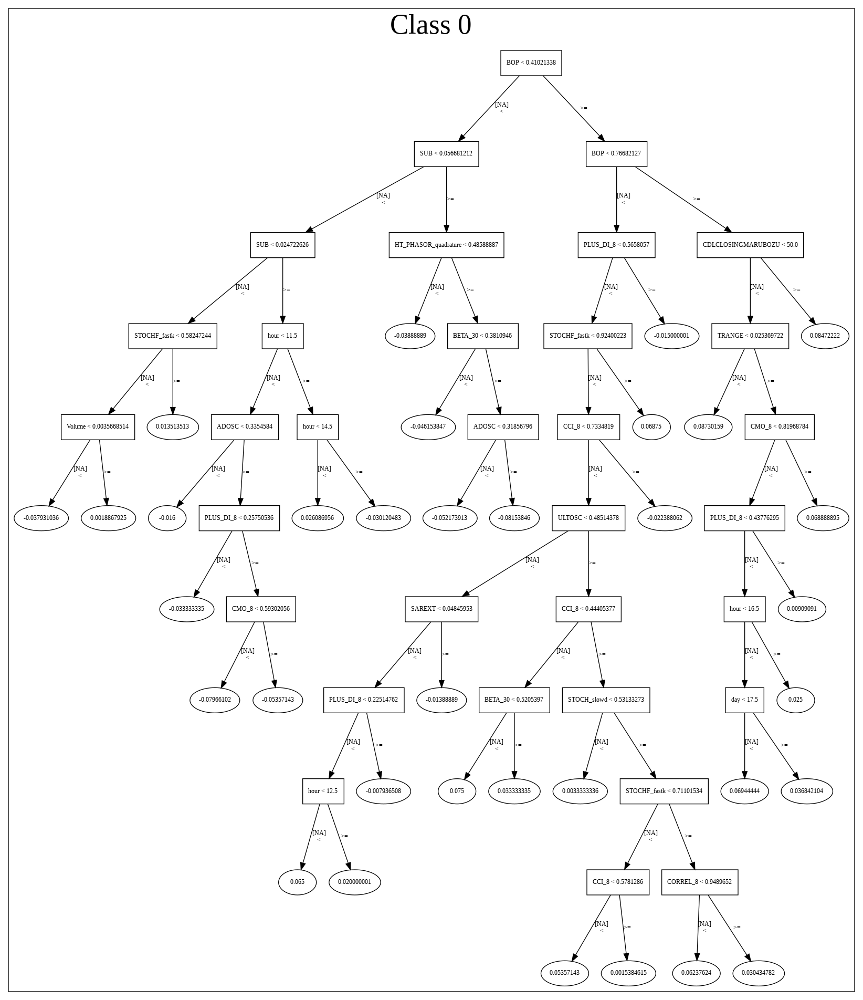

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_180408_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_180408_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_82_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_82_s

['BETA_30',
 'CDLMARUBOZU',
 'is_month_start',
 'ADXR_14',
 'is_month_end',
 'ADX_24',
 'CDLBELTHOLD',
 'ADXR_12',
 'ADX_20',
 'BETA_20',
 'CDLHIGHWAVE',
 'CDLSTICKSANDWICH',
 'BETA_24',
 'CDLSHOOTINGSTAR',
 'CDLLADDERBOTTOM',
 'CDLTHRUSTING',
 'CORREL_20',
 'HT_DCPERIOD',
 'CDLMORNINGDOJISTAR',
 'BETA_8',
 'CORREL_24',
 'CDLHARAMICROSS',
 'ADX_14',
 'CDLLONGLINE',
 'CDLGAPSIDESIDEWHITE',
 'CORREL_30',
 'CDLDOJISTAR',
 'SAREXT',
 'CDLIDENTICAL3CROWS',
 'STOCHRSI_fastk',
 'CDLGRAVESTONEDOJI',
 'BETA_12',
 'CDLSEPARATINGLINES',
 'CDL2CROWS',
 'CDLCOUNTERATTACK',
 'CDLTASUKIGAP',
 'aroondown_14',
 'CDLADVANCEBLOCK',
 'day',
 'CORREL_8',
 'CDLHOMINGPIGEON',
 'CDLEVENINGDOJISTAR',
 'CDLSTALLEDPATTERN',
 'ADX_12',
 'PLUS_DI_8',
 'days_in_month',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CORREL_12',
 'CDLHANGINGMAN',
 'CDLMORNINGSTAR',
 'BETA_14',
 'month',
 'CDL3INSIDE',
 'BOP',
 'MFI_14',
 'CDLHIKKAKE',
 'HT_PHASOR_quadrature',
 'STOCHRSI_fastd',
 'CDLXSIDEGAP3METHODS',
 'weekofyear',
 'week',
 

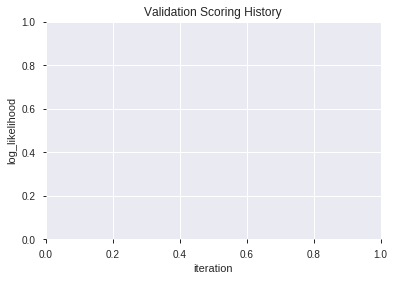

In [48]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190825_180444_model_6,0.542009,0.721403,0.483349,0.513406,0.263585
1,XGBoost_grid_1_AutoML_20190825_180444_model_4,0.516288,0.700754,0.454322,0.503690,0.253704
2,XGBoost_grid_1_AutoML_20190825_180444_model_1,0.508305,0.762852,0.470972,0.531010,0.281972
3,XGBoost_3_AutoML_20190825_180444,0.505402,0.762639,0.483349,0.531084,0.282050
4,XGBoost_grid_1_AutoML_20190825_180444_model_3,0.501371,0.717368,0.495726,0.511392,0.261522
5,XGBoost_grid_1_AutoML_20190825_180444_model_5,0.496291,0.746812,0.495726,0.524018,0.274595
6,XGBoost_2_AutoML_20190825_180444,0.494840,0.706328,0.475246,0.506407,0.256448
7,XGBoost_grid_1_AutoML_20190825_180444_model_7,0.490002,0.760713,0.491896,0.529957,0.280854
8,XGBoost_grid_1_AutoML_20190825_180444_model_2,0.485889,0.709173,0.500000,0.507724,0.257784
9,XGBoost_1_AutoML_20190825_180444,0.480003,0.723747,0.483793,0.514418,0.264626


,variable,relative_importance,scaled_importance,percentage
0,BETA_12,148.043854,1.000000,0.020040
1,HT_PHASOR_quadrature,124.223167,0.839097,0.016816
2,BETA_30,121.055222,0.817698,0.016387
3,BOP,112.165428,0.757650,0.015183
4,Volume,104.625092,0.706717,0.014163
5,MACDEXT_hist,101.993477,0.688941,0.013806
6,TRANGE,92.042984,0.621728,0.012459
7,MFI_14,83.385315,0.563247,0.011288
8,STOCHRSI_fastk,82.712257,0.558701,0.011196
9,DIV,81.570312,0.550987,0.011042


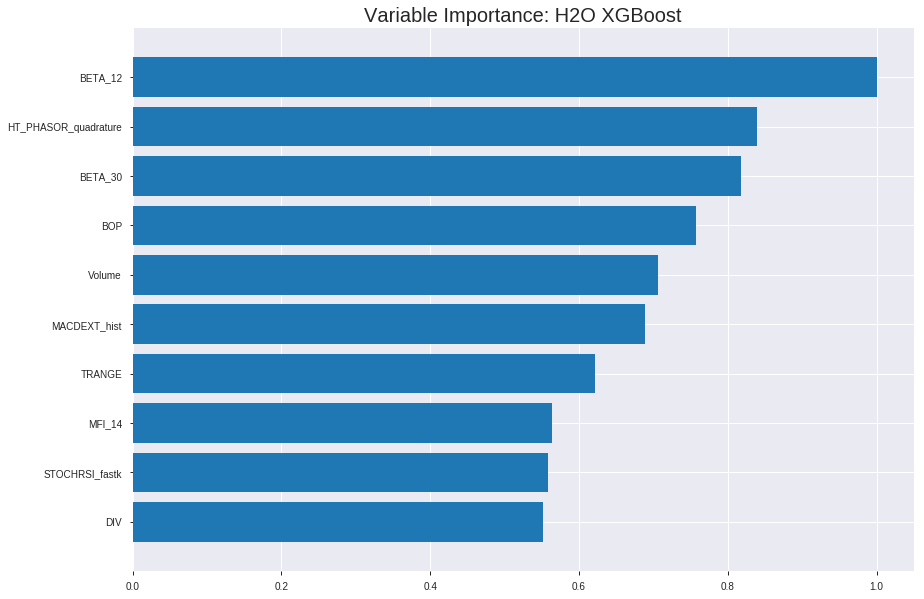

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190825_180444_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1665186485471859
RMSE: 0.40806696576320156
LogLoss: 0.5205086478763453
Mean Per-Class Error: 0.09896191483734462
AUC: 0.9609081592171382
pr_auc: 0.9594433590750743
Gini: 0.9218163184342765
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.501954197883606: 


,0,1,Error,Rate
0,664.0,96.0,0.1263,(96.0/760.0)
1,57.0,739.0,0.0716,(57.0/796.0)
Total,721.0,835.0,0.0983,(153.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5019542,0.9061925,211.0
max f2,0.4694198,0.9341723,237.0
max f0point5,0.5262511,0.9092119,188.0
max accuracy,0.5019542,0.9016710,211.0
max precision,0.8198610,1.0,0.0
max recall,0.3840101,1.0,308.0
max specificity,0.8198610,1.0,0.0
max absolute_mcc,0.5019542,0.8040223,211.0
max min_per_class_accuracy,0.5119127,0.8947368,200.0
max mean_per_class_accuracy,0.5019542,0.9010381,211.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.10 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.7651884,1.9547739,1.9547739,1.0,0.7817190,1.0,0.7817190,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.7419021,1.9547739,1.9547739,1.0,0.7547876,1.0,0.7682533,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.7276801,1.9547739,1.9547739,1.0,0.7335573,1.0,0.7571801,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.7146751,1.9547739,1.9547739,1.0,0.7195360,1.0,0.7476197,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.7072320,1.9547739,1.9547739,1.0,0.7111513,1.0,0.7406066,0.0188442,0.0979899,95.4773869,95.4773869
,6,0.1002571,0.6731639,1.9547739,1.9547739,1.0,0.6888123,1.0,0.7147095,0.0979899,0.1959799,95.4773869,95.4773869
,7,0.1503856,0.6500900,1.9046515,1.9380664,0.9743590,0.6634069,0.9914530,0.6976086,0.0954774,0.2914573,90.4651462,93.8066400
,8,0.2005141,0.6306587,1.9046515,1.9297127,0.9743590,0.6409139,0.9871795,0.6834349,0.0954774,0.3869347,90.4651462,92.9712666
,9,0.3001285,0.5920227,1.8412709,1.9003583,0.9419355,0.6116677,0.9721627,0.6596150,0.1834171,0.5703518,84.1270870,90.0358323
,10,0.4003856,0.5568042,1.7041618,1.8512305,0.8717949,0.5762392,0.9470305,0.6387376,0.1708543,0.7412060,70.4161835,85.1230470




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.26888851741389264
RMSE: 0.5185446146802536
LogLoss: 0.7354360565877798
Mean Per-Class Error: 0.47668608649917066
AUC: 0.49290973823684103
pr_auc: 0.49713684241409956
Gini: -0.014180523526317934
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2278393656015396: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.2278394,0.6834320,399.0
max f2,0.2278394,0.8436815,399.0
max f0point5,0.2278394,0.5743411,399.0
max accuracy,0.5195306,0.5258427,280.0
max precision,0.5925969,0.545,177.0
max recall,0.2278394,1.0,399.0
max specificity,0.8166655,0.9953271,0.0
max absolute_mcc,0.7922459,0.1107536,4.0
max min_per_class_accuracy,0.5778035,0.5108225,196.0
max mean_per_class_accuracy,0.5925969,0.5233139,177.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 56.83 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.7905507,0.0,0.0,0.0,0.8028483,0.0,0.8028483,0.0,0.0,-100.0,-100.0
,2,0.0202247,0.7641965,0.9632035,0.4280904,0.5,0.7809821,0.2222222,0.7931300,0.0086580,0.0086580,-3.6796537,-57.1909572
,3,0.0314607,0.7550241,1.1558442,0.6880025,0.6,0.7573612,0.3571429,0.7803554,0.0129870,0.0216450,15.5844156,-31.1997526
,4,0.0404494,0.7483929,1.4448052,0.8561809,0.75,0.7510814,0.4444444,0.7738501,0.0129870,0.0346320,44.4805195,-14.3819144
,5,0.0516854,0.7416553,0.0,0.6700546,0.0,0.7453318,0.3478261,0.7676504,0.0,0.0346320,-100.0,-32.9945417
,6,0.1011236,0.7009780,0.9632035,0.8133718,0.5,0.7226225,0.4222222,0.7456368,0.0476190,0.0822511,-3.6796537,-18.6628187
,7,0.1505618,0.6806950,1.0507674,0.8913226,0.5454545,0.6912109,0.4626866,0.7277656,0.0519481,0.1341991,5.0767414,-10.8677392
,8,0.2,0.6675380,0.8756395,0.8874459,0.4545455,0.6746475,0.4606742,0.7146353,0.0432900,0.1774892,-12.4360488,-11.2554113
,9,0.3011236,0.6317213,1.1558442,0.9775796,0.6,0.6503506,0.5074627,0.6930471,0.1168831,0.2943723,15.5844156,-2.2420366
,10,0.4,0.6048832,1.1821133,1.0281385,0.6136364,0.6171902,0.5337079,0.6742960,0.1168831,0.4112554,18.2113341,2.8138528



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 18:05:15,18.964 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4884319,0.5,0.6931472,0.5,0.0,1.0,0.4808989
,2019-08-25 18:05:16,19.442 sec,5.0,0.4886089,0.6705647,0.7645910,0.7641278,1.8397872,0.3168380,0.5009077,0.6949722,0.4879941,0.5092116,0.7705628,0.4808989
,2019-08-25 18:05:16,19.608 sec,10.0,0.4777606,0.6493811,0.8207278,0.8162974,1.9547739,0.2789203,0.5028109,0.6988555,0.4834830,0.5049568,0.7705628,0.4808989
,2019-08-25 18:05:16,19.772 sec,15.0,0.4674085,0.6295002,0.8655572,0.8687369,1.9547739,0.2152956,0.5055308,0.7045309,0.4788809,0.4915725,0.7705628,0.4808989
,2019-08-25 18:05:16,19.922 sec,20.0,0.4588250,0.6131592,0.8884207,0.8884082,1.9547739,0.1883033,0.5075481,0.7089188,0.4796294,0.4897534,0.3852814,0.4786517
,2019-08-25 18:05:16,20.066 sec,25.0,0.4520660,0.6004285,0.9019679,0.8998138,1.9547739,0.1831620,0.5110965,0.7167157,0.4734292,0.4850602,0.7705628,0.4786517
,2019-08-25 18:05:17,20.223 sec,30.0,0.4411648,0.5800553,0.9178483,0.9160925,1.9547739,0.1535990,0.5116493,0.7181009,0.4844742,0.4948468,0.7705628,0.4786517
,2019-08-25 18:05:17,20.383 sec,35.0,0.4312743,0.5620266,0.9372355,0.9370093,1.9547739,0.1388175,0.5124144,0.7200939,0.4856981,0.4907485,0.7705628,0.4786517
,2019-08-25 18:05:17,20.543 sec,40.0,0.4233603,0.5477850,0.9481123,0.9473170,1.9547739,0.1176093,0.5152700,0.7269643,0.4846664,0.4883411,0.3852814,0.4786517
,2019-08-25 18:05:17,20.708 sec,45.0,0.4156284,0.5340020,0.9565980,0.9552512,1.9547739,0.1015424,0.5175235,0.7326354,0.4919792,0.4963101,0.7705628,0.4786517


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BETA_12,148.0438538,1.0,0.0200401
HT_PHASOR_quadrature,124.2231674,0.8390971,0.0168156
BETA_30,121.0552216,0.8176984,0.0163868
BOP,112.1654282,0.7576500,0.0151834
Volume,104.6250916,0.7067169,0.0141627
---,---,---,---
BBANDS_upperband_12_1_5,3.3069305,0.0223375,0.0004476
BBANDS_lowerband_30_0_3,2.8420122,0.0191971,0.0003847
MA_8_6,2.8153975,0.0190173,0.0003811
BBANDS_upperband_14_7_3,2.6814528,0.0181126,0.0003630



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5739910313901345)

('F1', 0.65015479876161)

('auc', 0.542009353330108)

('logloss', 0.7214029013704011)

('mean_per_class_error', 0.441904531527173)

('rmse', 0.5134056706163341)

('mse', 0.2635853826210077)

xgboost prediction progress: |████████████████████████████████████████████| 100%


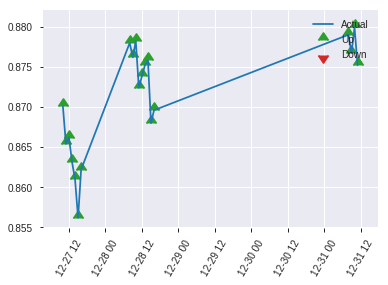


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2635853826210077
RMSE: 0.5134056706163341
LogLoss: 0.7214029013704011
Mean Per-Class Error: 0.441904531527173
AUC: 0.542009353330108
pr_auc: 0.5324361373607535
Gini: 0.08401870666021605
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4165300130844116: 


,0,1,Error,Rate
0,5.0,112.0,0.9573,(112.0/117.0)
1,1.0,105.0,0.0094,(1.0/106.0)
Total,6.0,217.0,0.5067,(113.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4165300,0.6501548,216.0
max f2,0.3102275,0.8191654,222.0
max f0point5,0.4591086,0.5414013,208.0
max accuracy,0.6708323,0.5739910,38.0
max precision,0.7802500,1.0,0.0
max recall,0.3102275,1.0,222.0
max specificity,0.7802500,1.0,0.0
max absolute_mcc,0.7125852,0.1877045,15.0
max min_per_class_accuracy,0.6042049,0.5283019,108.0
max mean_per_class_accuracy,0.6708323,0.5580955,38.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 59.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.7513419,1.4025157,1.4025157,0.6666667,0.7649814,0.6666667,0.7649814,0.0188679,0.0188679,40.2515723,40.2515723
,2,0.0224215,0.7297893,1.0518868,1.2622642,0.5,0.7356984,0.6,0.7532682,0.0094340,0.0283019,5.1886792,26.2264151
,3,0.0313901,0.7258506,2.1037736,1.5026954,1.0,0.7274919,0.7142857,0.7459036,0.0188679,0.0471698,110.3773585,50.2695418
,4,0.0403587,0.7196095,1.0518868,1.4025157,0.5,0.7234286,0.6666667,0.7409091,0.0094340,0.0566038,5.1886792,40.2515723
,5,0.0538117,0.7157402,2.1037736,1.5778302,1.0,0.7179234,0.75,0.7351627,0.0283019,0.0849057,110.3773585,57.7830189
,6,0.1031390,0.6925454,1.3387650,1.4634947,0.6363636,0.7028438,0.6956522,0.7197058,0.0660377,0.1509434,33.8765009,46.3494668
,7,0.1524664,0.6743202,0.9562607,1.2993896,0.4545455,0.6828442,0.6176471,0.7077800,0.0471698,0.1981132,-4.3739280,29.9389567
,8,0.2017937,0.6613487,0.9562607,1.2155136,0.4545455,0.6679881,0.5777778,0.6980531,0.0471698,0.2452830,-4.3739280,21.5513627
,9,0.3004484,0.6403180,0.6693825,1.0361870,0.3181818,0.6491444,0.4925373,0.6819935,0.0660377,0.3113208,-33.0617496,3.6186990
,10,0.3991031,0.6146471,1.2431389,1.0873437,0.5909091,0.6269567,0.5168539,0.6683889,0.1226415,0.4339623,24.3138937,8.7343651


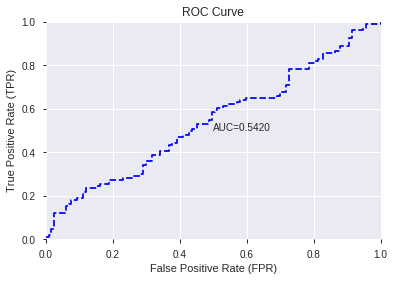

This function is available for GLM models only


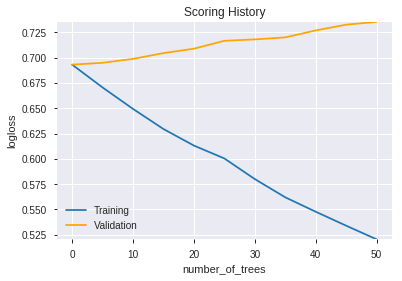

--2019-08-25 18:05:24--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.237.107
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.237.107|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

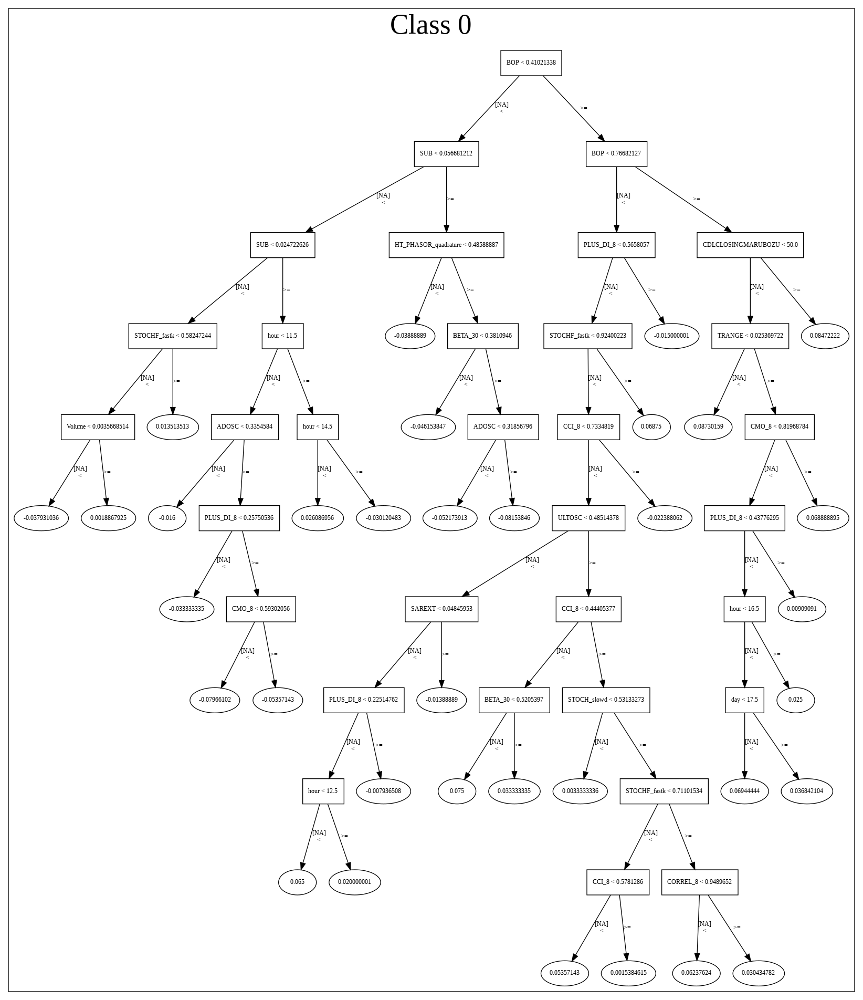

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190825_180444_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190825_180444_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_90_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['BETA_12',
 'HT_PHASOR_quadrature',
 'BETA_30',
 'BOP',
 'Volume',
 'MACDEXT_hist',
 'TRANGE',
 'MFI_14',
 'STOCHRSI_fastk',
 'DIV',
 'MFI_30',
 'BETA_24',
 'STOCHF_fastk',
 'hour',
 'CORREL_30',
 'DX_20',
 'STDDEV_14',
 'ADX_14',
 'CORREL_8',
 'DX_12',
 'BETA_14',
 'MFI_8',
 'CMO_8',
 'BETA_20',
 'PLUS_DI_30',
 'AD',
 'STOCHRSI_fastd',
 'MFI_12',
 'TRIX_8',
 'BETA_8',
 'HT_PHASOR_inphase',
 'LINEARREG_ANGLE_12',
 'WILLR_8',
 'STOCH_slowd',
 'AROONOSC_14',
 'PLUS_DI_14',
 'MFI_20',
 'DX_8',
 'aroonup_14',
 'PLUS_DI_8',
 'ADXR_12',
 'HT_DCPERIOD',
 'WILLR_14',
 'AROONOSC_24',
 'ULTOSC',
 'MACDEXT_signal',
 'PLUS_DM_14',
 'CORREL_20',
 'NATR_30',
 'DX_14',
 'STOCH_slowk',
 'LINEARREG_INTERCEPT_12',
 'CORREL_24',
 'MINUS_DM_14',
 'CCI_12',
 'MFI_24',
 'PLUS_DI_24',
 'DX_24',
 'CMO_20',
 'MACDFIX_hist_8',
 'MOM_20',
 'BBANDS_upperband_14_7_5',
 'AROONOSC_8',
 'LINEARREG_ANGLE_20',
 'ATR_8',
 'DX_30',
 'MINUS_DI_8',
 'aroondown_24',
 'ATR_20',
 'CMO_12',
 'ADX_12',
 'aroondown_14',
 'WILLR

In [49]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [50]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=5).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

802

['BBANDS_lowerband_8_6_2',
 'BBANDS_upperband_8_6_3',
 'BBANDS_middleband_8_6_3',
 'BBANDS_lowerband_8_6_3',
 'BBANDS_upperband_8_6_4',
 'BBANDS_middleband_8_6_4',
 'BBANDS_lowerband_8_6_4',
 'BBANDS_upperband_8_6_5',
 'BBANDS_middleband_8_6_5',
 'BBANDS_lowerband_8_6_5',
 'MA_8_7',
 'MAVP_8_7',
 'T3_8_7',
 'BBANDS_upperband_8_7_2',
 'BBANDS_middleband_8_7_2',
 'BBANDS_lowerband_8_7_2',
 'BBANDS_upperband_8_7_3',
 'BBANDS_middleband_8_7_3',
 'BBANDS_lowerband_8_7_3',
 'BBANDS_upperband_8_7_4',
 'BBANDS_middleband_8_7_4',
 'BBANDS_lowerband_8_7_4',
 'BBANDS_upperband_8_7_5',
 'BBANDS_middleband_8_7_5',
 'BBANDS_lowerband_8_7_5',
 'MA_8_8',
 'MAVP_8_8',
 'T3_8_8',
 'BBANDS_upperband_8_8_2',
 'BBANDS_middleband_8_8_2',
 'BBANDS_lowerband_8_8_2',
 'BBANDS_upperband_8_8_3',
 'BBANDS_middleband_8_8_3',
 'BBANDS_lowerband_8_8_3',
 'BBANDS_upperband_8_8_4',
 'BBANDS_middleband_8_8_4',
 'BBANDS_lowerband_8_8_4',
 'BBANDS_upperband_8_8_5',
 'BBANDS_middleband_8_8_5',
 'BBANDS_lowerband_8_8_5',
 

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20190825_180623_model_4,0.532575,0.804844,0.491453,0.535208,0.286447
1,DeepLearning_grid_1_AutoML_20190825_180623_model_9,0.500484,0.698656,0.487623,0.502741,0.252749
2,DeepLearning_grid_1_AutoML_20190825_180623_model_7,0.500000,0.719497,0.500000,0.512411,0.262565
3,DeepLearning_grid_1_AutoML_20190825_180623_model_5,0.500000,0.695040,0.500000,0.500945,0.250946
4,DeepLearning_grid_1_AutoML_20190825_180623_model_6,0.500000,0.693351,0.500000,0.500102,0.250102
5,DeepLearning_grid_1_AutoML_20190825_180623_model_8,0.500000,0.695458,0.500000,0.501153,0.251155
6,DeepLearning_grid_1_AutoML_20190825_180623_model_2,0.491614,1.759626,0.500000,0.642891,0.413309
7,DeepLearning_grid_1_AutoML_20190825_180623_model_1,0.489115,13.356625,0.479076,0.682389,0.465655
8,DeepLearning_grid_1_AutoML_20190825_180623_model_3,0.461861,1.594203,0.491453,0.653329,0.426838
9,DeepLearning_1_AutoML_20190825_180623,0.451379,0.812843,0.487179,0.547941,0.300240


,variable,relative_importance,scaled_importance,percentage
0,CDLIDENTICAL3CROWS,1.000000,1.000000,0.003191
1,CDLTASUKIGAP,0.999116,0.999116,0.003188
2,CDLCOUNTERATTACK,0.986214,0.986214,0.003147
3,CDLMORNINGDOJISTAR,0.985673,0.985673,0.003145
4,CDLHOMINGPIGEON,0.959558,0.959558,0.003062
5,CDLGAPSIDESIDEWHITE,0.958335,0.958335,0.003058
6,CDL2CROWS,0.956742,0.956742,0.003053
7,CDLINNECK,0.950689,0.950689,0.003034
8,CDLSTICKSANDWICH,0.939414,0.939414,0.002998
9,CDLLADDERBOTTOM,0.939117,0.939117,0.002997


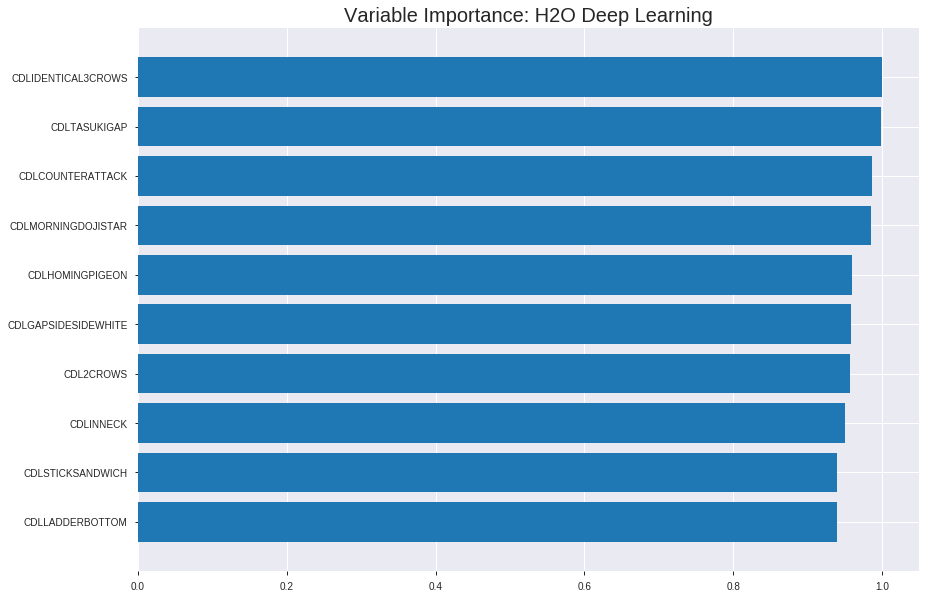

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20190825_180623_model_4


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.16763296622904955
RMSE: 0.40943005047144443
LogLoss: 0.5052675247573652
Mean Per-Class Error: 0.2307425284316318
AUC: 0.8577410076699286
pr_auc: 0.8516988379110049
Gini: 0.7154820153398571
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5544712286667224: 


,0,1,Error,Rate
0,495.0,265.0,0.3487,(265.0/760.0)
1,105.0,691.0,0.1319,(105.0/796.0)
Total,600.0,956.0,0.2378,(370.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5544712,0.7888128,206.0
max f2,0.3242203,0.8769932,283.0
max f0point5,0.8172630,0.7886126,98.0
max accuracy,0.7008819,0.7686375,146.0
max precision,0.9996789,1.0,0.0
max recall,0.0543628,1.0,378.0
max specificity,0.9996789,1.0,0.0
max absolute_mcc,0.7008819,0.5388268,146.0
max min_per_class_accuracy,0.6739429,0.7625628,156.0
max mean_per_class_accuracy,0.7008819,0.7692575,146.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 61.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.9986381,1.9547739,1.9547739,1.0,0.9994072,1.0,0.9994072,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.9978329,1.9547739,1.9547739,1.0,0.9981972,1.0,0.9988022,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.9970023,1.9547739,1.9547739,1.0,0.9974588,1.0,0.9983735,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.9957637,1.9547739,1.9547739,1.0,0.9964850,1.0,0.9978938,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.9937114,1.6941374,1.9046515,0.8666667,0.9949367,0.9743590,0.9973252,0.0163317,0.0954774,69.4137353,90.4651462
,6,0.1002571,0.9843577,1.8795903,1.8921209,0.9615385,0.9898297,0.9679487,0.9935774,0.0942211,0.1896985,87.9590259,89.2120861
,7,0.1503856,0.9666559,1.9046515,1.8962977,0.9743590,0.9764983,0.9700855,0.9878844,0.0954774,0.2851759,90.4651462,89.6297728
,8,0.2005141,0.9397360,1.6039170,1.8232026,0.8205128,0.9526785,0.9326923,0.9790829,0.0804020,0.3655779,60.3917021,82.3202551
,9,0.3001285,0.8763639,1.5259848,1.7245542,0.7806452,0.9086851,0.8822270,0.9557175,0.1520101,0.5175879,52.5984763,72.4554249
,10,0.4003856,0.7792081,1.3157132,1.6221799,0.6730769,0.8280774,0.8298555,0.9237562,0.1319095,0.6494975,31.5713181,62.2179920




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.31760660953037534
RMSE: 0.5635659762001033
LogLoss: 0.9074922734748102
Mean Per-Class Error: 0.4811769227657078
AUC: 0.4784662378120322
pr_auc: 0.5086401348131789
Gini: -0.04306752437593564
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.04175980920430191: 


,0,1,Error,Rate
0,2.0,212.0,0.9907,(212.0/214.0)
1,1.0,230.0,0.0043,(1.0/231.0)
Total,3.0,442.0,0.4787,(213.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0417598,0.6835067,396.0
max f2,0.0114694,0.8436815,399.0
max f0point5,0.0417598,0.5752876,396.0
max accuracy,0.0417598,0.5213483,396.0
max precision,0.8197938,0.5806452,57.0
max recall,0.0114694,1.0,399.0
max specificity,0.9930229,0.9953271,0.0
max absolute_mcc,0.5362499,0.0753677,176.0
max min_per_class_accuracy,0.5058039,0.4761905,196.0
max mean_per_class_accuracy,0.8074025,0.5188231,64.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 51.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.9806083,0.3852814,0.3852814,0.2,0.9863890,0.2,0.9863890,0.0043290,0.0043290,-61.4718615,-61.4718615
,2,0.0202247,0.9689115,0.9632035,0.6421356,0.5,0.9791359,0.3333333,0.9831654,0.0086580,0.0129870,-3.6796537,-35.7864358
,3,0.0314607,0.9578004,1.5411255,0.9632035,0.8,0.9626484,0.5,0.9758379,0.0173160,0.0303030,54.1125541,-3.6796537
,4,0.0404494,0.9474969,0.9632035,0.9632035,0.5,0.9517330,0.5,0.9704813,0.0086580,0.0389610,-3.6796537,-3.6796537
,5,0.0516854,0.9288453,1.1558442,1.0050819,0.6,0.9400119,0.5217391,0.9638575,0.0129870,0.0519481,15.5844156,0.5081875
,6,0.1011236,0.8599384,1.0507674,1.0274170,0.5454545,0.8891374,0.5333333,0.9273277,0.0519481,0.1038961,5.0767414,2.7417027
,7,0.1505618,0.8133639,1.2258953,1.0925890,0.6363636,0.8328103,0.5671642,0.8962921,0.0606061,0.1645022,22.5895317,9.2589003
,8,0.2,0.7573639,0.7880756,1.0173160,0.4090909,0.7810484,0.5280899,0.8678049,0.0389610,0.2034632,-21.1924439,1.7316017
,9,0.3011236,0.6512465,0.9846080,1.0063320,0.5111111,0.7011872,0.5223881,0.8118512,0.0995671,0.3030303,-1.5392015,0.6331976
,10,0.4,0.5716632,0.7005116,0.9307359,0.3636364,0.6133559,0.4831461,0.7627850,0.0692641,0.3722944,-29.9488390,-6.9264069



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 18:11:51,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-08-25 18:11:56,6.812 sec,171 obs/sec,0.5115681,1,796.0,0.6734541,4.0085216,-0.8151332,0.5088849,0.3532275,0.9773869,0.4839332,0.6876787,7.0298805,-0.8943728,0.5057551,0.3565398,0.8256030,0.4786517
,2019-08-25 18:12:19,30.572 sec,184 obs/sec,3.1304627,6,4871.0,0.6274700,2.7824030,-0.5757180,0.5376620,0.4129324,1.0995603,0.4627249,0.6830842,8.6641980,-0.8691437,0.4720941,0.2296968,0.7005116,0.4764045
,2019-08-25 18:12:41,51.780 sec,195 obs/sec,5.7339332,11,8922.0,0.5766726,1.1217374,-0.3309174,0.6171606,0.5923567,0.8552136,0.4447301,0.5916895,1.1594892,-0.4024326,0.5392948,0.5561111,1.5411255,0.4808989
,2019-08-25 18:13:00,1 min 11.735 sec,204 obs/sec,8.3483290,16,12990.0,0.5350022,1.1244997,-0.1455225,0.6351602,0.6283438,1.2217337,0.4884319,0.6570232,4.3347250,-0.7292414,0.5233544,0.5453018,0.7705628,0.4808989
,2019-08-25 18:13:23,1 min 33.825 sec,213 obs/sec,11.5057841,22,17903.0,0.5248281,0.9361056,-0.1023684,0.6751074,0.6841085,1.9547739,0.4492288,0.6697884,1.9929892,-0.7970886,0.4785775,0.4953989,0.7705628,0.4786517
,2019-08-25 18:13:44,1 min 54.919 sec,221 obs/sec,14.6253213,28,22757.0,0.5524065,1.0711806,-0.2212654,0.6882695,0.6536420,1.5882538,0.3894602,0.6612152,1.9421882,-0.7513783,0.5226261,0.5477959,1.5411255,0.4808989
,2019-08-25 18:14:07,2 min 17.957 sec,229 obs/sec,18.2532134,35,28402.0,0.5041035,0.8414399,-0.0170257,0.7175565,0.6952061,1.9547739,0.3946015,0.5876551,1.0889569,-0.3833729,0.5290488,0.5493076,0.7705628,0.4808989
,2019-08-25 18:14:27,2 min 38.515 sec,233 obs/sec,21.3502571,41,33221.0,0.4462467,0.5839233,0.2030288,0.8144472,0.8189982,1.8326005,0.3001285,0.5957813,1.2170609,-0.4218964,0.5492576,0.5792954,1.9264069,0.4741573
,2019-08-25 18:14:50,3 min 0.729 sec,238 obs/sec,24.9640103,48,38844.0,0.4094301,0.5052675,0.3291090,0.8577410,0.8516988,1.9547739,0.2377892,0.5635660,0.9074923,-0.2722832,0.4784662,0.5086401,0.3852814,0.4786517


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLIDENTICAL3CROWS,1.0,1.0,0.0031909
CDLTASUKIGAP,0.9991155,0.9991155,0.0031881
CDLCOUNTERATTACK,0.9862143,0.9862143,0.0031469
CDLMORNINGDOJISTAR,0.9856727,0.9856727,0.0031452
CDLHOMINGPIGEON,0.9595584,0.9595584,0.0030618
---,---,---,---
BBANDS_lowerband_12_2_5,0.3422751,0.3422751,0.0010922
BBANDS_middleband_14_2_4,0.3421299,0.3421299,0.0010917
MAVP_20_1,0.3418308,0.3418308,0.0010907
BBANDS_lowerband_20_6_2,0.3416528,0.3416528,0.0010902



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5515695067264574)

('F1', 0.6483180428134556)

('auc', 0.5325753910659571)

('logloss', 0.8048438282548634)

('mean_per_class_error', 0.4469843573617158)

('rmse', 0.5352077513870821)

('mse', 0.2864473371448166)

deeplearning prediction progress: |███████████████████████████████████████| 100%


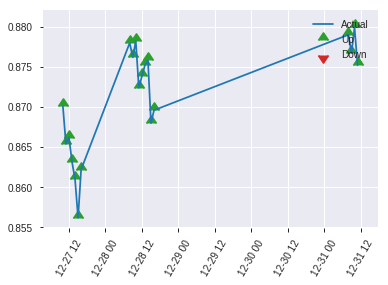


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.2864473371448166
RMSE: 0.5352077513870821
LogLoss: 0.8048438282548634
Mean Per-Class Error: 0.4469843573617158
AUC: 0.5325753910659571
pr_auc: 0.4908421186457667
Gini: 0.06515078213191416
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.047418265736702964: 


,0,1,Error,Rate
0,2.0,115.0,0.9829,(115.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,2.0,221.0,0.5157,(115.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.0474183,0.6483180,220.0
max f2,0.0474183,0.8217054,220.0
max f0point5,0.2824405,0.5487805,157.0
max accuracy,0.5818599,0.5515695,39.0
max precision,0.5818599,0.575,39.0
max recall,0.0474183,1.0,220.0
max specificity,0.9763136,0.9914530,0.0
max absolute_mcc,0.2824405,0.1165184,157.0
max min_per_class_accuracy,0.3799912,0.5188679,110.0
max mean_per_class_accuracy,0.2824405,0.5530156,157.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 40.25 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.9285455,0.7012579,0.7012579,0.3333333,0.9563392,0.3333333,0.9563392,0.0094340,0.0094340,-29.8742138,-29.8742138
,2,0.0224215,0.8521088,1.0518868,0.8415094,0.5,0.8727429,0.4,0.9229007,0.0094340,0.0188679,5.1886792,-15.8490566
,3,0.0313901,0.8213939,0.0,0.6010782,0.0,0.8317014,0.2857143,0.8968438,0.0,0.0188679,-100.0,-39.8921833
,4,0.0403587,0.7922050,2.1037736,0.9350105,1.0,0.8106076,0.4444444,0.8776802,0.0188679,0.0377358,110.3773585,-6.4989518
,5,0.0538117,0.7728898,1.4025157,1.0518868,0.6666667,0.7828875,0.5,0.8539820,0.0188679,0.0566038,40.2515723,5.1886792
,6,0.1031390,0.6906104,0.9562607,1.0061526,0.4545455,0.7305360,0.4782609,0.7949426,0.0471698,0.1037736,-4.3739280,0.6152584
,7,0.1524664,0.6275743,1.3387650,1.1137625,0.6363636,0.6574015,0.5294118,0.7504440,0.0660377,0.1698113,33.8765009,11.3762486
,8,0.2017937,0.5703418,1.3387650,1.1687631,0.6363636,0.5921988,0.5555556,0.7117619,0.0660377,0.2358491,33.8765009,16.8763103
,9,0.3004484,0.5052112,0.8606346,1.0675866,0.4090909,0.5386241,0.5074627,0.6549107,0.0849057,0.3207547,-13.9365352,6.7586595
,10,0.3991031,0.4427491,0.7650086,0.9927920,0.3636364,0.4788080,0.4719101,0.6113797,0.0754717,0.3962264,-23.4991424,-0.7207971


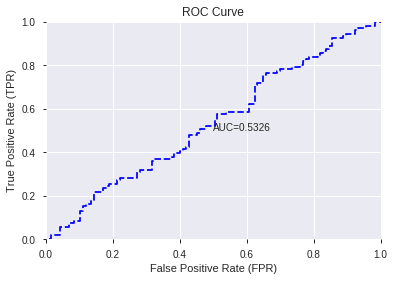

This function is available for GLM models only


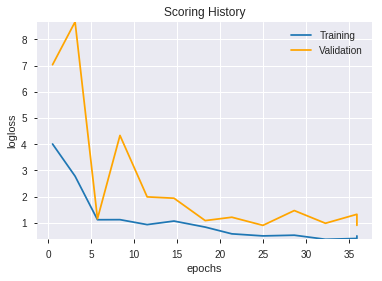

--2019-08-25 18:30:47--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.98.155
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.98.155|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


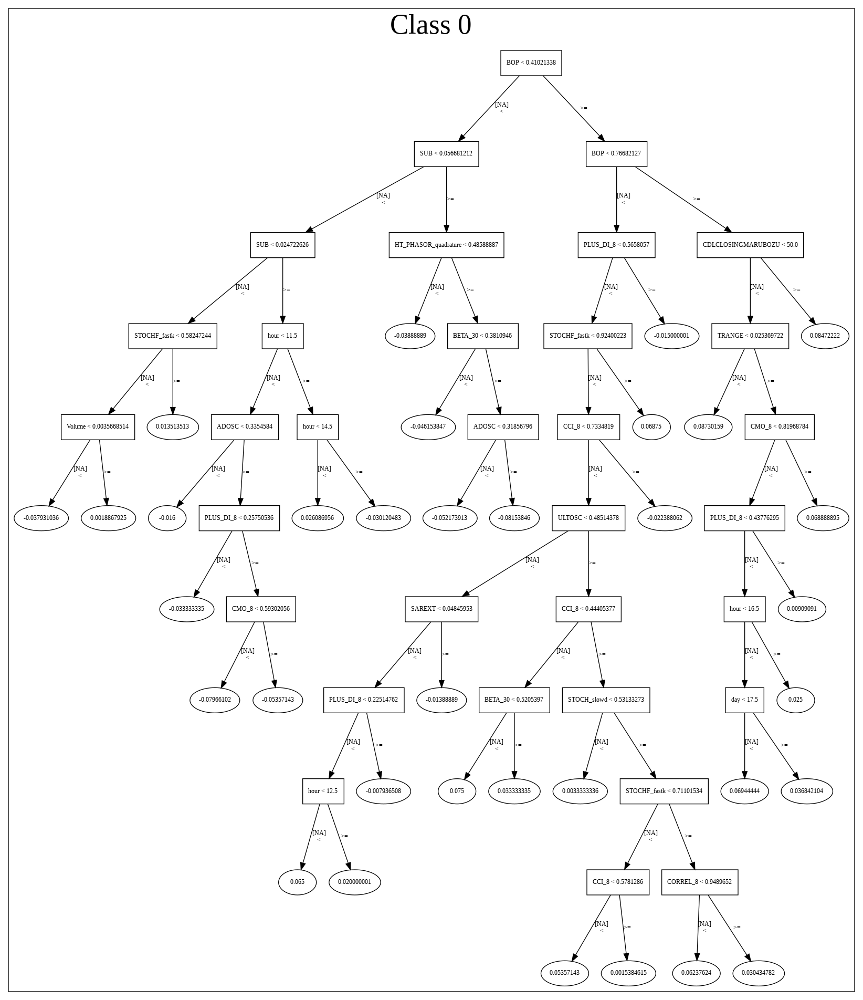

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20190825_180623_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20190825_180623_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_98_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLIDENTICAL3CROWS',
 'CDLTASUKIGAP',
 'CDLCOUNTERATTACK',
 'CDLMORNINGDOJISTAR',
 'CDLHOMINGPIGEON',
 'CDLGAPSIDESIDEWHITE',
 'CDL2CROWS',
 'CDLINNECK',
 'CDLSTICKSANDWICH',
 'CDLLADDERBOTTOM',
 'CDLEVENINGDOJISTAR',
 'CDLONNECK',
 'CDLHIKKAKEMOD',
 'CDLDARKCLOUDCOVER',
 'CDLMORNINGSTAR',
 'CDLTHRUSTING',
 'CDLSTALLEDPATTERN',
 'CDLEVENINGSTAR',
 'CDLSEPARATINGLINES',
 'CDLXSIDEGAP3METHODS',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'CDLMATCHINGLOW',
 'CDLADVANCEBLOCK',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLHARAMICROSS',
 'CDLHANGINGMAN',
 'CDLDOJISTAR',
 'BOP',
 'CDLHAMMER',
 'CDL3INSIDE',
 'BETA_30',
 'HT_PHASOR_quadrature',
 'BETA_20',
 'aroonup_8',
 'BETA_24',
 'HT_TRENDMODE',
 'CDLSHORTLINE',
 'DIV',
 'BETA_8',
 'STOCHRSI_fastk',
 'CDLLONGLEGGEDDOJI',
 'SUB',
 'CDLHIGHWAVE',
 'CDLRICKSHAWMAN',
 'aroondown_8',
 'HT_PHASOR_inphase',
 'TRANGE',
 'CORREL_24',
 'CORREL_20',
 'BETA_12',
 'CDLDOJI',
 'CDLCLOSINGMARUBOZU',
 'STOCHRSI_fastd',
 'aroonup_30',
 'HT

In [51]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20190825_183057_model_1,0.538462,0.718273,0.491453,0.512152,0.2623


,variable,relative_importance,scaled_importance,percentage
0,BETA_30,7.901221e-03,1.000000,1.508407e-02
1,CDLMARUBOZU,6.761695e-03,0.855779,1.290862e-02
2,ADXR_14,6.421971e-03,0.812782,1.226006e-02
3,ADX_24,5.923255e-03,0.749663,1.130797e-02
4,CDLBELTHOLD,5.916343e-03,0.748788,1.129478e-02
5,ADXR_12,5.825182e-03,0.737251,1.112074e-02
6,ADX_20,5.627248e-03,0.712200,1.074287e-02
7,BETA_20,5.418195e-03,0.685742,1.034377e-02
8,CDLHIGHWAVE,5.307470e-03,0.671728,1.013239e-02
9,BETA_24,5.100118e-03,0.645485,9.736539e-03


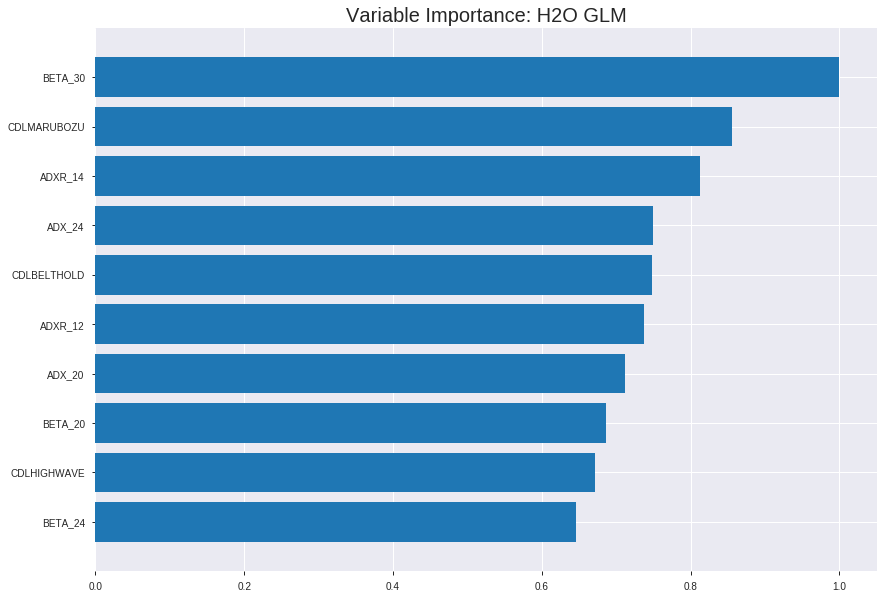

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20190825_183057_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.24731581766479044
RMSE: 0.4973085738902864
LogLoss: 0.6877656691640821
Null degrees of freedom: 1555
Residual degrees of freedom: 757
Null deviance: 2156.2410466952756
Residual deviance: 2140.3267624386235
AIC: 3738.3267624386235
AUC: 0.5769959997355196
pr_auc: 0.5823918188900461
Gini: 0.15399199947103925
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4212463188860792: 


,0,1,Error,Rate
0,1.0,759.0,0.9987,(759.0/760.0)
1,0.0,796.0,0.0,(0.0/796.0)
Total,1.0,1555.0,0.4878,(759.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4212463,0.6771587,398.0
max f2,0.4212463,0.8398396,398.0
max f0point5,0.5007527,0.5856375,255.0
max accuracy,0.5040970,0.5661954,238.0
max precision,0.5904320,1.0,0.0
max recall,0.4212463,1.0,398.0
max specificity,0.5904320,1.0,0.0
max absolute_mcc,0.5040970,0.1316327,238.0
max min_per_class_accuracy,0.5121734,0.5402010,197.0
max mean_per_class_accuracy,0.5040970,0.5627050,238.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 51.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.5621428,1.5882538,1.5882538,0.8125,0.5748060,0.8125,0.5748060,0.0163317,0.0163317,58.8253769,58.8253769
,2,0.0205656,0.5553235,1.0995603,1.3439070,0.5625,0.5584482,0.6875,0.5666271,0.0113065,0.0276382,9.9560302,34.3907035
,3,0.0302057,0.5523496,1.3031826,1.3309099,0.6666667,0.5539451,0.6808511,0.5625797,0.0125628,0.0402010,30.3182580,33.0909868
,4,0.0404884,0.5496550,1.0995603,1.2721544,0.5625,0.5510594,0.6507937,0.5596539,0.0113065,0.0515075,9.9560302,27.2154423
,5,0.0501285,0.5463766,1.3031826,1.2781214,0.6666667,0.5481834,0.6538462,0.5574480,0.0125628,0.0640704,30.3182580,27.8121376
,6,0.1002571,0.5390221,1.2781214,1.2781214,0.6538462,0.5424682,0.6538462,0.5499581,0.0640704,0.1281407,27.8121376,27.8121376
,7,0.1503856,0.5339230,1.2279990,1.2614139,0.6282051,0.5360072,0.6452991,0.5453078,0.0615578,0.1896985,22.7998969,26.1413907
,8,0.2005141,0.5296608,1.1026930,1.2217337,0.5641026,0.5317909,0.625,0.5419286,0.0552764,0.2449749,10.2692952,22.1733668
,9,0.3001285,0.5229245,1.0593613,1.1678413,0.5419355,0.5262725,0.5974304,0.5367322,0.1055276,0.3505025,5.9361323,16.7841348
,10,0.4003856,0.5170254,0.9272645,1.1076006,0.4743590,0.5197234,0.5666132,0.5324732,0.0929648,0.4434673,-7.2735472,10.7600603




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.2541121361672338
RMSE: 0.5040953641596339
LogLoss: 0.7014818159412011
Null degrees of freedom: 444
Residual degrees of freedom: -354
Null deviance: 616.3524839130139
Residual deviance: 624.318816187669
AIC: 2222.3188161876687
AUC: 0.4599668244528058
pr_auc: 0.4877356533638473
Gini: -0.08006635109438842
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44405096019187446: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4440510,0.6834320,399.0
max f2,0.4440510,0.8436815,399.0
max f0point5,0.4660364,0.5762274,381.0
max accuracy,0.4682438,0.5258427,377.0
max precision,0.5905755,0.5714286,20.0
max recall,0.4440510,1.0,399.0
max specificity,0.6365766,0.9953271,0.0
max absolute_mcc,0.5607775,0.1036840,114.0
max min_per_class_accuracy,0.5347418,0.4675325,194.0
max mean_per_class_accuracy,0.4682438,0.5087288,377.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 53.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.6164701,0.3852814,0.3852814,0.2,0.6245070,0.2,0.6245070,0.0043290,0.0043290,-61.4718615,-61.4718615
,2,0.0202247,0.6068714,0.9632035,0.6421356,0.5,0.6118435,0.3333333,0.6188788,0.0086580,0.0129870,-3.6796537,-35.7864358
,3,0.0314607,0.6007817,1.5411255,0.9632035,0.8,0.6046995,0.5,0.6138147,0.0173160,0.0303030,54.1125541,-3.6796537
,4,0.0404494,0.5923085,0.9632035,0.9632035,0.5,0.5947144,0.5,0.6095702,0.0086580,0.0389610,-3.6796537,-3.6796537
,5,0.0516854,0.5885576,1.5411255,1.0888387,0.8,0.5901801,0.5652174,0.6053550,0.0173160,0.0562771,54.1125541,8.8838698
,6,0.1011236,0.5819608,0.7880756,0.9417989,0.4090909,0.5849489,0.4888889,0.5953787,0.0389610,0.0952381,-21.1924439,-5.8201058
,7,0.1505618,0.5778421,0.8756395,0.9200749,0.4545455,0.5793690,0.4776119,0.5901218,0.0432900,0.1385281,-12.4360488,-7.9925050
,8,0.2,0.5736781,0.7005116,0.8658009,0.3636364,0.5757084,0.4494382,0.5865589,0.0346320,0.1731602,-29.9488390,-13.4199134
,9,0.3011236,0.5593624,0.8561809,0.8625703,0.4444444,0.5661832,0.4477612,0.5797163,0.0865801,0.2597403,-14.3819144,-13.7429734
,10,0.4,0.5450501,1.1383314,0.9307359,0.5909091,0.5525395,0.4831461,0.5729985,0.1125541,0.3722944,13.8331366,-6.9264069



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-08-25 18:30:59,0.000 sec,2,.34E1,799,1.3755313,1.4029636
,2019-08-25 18:31:00,1.082 sec,4,.25E1,800,1.3732053,1.4071493
,2019-08-25 18:31:01,2.164 sec,6,.18E1,800,1.3704014,1.4122773
,2019-08-25 18:31:02,3.280 sec,8,.13E1,800,1.3671011,1.4187828
,2019-08-25 18:31:03,4.354 sec,10,.96E0,800,1.3632967,1.4267733


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5515695067264574)

('F1', 0.6483180428134556)

('auc', 0.5384615384615384)

('logloss', 0.7182734373044767)

('mean_per_class_error', 0.44021125624899216)

('rmse', 0.5121524728792298)

('mse', 0.2623001554763102)

glm prediction progress: |████████████████████████████████████████████████| 100%


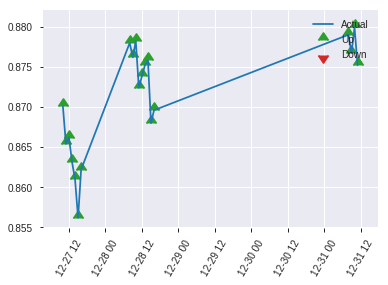


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.2623001554763102
RMSE: 0.5121524728792298
LogLoss: 0.7182734373044767
Null degrees of freedom: 222
Residual degrees of freedom: -576
Null deviance: 309.77213152668094
Residual deviance: 320.3499530377966
AIC: 1918.3499530377967
AUC: 0.5384615384615384
pr_auc: 0.49960463071725747
Gini: 0.07692307692307687
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5284924181634386: 


,0,1,Error,Rate
0,2.0,115.0,0.9829,(115.0/117.0)
1,0.0,106.0,0.0,(0.0/106.0)
Total,2.0,221.0,0.5157,(115.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5284924,0.6483180,220.0
max f2,0.5284924,0.8217054,220.0
max f0point5,0.5856867,0.5515759,147.0
max accuracy,0.6189691,0.5515695,39.0
max precision,0.6328949,0.6153846,12.0
max recall,0.5284924,1.0,220.0
max specificity,0.6704942,0.9914530,0.0
max absolute_mcc,0.5856867,0.1263961,147.0
max min_per_class_accuracy,0.5989628,0.5094340,108.0
max mean_per_class_accuracy,0.5856867,0.5597887,147.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 59.44 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.6483569,0.7012579,0.7012579,0.3333333,0.6574978,0.3333333,0.6574978,0.0094340,0.0094340,-29.8742138,-29.8742138
,2,0.0224215,0.6410929,1.0518868,0.8415094,0.5,0.6459980,0.4,0.6528979,0.0094340,0.0188679,5.1886792,-15.8490566
,3,0.0313901,0.6356743,2.1037736,1.2021563,1.0,0.6368469,0.5714286,0.6483119,0.0188679,0.0377358,110.3773585,20.2156334
,4,0.0403587,0.6339101,1.0518868,1.1687631,0.5,0.6349140,0.5555556,0.6453346,0.0094340,0.0471698,5.1886792,16.8763103
,5,0.0538117,0.6335965,1.4025157,1.2272013,0.6666667,0.6337350,0.5833333,0.6424347,0.0188679,0.0660377,40.2515723,22.7201258
,6,0.1031390,0.6264784,1.1475129,1.1890894,0.5454545,0.6290284,0.5652174,0.6360229,0.0566038,0.1226415,14.7512864,18.9089418
,7,0.1524664,0.6208453,0.9562607,1.1137625,0.4545455,0.6242140,0.5294118,0.6322024,0.0471698,0.1698113,-4.3739280,11.3762486
,8,0.2017937,0.6178881,0.9562607,1.0752621,0.4545455,0.6192566,0.5111111,0.6290379,0.0471698,0.2169811,-4.3739280,7.5262055
,9,0.3004484,0.6092945,0.8606346,1.0047874,0.4090909,0.6138455,0.4776119,0.6240493,0.0849057,0.3018868,-13.9365352,0.4787384
,10,0.3991031,0.6041998,0.9562607,0.9927920,0.4545455,0.6061125,0.4719101,0.6196155,0.0943396,0.3962264,-4.3739280,-0.7207971


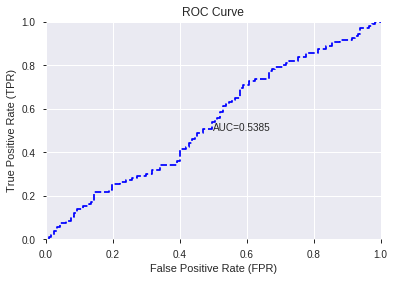

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


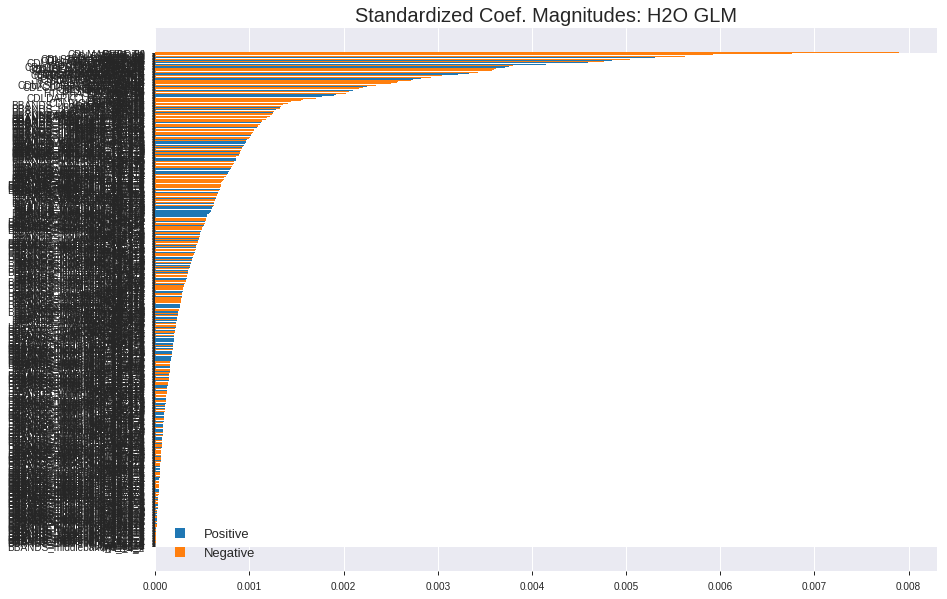

'log_likelihood'
--2019-08-25 18:31:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 54.231.114.130
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|54.231.114.130|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


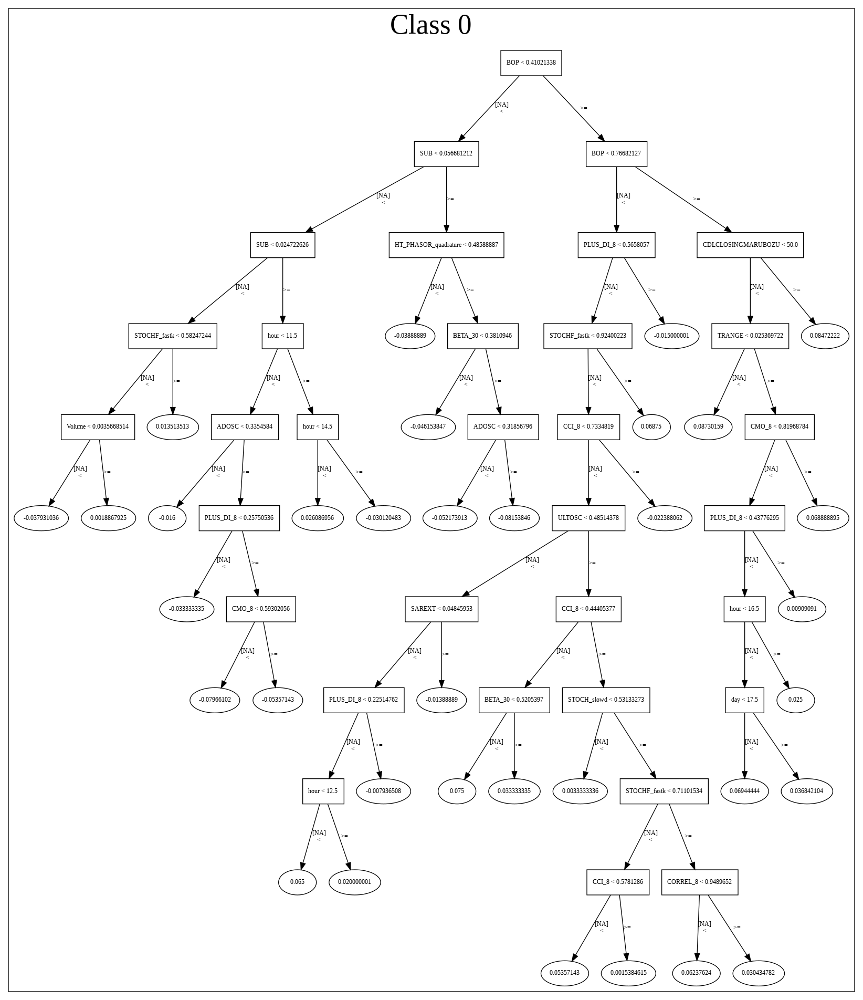

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20190825_183057_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20190825_183057_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_106_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_106

['BETA_30',
 'CDLMARUBOZU',
 'ADXR_14',
 'ADX_24',
 'CDLBELTHOLD',
 'ADXR_12',
 'ADX_20',
 'BETA_20',
 'CDLHIGHWAVE',
 'BETA_24',
 'CDLSTICKSANDWICH',
 'CDLSHOOTINGSTAR',
 'CDLLADDERBOTTOM',
 'CDLTHRUSTING',
 'CORREL_20',
 'HT_DCPERIOD',
 'CDLMORNINGDOJISTAR',
 'BETA_8',
 'CORREL_24',
 'CDLHARAMICROSS',
 'ADX_14',
 'CDLLONGLINE',
 'CDLGAPSIDESIDEWHITE',
 'CORREL_30',
 'CDLDOJISTAR',
 'CDLIDENTICAL3CROWS',
 'CDLGRAVESTONEDOJI',
 'BETA_12',
 'STOCHRSI_fastk',
 'CDLSEPARATINGLINES',
 'CDL2CROWS',
 'CORREL_8',
 'CDLTASUKIGAP',
 'CDLCOUNTERATTACK',
 'CDLADVANCEBLOCK',
 'CDLHOMINGPIGEON',
 'CDLEVENINGDOJISTAR',
 'CDLSTALLEDPATTERN',
 'ADX_12',
 'PLUS_DI_8',
 'CORREL_12',
 'CDLTAKURI',
 'CDLDRAGONFLYDOJI',
 'CDLMORNINGSTAR',
 'CDLHANGINGMAN',
 'BETA_14',
 'CDL3INSIDE',
 'CDLHIKKAKE',
 'MFI_14',
 'BOP',
 'HT_PHASOR_quadrature',
 'CDLXSIDEGAP3METHODS',
 'STOCHRSI_fastd',
 'STDDEV_14',
 'CDLCLOSINGMARUBOZU',
 'MFI_30',
 'aroondown_8',
 'HT_TRENDMODE',
 'CDLHIKKAKEMOD',
 'VAR_14',
 'PLUS_DI_12',


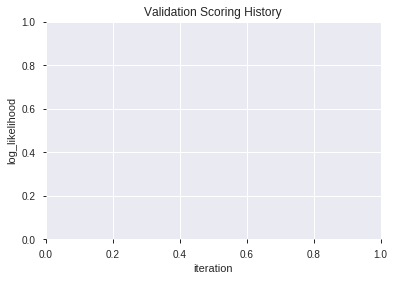

In [52]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20190825_183126_model_5,0.538542,0.708078,0.487623,0.506924,0.256972
1,XGBoost_grid_1_AutoML_20190825_183126_model_2,0.534672,0.700798,0.470529,0.503591,0.253604
2,XGBoost_2_AutoML_20190825_183126,0.527657,0.702847,0.495726,0.504661,0.254683
3,XGBoost_grid_1_AutoML_20190825_183126_model_1,0.517981,0.754536,0.491453,0.527303,0.278049
4,XGBoost_grid_1_AutoML_20190825_183126_model_6,0.509434,0.754978,0.500000,0.527437,0.278190
5,XGBoost_grid_1_AutoML_20190825_183126_model_7,0.501693,0.729193,0.487623,0.516400,0.266669
6,XGBoost_1_AutoML_20190825_183126,0.493227,0.728445,0.491453,0.516018,0.266275
7,XGBoost_grid_1_AutoML_20190825_183126_model_4,0.490042,0.710617,0.491453,0.508365,0.258435
8,XGBoost_grid_1_AutoML_20190825_183126_model_3,0.476778,0.737770,0.500000,0.520401,0.270818
9,XGBoost_3_AutoML_20190825_183126,0.451137,0.754548,0.495726,0.528040,0.278826


,variable,relative_importance,scaled_importance,percentage
0,BOP,395.886292,1.000000,0.018227
1,BBANDS_lowerband_8_6_2,320.414551,0.809360,0.014752
2,BBANDS_upperband_8_6_3,267.857117,0.676601,0.012332
3,BETA_12,266.357819,0.672814,0.012263
4,DIV,263.032776,0.664415,0.012110
5,TRANGE,218.423019,0.551732,0.010056
6,ADX_8,217.739883,0.550006,0.010025
7,BETA_8,208.952698,0.527810,0.009620
8,HT_PHASOR_quadrature,200.161530,0.505604,0.009216
9,MFI_14,193.937729,0.489882,0.008929


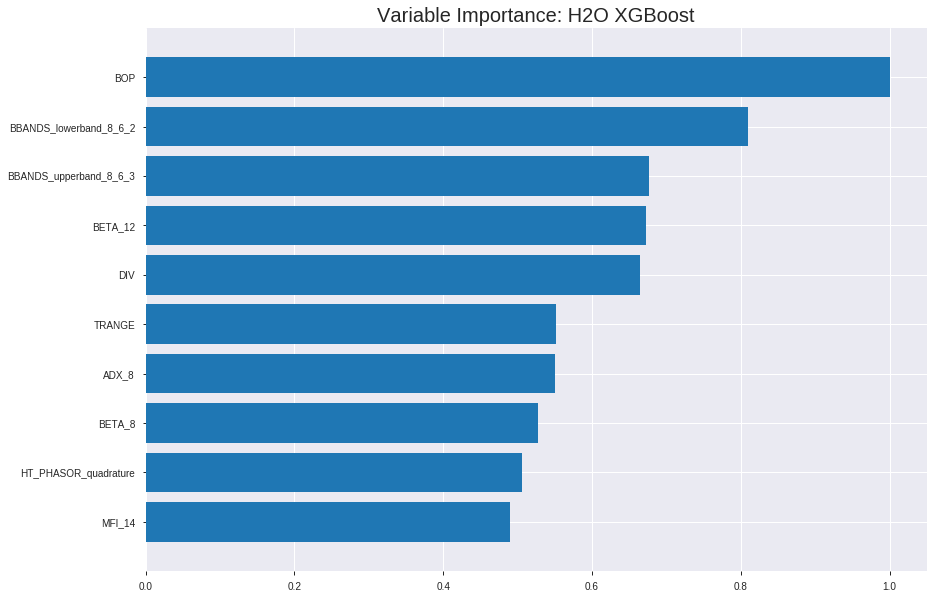

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190825_183126_model_5


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.03811843204556881
RMSE: 0.19523942236538402
LogLoss: 0.20697730903785627
Mean Per-Class Error: 0.0
AUC: 1.0
pr_auc: 0.9987437185929647
Gini: 1.0
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5445879697799683: 


,0,1,Error,Rate
0,760.0,0.0,0.0,(0.0/760.0)
1,0.0,796.0,0.0,(0.0/796.0)
Total,760.0,796.0,0.0,(0.0/1556.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5445880,1.0,202.0
max f2,0.5445880,1.0,202.0
max f0point5,0.5445880,1.0,202.0
max accuracy,0.5445880,1.0,202.0
max precision,0.9342743,1.0,0.0
max recall,0.5445880,1.0,202.0
max specificity,0.9342743,1.0,0.0
max absolute_mcc,0.5445880,1.0,202.0
max min_per_class_accuracy,0.5445880,1.0,202.0
max mean_per_class_accuracy,0.5445880,1.0,202.0


Gains/Lift Table: Avg response rate: 51.16 %, avg score: 50.81 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0102828,0.9154854,1.9547739,1.9547739,1.0,0.9213608,1.0,0.9213608,0.0201005,0.0201005,95.4773869,95.4773869
,2,0.0205656,0.9054134,1.9547739,1.9547739,1.0,0.9104977,1.0,0.9159293,0.0201005,0.0402010,95.4773869,95.4773869
,3,0.0302057,0.8972714,1.9547739,1.9547739,1.0,0.9013509,1.0,0.9112766,0.0188442,0.0590452,95.4773869,95.4773869
,4,0.0404884,0.8910926,1.9547739,1.9547739,1.0,0.8944352,1.0,0.9069994,0.0201005,0.0791457,95.4773869,95.4773869
,5,0.0501285,0.8869259,1.9547739,1.9547739,1.0,0.8887877,1.0,0.9034972,0.0188442,0.0979899,95.4773869,95.4773869
,6,0.1002571,0.8708535,1.9547739,1.9547739,1.0,0.8781440,1.0,0.8908206,0.0979899,0.1959799,95.4773869,95.4773869
,7,0.1503856,0.8581400,1.9547739,1.9547739,1.0,0.8638271,1.0,0.8818227,0.0979899,0.2939698,95.4773869,95.4773869
,8,0.2005141,0.8434764,1.9547739,1.9547739,1.0,0.8511216,1.0,0.8741474,0.0979899,0.3919598,95.4773869,95.4773869
,9,0.3001285,0.8152162,1.9547739,1.9547739,1.0,0.8303715,1.0,0.8596179,0.1947236,0.5866834,95.4773869,95.4773869
,10,0.4003856,0.7728443,1.9547739,1.9547739,1.0,0.7949945,1.0,0.8434362,0.1959799,0.7826633,95.4773869,95.4773869




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.2758197995690424
RMSE: 0.5251854906307317
LogLoss: 0.7505005237207105
Mean Per-Class Error: 0.4938503863737509
AUC: 0.45805518469069867
pr_auc: 0.4904712797016623
Gini: -0.08388963061860266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1569613218307495: 


,0,1,Error,Rate
0,0.0,214.0,1.0,(214.0/214.0)
1,0.0,231.0,0.0,(0.0/231.0)
Total,0.0,445.0,0.4809,(214.0/445.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1569613,0.6834320,399.0
max f2,0.1569613,0.8436815,399.0
max f0point5,0.1569613,0.5743411,399.0
max accuracy,0.1569613,0.5191011,399.0
max precision,0.8037865,1.0,0.0
max recall,0.1569613,1.0,399.0
max specificity,0.8037865,1.0,0.0
max absolute_mcc,0.2736045,0.1365297,380.0
max min_per_class_accuracy,0.5450351,0.4632035,192.0
max mean_per_class_accuracy,0.7500678,0.5061496,5.0


Gains/Lift Table: Avg response rate: 51.91 %, avg score: 52.47 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0112360,0.7511375,1.1558442,1.1558442,0.6,0.7769761,0.6,0.7769761,0.0129870,0.0129870,15.5844156,15.5844156
,2,0.0202247,0.7440194,0.9632035,1.0702261,0.5,0.7491235,0.5555556,0.7645972,0.0086580,0.0216450,-3.6796537,7.0226070
,3,0.0314607,0.7352457,0.3852814,0.8256030,0.2,0.7397461,0.4285714,0.7557218,0.0043290,0.0259740,-61.4718615,-17.4397032
,4,0.0404494,0.7190368,0.4816017,0.7491582,0.25,0.7265533,0.3888889,0.7492399,0.0043290,0.0303030,-51.8398268,-25.0841751
,5,0.0516854,0.7127542,1.5411255,0.9213251,0.8,0.7158288,0.4782609,0.7419766,0.0173160,0.0476190,54.1125541,-7.8674948
,6,0.1011236,0.6722457,0.7880756,0.8561809,0.4090909,0.6917747,0.4444444,0.7174335,0.0389610,0.0865801,-21.1924439,-14.3819144
,7,0.1505618,0.6460387,1.0507674,0.9200749,0.5454545,0.6596276,0.4776119,0.6984524,0.0519481,0.1385281,5.0767414,-7.9925050
,8,0.2,0.6273319,0.6129477,0.8441558,0.3181818,0.6346210,0.4382022,0.6826739,0.0303030,0.1688312,-38.7052342,-15.5844156
,9,0.3011236,0.5938197,0.9846080,0.8913226,0.5111111,0.6069315,0.4626866,0.6572380,0.0995671,0.2683983,-1.5392015,-10.8677392
,10,0.4,0.5627095,1.0507674,0.9307359,0.5454545,0.5796598,0.4831461,0.6380614,0.1038961,0.3722944,5.0767414,-6.9264069



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-08-25 18:31:46,9.428 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4884319,0.5,0.6931472,0.5,0.0,1.0,0.4808989
,2019-08-25 18:31:47,10.405 sec,5.0,0.4453112,0.5888815,0.9759298,0.9764572,1.9547739,0.0777635,0.5026389,0.6985036,0.4880851,0.5047175,0.7705628,0.4808989
,2019-08-25 18:31:47,10.948 sec,10.0,0.4006109,0.5101885,0.9941318,0.9936438,1.9547739,0.0308483,0.5068832,0.7072010,0.4570943,0.4873310,0.7705628,0.4808989
,2019-08-25 18:31:48,11.457 sec,15.0,0.3622125,0.4464599,0.9977999,0.9967471,1.9547739,0.0199229,0.5102749,0.7143659,0.4501558,0.4860235,1.1558442,0.4808989
,2019-08-25 18:31:48,12.023 sec,20.0,0.3319125,0.3986165,0.9991371,0.9954203,1.9547739,0.0122108,0.5124009,0.7191320,0.4554456,0.4793710,0.7705628,0.4808989
,2019-08-25 18:31:49,12.571 sec,25.0,0.3017250,0.3530345,0.9998537,0.9973483,1.9547739,0.0064267,0.5166979,0.7288748,0.4529878,0.4851073,1.1558442,0.4808989
,2019-08-25 18:31:50,13.157 sec,30.0,0.2739410,0.3129119,0.9999562,0.9974456,1.9547739,0.0038560,0.5193526,0.7348808,0.4469899,0.4836960,1.5411255,0.4786517
,2019-08-25 18:31:50,13.712 sec,35.0,0.2505410,0.2800052,0.9999901,0.9987343,1.9547739,0.0006427,0.5196033,0.7358562,0.4525934,0.4888832,1.5411255,0.4808989
,2019-08-25 18:31:51,14.271 sec,40.0,0.2312264,0.2538084,1.0,0.9974874,1.9547739,0.0,0.5216416,0.7416046,0.4594004,0.4922973,1.5411255,0.4808989
,2019-08-25 18:31:51,14.824 sec,45.0,0.2119954,0.2285273,1.0,0.9987437,1.9547739,0.0,0.5247592,0.7493303,0.4573674,0.4869708,1.1558442,0.4808989


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
BOP,395.8862915,1.0,0.0182270
BBANDS_lowerband_8_6_2,320.4145508,0.8093601,0.0147522
BBANDS_upperband_8_6_3,267.8571167,0.6766011,0.0123324
BETA_12,266.3578186,0.6728139,0.0122634
DIV,263.0327759,0.6644150,0.0121103
---,---,---,---
CDLMATCHINGLOW,1.4543772,0.0036737,0.0000670
BBANDS_lowerband_14_2_4,0.8738289,0.0022073,0.0000402
BBANDS_lowerband_14_4_4,0.8245250,0.0020827,0.0000380
BBANDS_middleband_12_0_2,0.5054938,0.0012769,0.0000233



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7116: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.5650224215246636)

('F1', 0.6481481481481481)

('auc', 0.5385421706176423)

('logloss', 0.7080777658990863)

('mean_per_class_error', 0.44113852604418646)

('rmse', 0.5069237354022995)

('mse', 0.2569716735142206)

xgboost prediction progress: |████████████████████████████████████████████| 100%


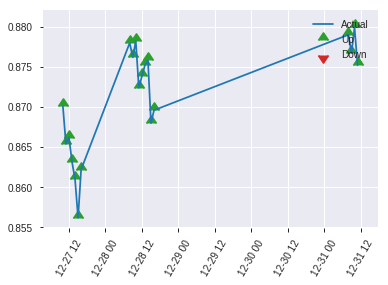


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.2569716735142206
RMSE: 0.5069237354022995
LogLoss: 0.7080777658990863
Mean Per-Class Error: 0.44113852604418646
AUC: 0.5385421706176423
pr_auc: 0.49757900231967706
Gini: 0.07708434123528463
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3556467294692993: 


,0,1,Error,Rate
0,4.0,113.0,0.9658,(113.0/117.0)
1,1.0,105.0,0.0094,(1.0/106.0)
Total,5.0,218.0,0.5112,(114.0/223.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3556467,0.6481481,217.0
max f2,0.3357538,0.8204334,221.0
max f0point5,0.4384857,0.5369515,189.0
max accuracy,0.5840726,0.5650224,78.0
max precision,0.6795639,0.5625,15.0
max recall,0.3357538,1.0,221.0
max specificity,0.7497110,0.9914530,0.0
max absolute_mcc,0.5791118,0.1216197,82.0
max min_per_class_accuracy,0.5509670,0.5299145,111.0
max mean_per_class_accuracy,0.5791118,0.5588615,82.0


Gains/Lift Table: Avg response rate: 47.53 %, avg score: 54.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0134529,0.7252986,0.7012579,0.7012579,0.3333333,0.7351368,0.3333333,0.7351368,0.0094340,0.0094340,-29.8742138,-29.8742138
,2,0.0224215,0.7134820,1.0518868,0.8415094,0.5,0.7207813,0.4,0.7293946,0.0094340,0.0188679,5.1886792,-15.8490566
,3,0.0313901,0.7012019,0.0,0.6010782,0.0,0.7069060,0.2857143,0.7229693,0.0,0.0188679,-100.0,-39.8921833
,4,0.0403587,0.6962669,1.0518868,0.7012579,0.5,0.6981783,0.3333333,0.7174602,0.0094340,0.0283019,5.1886792,-29.8742138
,5,0.0538117,0.6903352,1.4025157,0.8765723,0.6666667,0.6935237,0.4166667,0.7114761,0.0188679,0.0471698,40.2515723,-12.3427673
,6,0.1031390,0.6593627,1.3387650,1.0976210,0.6363636,0.6747312,0.5217391,0.6939024,0.0660377,0.1132075,33.8765009,9.7621001
,7,0.1524664,0.6393051,1.1475129,1.1137625,0.5454545,0.6506433,0.5294118,0.6799068,0.0566038,0.1698113,14.7512864,11.3762486
,8,0.2017937,0.6247549,0.7650086,1.0285115,0.3636364,0.6328441,0.4888889,0.6684026,0.0377358,0.2075472,-23.4991424,2.8511530
,9,0.3004484,0.6017897,1.3387650,1.1303858,0.6363636,0.6135881,0.5373134,0.6504038,0.1320755,0.3396226,33.8765009,13.0385807
,10,0.3991031,0.5685512,1.1475129,1.1346195,0.5454545,0.5842693,0.5393258,0.6340560,0.1132075,0.4528302,14.7512864,13.4619462


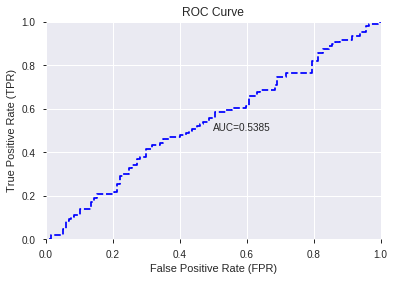

This function is available for GLM models only


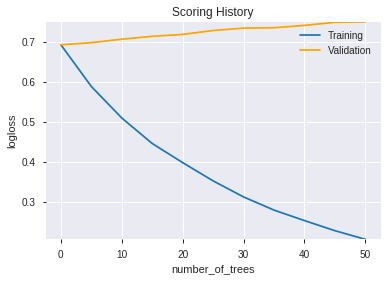

--2019-08-25 18:32:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.165.91
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.165.91|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

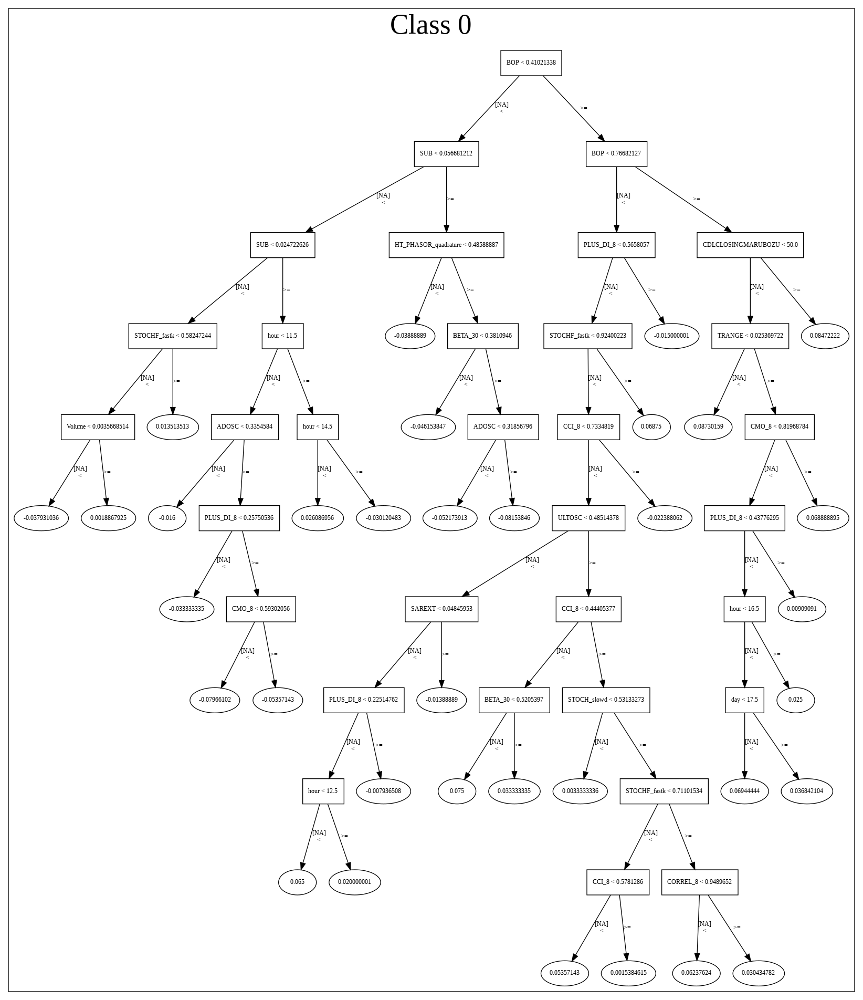

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20190825_183126_model_5',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20190825_183126_model_5',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_114_sid_b784',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_trainin

['BOP',
 'BBANDS_lowerband_8_6_2',
 'BBANDS_upperband_8_6_3',
 'BETA_12',
 'DIV',
 'TRANGE',
 'ADX_8',
 'BETA_8',
 'HT_PHASOR_quadrature',
 'MFI_14',
 'HT_DCPERIOD',
 'CCI_12',
 'MFI_20',
 'BETA_30',
 'STOCH_slowd',
 'STOCHRSI_fastd',
 'BETA_20',
 'OBV',
 'ULTOSC',
 'STOCH_slowk',
 'MINUS_DM_8',
 'HT_PHASOR_inphase',
 'MACDEXT_hist',
 'MFI_30',
 'MFI_8',
 'WILLR_8',
 'MFI_12',
 'MFI_24',
 'MACDFIX_hist_8',
 'PLUS_DI_8',
 'CCI_8',
 'PLUS_DM_8',
 'CORREL_30',
 'MOM_8',
 'BBANDS_middleband_8_6_3',
 'DX_8',
 'WILLR_12',
 'STDDEV_8',
 'DX_12',
 'AD',
 'CORREL_12',
 'ADX_12',
 'STOCHF_fastk',
 'CORREL_20',
 'STOCHRSI_fastk',
 'DX_20',
 'ADOSC',
 'CORREL_14',
 'DX_24',
 'aroonup_8',
 'BETA_14',
 'ADX_14',
 'ADXR_14',
 'BETA_24',
 'AROONOSC_30',
 'BBANDS_lowerband_8_6_3',
 'ADX_24',
 'ADX_20',
 'ADXR_8',
 'CCI_14',
 'LINEARREG_ANGLE_8',
 'ATR_8',
 'MINUS_DI_14',
 'CORREL_24',
 'CCI_20',
 'PLUS_DM_12',
 'MACDFIX_8',
 'CCI_24',
 'ADXR_12',
 'MINUS_DM_12',
 'MINUS_DI_8',
 'AROONOSC_14',
 'ROC_8',

In [53]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [54]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


DeepLearning    0.583
GLM             0.556
XGBoost         0.578
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.543,0.556,0.574
DLF,0.583,0.538,0.578
Fwe,0.583,0.556,0.574
RFE,0.552,0.552,0.565
XGBF,0.583,0.538,0.578






F1


DeepLearning    0.650
GLM             0.648
XGBoost         0.650
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.650,0.648,0.650
DLF,0.650,0.648,0.648
Fwe,0.644,0.648,0.650
RFE,0.648,0.648,0.648
XGBF,0.644,0.648,0.648






auc


DeepLearning    0.580
GLM             0.543
XGBoost         0.542
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.527,0.543,0.542
DLF,0.572,0.497,0.539
Fwe,0.580,0.543,0.542
RFE,0.533,0.538,0.539
XGBF,0.574,0.497,0.539






logloss


DeepLearning    3.503
GLM             0.718
XGBoost         0.721
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.694,0.717,0.721
DLF,1.018,0.694,0.703
Fwe,3.503,0.717,0.721
RFE,0.805,0.718,0.708
XGBF,0.730,0.694,0.703






mean_per_class_error


DeepLearning    0.447
GLM             0.470
XGBoost         0.442
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.446,0.444,0.442
DLF,0.412,0.470,0.433
Fwe,0.418,0.444,0.442
RFE,0.447,0.440,0.441
XGBF,0.426,0.470,0.433






rmse


DeepLearning    0.718
GLM             0.512
XGBoost         0.513
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.500,0.512,0.513
DLF,0.566,0.501,0.504
Fwe,0.718,0.512,0.513
RFE,0.535,0.512,0.507
XGBF,0.512,0.501,0.504






mse


DeepLearning    0.516
GLM             0.262
XGBoost         0.264
dtype: float64

,DeepLearning,GLM,XGBoost
All,0.250,0.262,0.264
DLF,0.320,0.251,0.254
Fwe,0.516,0.262,0.264
RFE,0.286,0.262,0.257
XGBF,0.262,0.251,0.254


{'F1':       DeepLearning    GLM  XGBoost
 All          0.650    NaN      NaN
 DLF          0.650    NaN      NaN
 DLF            NaN  0.648      NaN
 DLF            NaN    NaN    0.648
 All            NaN  0.648      NaN
 All            NaN    NaN    0.650
 XGBF         0.644    NaN      NaN
 XGBF           NaN  0.648      NaN
 XGBF           NaN    NaN    0.648
 Fwe          0.644    NaN      NaN
 Fwe            NaN  0.648      NaN
 Fwe            NaN    NaN    0.650
 RFE          0.648    NaN      NaN
 RFE            NaN  0.648      NaN
 RFE            NaN    NaN    0.648,
 'accuracy':       DeepLearning    GLM  XGBoost
 All          0.543    NaN      NaN
 DLF          0.583    NaN      NaN
 DLF            NaN  0.538      NaN
 DLF            NaN    NaN    0.578
 All            NaN  0.556      NaN
 All            NaN    NaN    0.574
 XGBF         0.583    NaN      NaN
 XGBF           NaN  0.538      NaN
 XGBF           NaN    NaN    0.578
 Fwe          0.583    NaN      NaN
 Fwe     